<a id="title_ID"></a>
# JWST Pipeline Validation Testing Notebook: Calwebb_Image3, Tweakreg step with MIRI imaging

<span style="color:red"> **Instruments Affected**</span>: FGS, MIRI, NIRCam, NIRISS 

Tested on MIRI Simulated data

### Table of Contents
<div style="text-align: left"> 

<br>  [Introduction](#intro_ID) <br> [Run JWST Pipelines](#pipeline_ID) <br> [Imports](#imports_ID) <br> [Create an association table for your cal files and run them through calwebb_image3](#runpipeline_ID) <br> [Find Stars in Image and Determine their Coordinates](#runscript_ID) <br> [Compare RA and Dec to expected Values](#residual_ID) <br> [About This Notebook](#about_ID) <br>


</div>

<a id="intro_ID"></a>
# Introduction


This test is designed to test the tweakreg step in the calwebb_image3 pipeline. At the start of the calwebb_image3 pipeline, the shifts between the images in an association table are found. This step creates image catalogs of point-like sources whose centroids are then used to compute corrections to the WCS of the input images such that sky catalogs obtained from the image catalogs using the corrected WCS will align on the sky.

For more information on the pipeline step visit the links below. 

Step description: https://jwst-pipeline.readthedocs.io/en/latest/jwst/tweakreg/README.html

Pipeline code: https://github.com/spacetelescope/jwst/tree/master/jwst/tweakreg

The data for this test were created with the MIRI Data Simulator, and the documentation for that code can be found here: http://miri.ster.kuleuven.be/bin/view/Public/MIRISim_Public


### Calibration WG Requested Algorithm: 

A short description and link to the page: https://outerspace.stsci.edu/display/JWSTCC/Vanilla+Refine+WCS


### Defining Terms
Definition of terms or acronymns.

JWST: James Webb Space Telescope

MIRI: Mid-Infrared Instrument

MIRISim: MIRI Data Simulator

### Description of test

This test is performed by creating a set of simulated data with multiple point sources located at specified coordinates. The simulator puts in the expected distortion, so the initial output data comes out of the simulator in distorted coordinates. When this data is then run through calwebb_detector1, calwebb_image2 and calwebbb_image3, the combined, undistorted image should have the point sources registered at the expected locations. In flight, this test can be repeated with known stars that should be found at their expected coordinates. If there is a shift in coordinates between the images that was not expected, tweakreg will find the sources to create a better image alignment. This is checked by using DAOStarFinder to find the point sources in each image (individual and combined) so that the catalogs can be compared to the expected RA and Dec values that were used to create the images. The user will look at whether the statistics of the combined sources are better or worse than those of the individual images.

### Description of data

The data used in this simulation were created with the MIRISim simulator.

The simulation consists of eight files, two exposures each at four different dither positions. The images used in this test have 50 bright point sources scattered across the images, and were created in the F1130W filter.



[Top of Page](#title_ID)

In [1]:
import os
if 'CRDS_CACHE_TYPE' in os.environ:
    if os.environ['CRDS_CACHE_TYPE'] == 'local':
        os.environ['CRDS_PATH'] = os.path.join(os.environ['HOME'], 'crds', 'cache')
    elif os.path.isdir(os.environ['CRDS_CACHE_TYPE']):
        os.environ['CRDS_PATH'] = os.environ['CRDS_CACHE_TYPE']
print('CRDS cache location: {}'.format(os.environ['CRDS_PATH']))

CRDS cache location: /grp/crds/cache


In [2]:
# set up import statements
from astropy.io import ascii, fits
from astropy.stats import sigma_clipped_stats
from astropy.table import Column
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
from astropy import table
from astropy.table import Table
import astropy.units as u
from astropy.coordinates import SkyCoord, match_coordinates_sky

#from ci_watson.artifactory_helpers import get_bigdata
import glob
from itertools import product
from ci_watson.artifactory_helpers import get_bigdata

# Box download imports 
from astropy.utils.data import download_file
from pathlib import Path
from shutil import move
from os.path import splitext

from jwst.datamodels import DrizProductModel, ImageModel
from jwst.pipeline import Detector1Pipeline, Image2Pipeline, Image3Pipeline
from jwst import associations
from jwst.associations.lib.rules_level3_base import DMS_Level3_Base
from jwst.associations import asn_from_list

import math
import matplotlib.pyplot as plt
import numpy as np
import os
from photutils import CircularAperture, DAOStarFinder, CircularAnnulus, aperture_photometry

### Create a temporary directory to work in and read in data

In [3]:
# Create a temporary directory to hold notebook output, and change the working directory to that directory.
from tempfile import TemporaryDirectory
import os
data_dir = TemporaryDirectory()
os.chdir(data_dir.name)
print(data_dir)

<TemporaryDirectory '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp90cicwdg'>


In [4]:
#print("Downloading input files")
 
#This readnoise file is needed for use with simulated data which has higher readnoise than actual data.
#readnoise = get_bigdata('jwst_validation_notebooks',
#                     'validation_data',
#                     'jump',                     
#                     'jump_miri_test', 
#                     'jwst_mirisim_readnoise.fits')

#filelist = ['starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1.fits', 
#            'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2.fits',
#            'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1.fits',
#            'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2.fits',
#            'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1.fits',
#            'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2.fits',
#            'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1.fits',
#            'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2.fits']

#for file in filelist:
#    input_file = get_bigdata('jwst_validation_notebooks',
#                     'validation_data',
#                     'outlier_detection',
#                     'outlier_detection_miri_test',
#                     file)
    
#coords = get_bigdata('jwst_validation_notebooks',
#                     'validation_data',
#                     'resample',
#                     'resample_miri_test', 
#                     'radec_4ptdith_50star_mosaic_coords.txt')    

#print("Finished Downloads")


In [5]:
# Read rate files in from Box rather than starting with uncal and running through calwebb_detector1

def get_box_files(file_list):
    for box_url,file_name in file_list:
        if 'https' not in box_url:
            box_url = 'https://stsci.box.com/shared/static/' + box_url
        downloaded_file = download_file(box_url)
        if Path(file_name).suffix == '':
            ext = splitext(box_url)[1]
            file_name += ext
        move(downloaded_file, file_name)

        
file_urls = ['https://stsci.box.com/shared/static/46kwitm6fswmeiuw4gu6xxgeioy7dhca.fits',
             'https://stsci.box.com/shared/static/8vs4njvio6y15cdcl3rjtb4veb55h6o9.fits',
             'https://stsci.box.com/shared/static/09xjv0lpe35o50f2xf4ydu523g03s9fd.fits',
             'https://stsci.box.com/shared/static/tqay5edhq1hstayk897ugd8t5sjbbjme.fits',
             'https://stsci.box.com/shared/static/rmri5jb6gwpezva2rgzkkguoeos7nocv.fits',
             'https://stsci.box.com/shared/static/pdtjm55j5ahj08i1rm91jw5p2ijpvi68.fits',
             'https://stsci.box.com/shared/static/bw5jsrorue4g2eprpd06w8sdvy6etqhv.fits',
             'https://stsci.box.com/shared/static/y3thiqwcyihw30vndpy16o8bjxn36o89.fits',
             'https://stsci.box.com/shared/static/u2wc9ocug98ut8arz383oid0eru06qbo.txt']
    
file_names = ['starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_rate.fits', 
            'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_rate.fits',
            'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_rate.fits',
            'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits',
            'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_rate.fits',
            'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_rate.fits',
            'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_rate.fits',
            'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_rate.fits',
            'radec_4ptdith_50star_mosaic_coords.txt']

    
box_download_list = [(url,name) for url,name in zip(file_urls,file_names)]


get_box_files(box_download_list)
    

In [6]:
coords = 'radec_4ptdith_50star_mosaic_coords.txt'

### Run the calwebb_detector1 pipeline to get rate.fits files.

In [7]:
# Run the calwebb_detector1 pipeline

# set up pipeline parameters 
#rej_thresh=10.0  # rejection threshold for jump step

#print('There are ', len(filelist), ' images.')
    
#slopelist = []    
    
# loop over list of files
#for file in filelist:
       
    # set up pipeline parameters for input
#    pipe1 = Detector1Pipeline()
#    pipe1.jump.rejection_threshold = rej_thresh
#    pipe1.jump.override_readnoise = readnoise
#    pipe1.ramp_fit.override_readnoise = readnoise

#    pipe1.refpix.skip = True  # needs update to simulator for this to work properly with simulated data
        
    # set up output file name
#    base, remainder = file.split('.')
#    outname = base
        
#    pipe1.jump.output_file = outname+'.fits'    
    #pipe1.ramp_fit.output_file = outname+'.fits'
#    pipe1.output_file = outname+'.fits'

    # Run pipeline on each file
#    rampfile = pipe1.run(file)
#    slopelist.append(rampfile)
    
    # Close the input files
    #file.close()

#print('Detector 1 steps completed on all files.')
#print(slopelist)

In [8]:
slopelist = ['starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_rate.fits', 
            'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_rate.fits',
            'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_rate.fits',
            'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits',
            'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_rate.fits',
            'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_rate.fits',
            'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_rate.fits',
            'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_rate.fits']

### Run calwebb_image2 pipeline to create cal.fits files

In [9]:
# Run Calwebb_image2 on output files from detector1
    
print('There are ', len(slopelist), ' images.')

callist = []
ratefilenames = []

# cycle through files
for file in slopelist:
    rampfile = ImageModel(file)
    
    # create an object for the pipeline    
    pipe2 = Image2Pipeline()
    
    filename = rampfile.meta.filename
    ratefilenames.append(filename)
    # Set pipeline parameters

    pipe2.save_results = True
    pipe2.output_file = filename +'_cal.fits'
    pipe2.resample.save_results = True
    pipe2.suffix = None

    calfile = pipe2.run(rampfile)

    callist.append(calfile)

print(callist)

There are  8  images.


2022-06-20 22:00:59,069 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2022-06-20 22:00:59,071 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2022-06-20 22:00:59,074 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2022-06-20 22:00:59,076 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2022-06-20 22:00:59,077 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2022-06-20 22:00:59,080 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2022-06-20 22:00:59,206 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:00:59,211 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp90cicwdg/starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_rate.fits_cal.fits', 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'out

2022-06-20 22:00:59,219 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2022-06-20 22:00:59,568 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is '/grp/crds/cache/references/jwst/jwst_miri_area_0004.fits'.


2022-06-20 22:00:59,571 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2022-06-20 22:00:59,572 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2022-06-20 22:00:59,573 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2022-06-20 22:00:59,574 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2022-06-20 22:00:59,574 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is '/grp/crds/cache/references/jwst/jwst_miri_distortion_0028.asdf'.


2022-06-20 22:00:59,577 - stpipe.Image2Pipeline - INFO - Prefetch for DRIZPARS reference file is '/grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits'.


2022-06-20 22:00:59,579 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2022-06-20 22:00:59,580 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is '/grp/crds/cache/references/jwst/jwst_miri_filteroffset_0005.asdf'.


2022-06-20 22:00:59,582 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is '/grp/crds/cache/references/jwst/jwst_miri_flat_0626.fits'.


2022-06-20 22:00:59,584 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2022-06-20 22:00:59,584 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2022-06-20 22:00:59,585 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2022-06-20 22:00:59,586 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2022-06-20 22:00:59,586 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2022-06-20 22:00:59,587 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2022-06-20 22:00:59,588 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2022-06-20 22:00:59,588 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is '/grp/crds/cache/references/jwst/jwst_miri_photom_0073.fits'.


2022-06-20 22:00:59,590 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2022-06-20 22:00:59,591 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2022-06-20 22:00:59,592 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2022-06-20 22:00:59,592 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2022-06-20 22:00:59,593 - stpipe.Image2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


2022-06-20 22:00:59,593 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2022-06-20 22:00:59,655 - stpipe.Image2Pipeline - INFO - Processing product starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_rate.fits_cal


2022-06-20 22:00:59,657 - stpipe.Image2Pipeline - INFO - Working on input <ImageModel(1024, 1032) from starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_rate.fits> ...


2022-06-20 22:00:59,889 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:00:59,892 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2022-06-20 22:01:00,095 - stpipe.Image2Pipeline.assign_wcs - INFO - Created a MIRI mir_image pipeline with references {'distortion': '/grp/crds/cache/references/jwst/jwst_miri_distortion_0028.asdf', 'filteroffset': '/grp/crds/cache/references/jwst/jwst_miri_filteroffset_0005.asdf', 'specwcs': None, 'regions': None, 'wavelengthrange': None, 'camera': None, 'collimator': None, 'disperser': None, 'fore': None, 'fpa': None, 'msa': None, 'ote': None, 'ifupost': None, 'ifufore': None, 'ifuslicer': None}


2022-06-20 22:01:00,174 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  0.019532876 -0.016147752 0.021999558 0.015037465 359.990697171 0.017630270 359.987889494 -0.013568846


2022-06-20 22:01:00,175 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  0.019532876 -0.016147752 0.021999558 0.015037465 359.990697171 0.017630270 359.987889494 -0.013568846


2022-06-20 22:01:00,175 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2022-06-20 22:01:00,213 - stpipe.Image2Pipeline.assign_wcs - WARNING - /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.10/site-packages/astropy/modeling/fitting.py:789: AstropyUserWarning: The fit may be poorly conditioned

  warnings.warn("The fit may be poorly conditioned\n",



2022-06-20 22:01:00,273 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2022-06-20 22:01:00,467 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:01:00,469 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


2022-06-20 22:01:00,637 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_PARTIAL_DATA does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:00,638 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_LOW_QUAL does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:00,639 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_UNRELIABLE_ERROR does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:00,646 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword DIFF_PATTERN does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:00,785 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2022-06-20 22:01:00,987 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:01:00,990 - stpipe.Image2Pipeline.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'inverse': False, 'source_type': None}


2022-06-20 22:01:01,015 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: /grp/crds/cache/references/jwst/jwst_miri_photom_0073.fits


2022-06-20 22:01:01,016 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: /grp/crds/cache/references/jwst/jwst_miri_area_0004.fits


2022-06-20 22:01:01,097 - stpipe.Image2Pipeline.photom - INFO - Using instrument: MIRI


2022-06-20 22:01:01,098 - stpipe.Image2Pipeline.photom - INFO -  detector: MIRIMAGE


2022-06-20 22:01:01,098 - stpipe.Image2Pipeline.photom - INFO -  exp_type: MIR_IMAGE


2022-06-20 22:01:01,099 - stpipe.Image2Pipeline.photom - INFO -  filter: F1130W


2022-06-20 22:01:01,169 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2022-06-20 22:01:01,172 - stpipe.Image2Pipeline.photom - INFO -  subarray: FULL


2022-06-20 22:01:01,173 - stpipe.Image2Pipeline.photom - WARNING - Expected to find one matching row in table, found 0.


2022-06-20 22:01:01,175 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 2.54947


2022-06-20 22:01:01,192 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2022-06-20 22:01:01,393 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:01:01,395 - stpipe.Image2Pipeline.resample - INFO - Step resample parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'i2d', 'search_output_file': True, 'input_dir': '', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'weight_type': 'ivm', 'output_shape': None, 'crpix': None, 'crval': None, 'rotation': None, 'pixel_scale_ratio': 1.0, 'pixel_scale': None, 'single': False, 'blendheaders': True, 'allowed_memory': None}


2022-06-20 22:01:01,422 - stpipe.Image2Pipeline.resample - INFO - Drizpars reference file: /grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits


2022-06-20 22:01:01,570 - stpipe.Image2Pipeline.resample - INFO - Resampling science data


2022-06-20 22:01:02,209 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:02,563 - stpipe.Image2Pipeline.resample - INFO - Resampling var_rnoise


2022-06-20 22:01:03,267 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:03,626 - stpipe.Image2Pipeline.resample - INFO - Resampling var_poisson


2022-06-20 22:01:04,253 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:04,619 - stpipe.Image2Pipeline.resample - INFO - Resampling var_flat


2022-06-20 22:01:05,264 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:05,659 - stpipe.Image2Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  0.019529633 -0.016360379 0.022280129 0.014982155 359.990661583 0.017756872 359.987911088 -0.013585662


2022-06-20 22:01:05,797 - stpipe.Image2Pipeline.resample - INFO - Saved model in starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_i2d.fits


2022-06-20 22:01:05,799 - stpipe.Image2Pipeline.resample - INFO - Step resample done


2022-06-20 22:01:05,799 - stpipe.Image2Pipeline - INFO - Finished processing product starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_rate.fits_cal


2022-06-20 22:01:05,802 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2022-06-20 22:01:05,803 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_0874.pmap


2022-06-20 22:01:05,978 - stpipe.Image2Pipeline - INFO - Saved model in starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal.fits


2022-06-20 22:01:05,979 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2022-06-20 22:01:06,019 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2022-06-20 22:01:06,021 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2022-06-20 22:01:06,023 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2022-06-20 22:01:06,024 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2022-06-20 22:01:06,025 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2022-06-20 22:01:06,027 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2022-06-20 22:01:06,208 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:06,213 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp90cicwdg/starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_rate.fits_cal.fits', 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'out

2022-06-20 22:01:06,221 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2022-06-20 22:01:06,230 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is '/grp/crds/cache/references/jwst/jwst_miri_area_0004.fits'.


2022-06-20 22:01:06,232 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2022-06-20 22:01:06,232 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2022-06-20 22:01:06,233 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2022-06-20 22:01:06,234 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2022-06-20 22:01:06,234 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is '/grp/crds/cache/references/jwst/jwst_miri_distortion_0028.asdf'.


2022-06-20 22:01:06,236 - stpipe.Image2Pipeline - INFO - Prefetch for DRIZPARS reference file is '/grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits'.


2022-06-20 22:01:06,238 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2022-06-20 22:01:06,239 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is '/grp/crds/cache/references/jwst/jwst_miri_filteroffset_0005.asdf'.


2022-06-20 22:01:06,241 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is '/grp/crds/cache/references/jwst/jwst_miri_flat_0626.fits'.


2022-06-20 22:01:06,243 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2022-06-20 22:01:06,243 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2022-06-20 22:01:06,244 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2022-06-20 22:01:06,244 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2022-06-20 22:01:06,244 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2022-06-20 22:01:06,245 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2022-06-20 22:01:06,245 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2022-06-20 22:01:06,246 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is '/grp/crds/cache/references/jwst/jwst_miri_photom_0073.fits'.


2022-06-20 22:01:06,247 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2022-06-20 22:01:06,248 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2022-06-20 22:01:06,248 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2022-06-20 22:01:06,249 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2022-06-20 22:01:06,249 - stpipe.Image2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


2022-06-20 22:01:06,250 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2022-06-20 22:01:06,312 - stpipe.Image2Pipeline - INFO - Processing product starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_rate.fits_cal


2022-06-20 22:01:06,314 - stpipe.Image2Pipeline - INFO - Working on input <ImageModel(1024, 1032) from starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_rate.fits> ...


2022-06-20 22:01:06,484 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:06,486 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2022-06-20 22:01:06,674 - stpipe.Image2Pipeline.assign_wcs - INFO - Created a MIRI mir_image pipeline with references {'distortion': '/grp/crds/cache/references/jwst/jwst_miri_distortion_0028.asdf', 'filteroffset': '/grp/crds/cache/references/jwst/jwst_miri_filteroffset_0005.asdf', 'specwcs': None, 'regions': None, 'wavelengthrange': None, 'camera': None, 'collimator': None, 'disperser': None, 'fore': None, 'fpa': None, 'msa': None, 'ote': None, 'ifupost': None, 'ifufore': None, 'ifuslicer': None}


2022-06-20 22:01:06,765 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  0.019532876 -0.016147752 0.021999558 0.015037465 359.990697171 0.017630270 359.987889494 -0.013568846


2022-06-20 22:01:06,766 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  0.019532876 -0.016147752 0.021999558 0.015037465 359.990697171 0.017630270 359.987889494 -0.013568846


2022-06-20 22:01:06,767 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2022-06-20 22:01:06,804 - stpipe.Image2Pipeline.assign_wcs - WARNING - /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.10/site-packages/astropy/modeling/fitting.py:789: AstropyUserWarning: The fit may be poorly conditioned

  warnings.warn("The fit may be poorly conditioned\n",



2022-06-20 22:01:06,862 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2022-06-20 22:01:06,988 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:06,990 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


2022-06-20 22:01:07,106 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_PARTIAL_DATA does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:07,108 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_LOW_QUAL does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:07,109 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_UNRELIABLE_ERROR does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:07,117 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword DIFF_PATTERN does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:07,258 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2022-06-20 22:01:07,383 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:07,385 - stpipe.Image2Pipeline.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'inverse': False, 'source_type': None}


2022-06-20 22:01:07,410 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: /grp/crds/cache/references/jwst/jwst_miri_photom_0073.fits


2022-06-20 22:01:07,411 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: /grp/crds/cache/references/jwst/jwst_miri_area_0004.fits


2022-06-20 22:01:07,495 - stpipe.Image2Pipeline.photom - INFO - Using instrument: MIRI


2022-06-20 22:01:07,497 - stpipe.Image2Pipeline.photom - INFO -  detector: MIRIMAGE


2022-06-20 22:01:07,497 - stpipe.Image2Pipeline.photom - INFO -  exp_type: MIR_IMAGE


2022-06-20 22:01:07,498 - stpipe.Image2Pipeline.photom - INFO -  filter: F1130W


2022-06-20 22:01:07,546 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2022-06-20 22:01:07,549 - stpipe.Image2Pipeline.photom - INFO -  subarray: FULL


2022-06-20 22:01:07,550 - stpipe.Image2Pipeline.photom - WARNING - Expected to find one matching row in table, found 0.


2022-06-20 22:01:07,551 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 2.54947


2022-06-20 22:01:07,569 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2022-06-20 22:01:07,701 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:07,704 - stpipe.Image2Pipeline.resample - INFO - Step resample parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'i2d', 'search_output_file': True, 'input_dir': '', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'weight_type': 'ivm', 'output_shape': None, 'crpix': None, 'crval': None, 'rotation': None, 'pixel_scale_ratio': 1.0, 'pixel_scale': None, 'single': False, 'blendheaders': True, 'allowed_memory': None}


2022-06-20 22:01:07,730 - stpipe.Image2Pipeline.resample - INFO - Drizpars reference file: /grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits


2022-06-20 22:01:07,860 - stpipe.Image2Pipeline.resample - INFO - Resampling science data


2022-06-20 22:01:08,462 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:08,813 - stpipe.Image2Pipeline.resample - INFO - Resampling var_rnoise


2022-06-20 22:01:09,403 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:09,769 - stpipe.Image2Pipeline.resample - INFO - Resampling var_poisson


2022-06-20 22:01:10,379 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:10,738 - stpipe.Image2Pipeline.resample - INFO - Resampling var_flat


2022-06-20 22:01:11,356 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:11,744 - stpipe.Image2Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  0.019529633 -0.016360379 0.022280129 0.014982155 359.990661583 0.017756872 359.987911088 -0.013585662


2022-06-20 22:01:11,874 - stpipe.Image2Pipeline.resample - INFO - Saved model in starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_i2d.fits


2022-06-20 22:01:11,875 - stpipe.Image2Pipeline.resample - INFO - Step resample done


2022-06-20 22:01:11,876 - stpipe.Image2Pipeline - INFO - Finished processing product starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_rate.fits_cal


2022-06-20 22:01:11,878 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2022-06-20 22:01:11,880 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_0874.pmap


2022-06-20 22:01:12,056 - stpipe.Image2Pipeline - INFO - Saved model in starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal.fits


2022-06-20 22:01:12,058 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2022-06-20 22:01:12,099 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2022-06-20 22:01:12,101 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2022-06-20 22:01:12,102 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2022-06-20 22:01:12,104 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2022-06-20 22:01:12,106 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2022-06-20 22:01:12,108 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2022-06-20 22:01:12,262 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:01:12,269 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp90cicwdg/starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_rate.fits_cal.fits', 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'out

2022-06-20 22:01:12,278 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2022-06-20 22:01:12,281 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is '/grp/crds/cache/references/jwst/jwst_miri_area_0004.fits'.


2022-06-20 22:01:12,285 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2022-06-20 22:01:12,286 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2022-06-20 22:01:12,287 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2022-06-20 22:01:12,288 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2022-06-20 22:01:12,288 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is '/grp/crds/cache/references/jwst/jwst_miri_distortion_0028.asdf'.


2022-06-20 22:01:12,291 - stpipe.Image2Pipeline - INFO - Prefetch for DRIZPARS reference file is '/grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits'.


2022-06-20 22:01:12,293 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2022-06-20 22:01:12,294 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is '/grp/crds/cache/references/jwst/jwst_miri_filteroffset_0005.asdf'.


2022-06-20 22:01:12,296 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is '/grp/crds/cache/references/jwst/jwst_miri_flat_0626.fits'.


2022-06-20 22:01:12,298 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2022-06-20 22:01:12,299 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2022-06-20 22:01:12,299 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2022-06-20 22:01:12,300 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2022-06-20 22:01:12,300 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2022-06-20 22:01:12,301 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2022-06-20 22:01:12,302 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2022-06-20 22:01:12,302 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is '/grp/crds/cache/references/jwst/jwst_miri_photom_0073.fits'.


2022-06-20 22:01:12,304 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2022-06-20 22:01:12,305 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2022-06-20 22:01:12,305 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2022-06-20 22:01:12,305 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2022-06-20 22:01:12,306 - stpipe.Image2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


2022-06-20 22:01:12,306 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2022-06-20 22:01:12,361 - stpipe.Image2Pipeline - INFO - Processing product starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_rate.fits_cal


2022-06-20 22:01:12,362 - stpipe.Image2Pipeline - INFO - Working on input <ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_rate.fits> ...


2022-06-20 22:01:12,480 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:01:12,481 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2022-06-20 22:01:12,670 - stpipe.Image2Pipeline.assign_wcs - INFO - Created a MIRI mir_image pipeline with references {'distortion': '/grp/crds/cache/references/jwst/jwst_miri_distortion_0028.asdf', 'filteroffset': '/grp/crds/cache/references/jwst/jwst_miri_filteroffset_0005.asdf', 'specwcs': None, 'regions': None, 'wavelengthrange': None, 'camera': None, 'collimator': None, 'disperser': None, 'fore': None, 'fpa': None, 'msa': None, 'ote': None, 'ifupost': None, 'ifufore': None, 'ifuslicer': None}


2022-06-20 22:01:12,744 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  0.020172025 -0.017469545 0.022638707 0.013715672 359.991336319 0.016308478 359.988528642 -0.014890638


2022-06-20 22:01:12,745 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  0.020172025 -0.017469545 0.022638707 0.013715672 359.991336319 0.016308478 359.988528642 -0.014890638


2022-06-20 22:01:12,746 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2022-06-20 22:01:12,782 - stpipe.Image2Pipeline.assign_wcs - WARNING - /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.10/site-packages/astropy/modeling/fitting.py:789: AstropyUserWarning: The fit may be poorly conditioned

  warnings.warn("The fit may be poorly conditioned\n",



2022-06-20 22:01:12,840 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2022-06-20 22:01:12,957 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:01:12,959 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


2022-06-20 22:01:13,067 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_PARTIAL_DATA does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:13,068 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_LOW_QUAL does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:13,069 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_UNRELIABLE_ERROR does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:13,076 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword DIFF_PATTERN does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:13,206 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2022-06-20 22:01:13,322 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:01:13,323 - stpipe.Image2Pipeline.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'inverse': False, 'source_type': None}


2022-06-20 22:01:13,348 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: /grp/crds/cache/references/jwst/jwst_miri_photom_0073.fits


2022-06-20 22:01:13,349 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: /grp/crds/cache/references/jwst/jwst_miri_area_0004.fits


2022-06-20 22:01:13,435 - stpipe.Image2Pipeline.photom - INFO - Using instrument: MIRI


2022-06-20 22:01:13,436 - stpipe.Image2Pipeline.photom - INFO -  detector: MIRIMAGE


2022-06-20 22:01:13,437 - stpipe.Image2Pipeline.photom - INFO -  exp_type: MIR_IMAGE


2022-06-20 22:01:13,437 - stpipe.Image2Pipeline.photom - INFO -  filter: F1130W


2022-06-20 22:01:13,487 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2022-06-20 22:01:13,489 - stpipe.Image2Pipeline.photom - INFO -  subarray: FULL


2022-06-20 22:01:13,490 - stpipe.Image2Pipeline.photom - WARNING - Expected to find one matching row in table, found 0.


2022-06-20 22:01:13,491 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 2.54947


2022-06-20 22:01:13,510 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2022-06-20 22:01:13,644 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:01:13,646 - stpipe.Image2Pipeline.resample - INFO - Step resample parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'i2d', 'search_output_file': True, 'input_dir': '', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'weight_type': 'ivm', 'output_shape': None, 'crpix': None, 'crval': None, 'rotation': None, 'pixel_scale_ratio': 1.0, 'pixel_scale': None, 'single': False, 'blendheaders': True, 'allowed_memory': None}


2022-06-20 22:01:13,672 - stpipe.Image2Pipeline.resample - INFO - Drizpars reference file: /grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits


2022-06-20 22:01:13,805 - stpipe.Image2Pipeline.resample - INFO - Resampling science data


2022-06-20 22:01:14,387 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:14,738 - stpipe.Image2Pipeline.resample - INFO - Resampling var_rnoise


2022-06-20 22:01:15,326 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:15,680 - stpipe.Image2Pipeline.resample - INFO - Resampling var_poisson


2022-06-20 22:01:16,249 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:16,607 - stpipe.Image2Pipeline.resample - INFO - Resampling var_flat


2022-06-20 22:01:17,184 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:17,570 - stpipe.Image2Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  0.020168782 -0.017682172 0.022919277 0.013660362 359.991300731 0.016435079 359.988550236 -0.014907455


2022-06-20 22:01:17,691 - stpipe.Image2Pipeline.resample - INFO - Saved model in starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_i2d.fits


2022-06-20 22:01:17,692 - stpipe.Image2Pipeline.resample - INFO - Step resample done


2022-06-20 22:01:17,693 - stpipe.Image2Pipeline - INFO - Finished processing product starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_rate.fits_cal


2022-06-20 22:01:17,695 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2022-06-20 22:01:17,696 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_0874.pmap


2022-06-20 22:01:17,859 - stpipe.Image2Pipeline - INFO - Saved model in starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal.fits


2022-06-20 22:01:17,860 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2022-06-20 22:01:17,898 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2022-06-20 22:01:17,900 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2022-06-20 22:01:17,902 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2022-06-20 22:01:17,903 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2022-06-20 22:01:17,904 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2022-06-20 22:01:17,906 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2022-06-20 22:01:18,055 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:18,061 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp90cicwdg/starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits_cal.fits', 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'out

2022-06-20 22:01:18,071 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2022-06-20 22:01:18,080 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is '/grp/crds/cache/references/jwst/jwst_miri_area_0004.fits'.


2022-06-20 22:01:18,082 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2022-06-20 22:01:18,082 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2022-06-20 22:01:18,083 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2022-06-20 22:01:18,084 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2022-06-20 22:01:18,084 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is '/grp/crds/cache/references/jwst/jwst_miri_distortion_0028.asdf'.


2022-06-20 22:01:18,086 - stpipe.Image2Pipeline - INFO - Prefetch for DRIZPARS reference file is '/grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits'.


2022-06-20 22:01:18,087 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2022-06-20 22:01:18,088 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is '/grp/crds/cache/references/jwst/jwst_miri_filteroffset_0005.asdf'.


2022-06-20 22:01:18,089 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is '/grp/crds/cache/references/jwst/jwst_miri_flat_0626.fits'.


2022-06-20 22:01:18,090 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2022-06-20 22:01:18,091 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2022-06-20 22:01:18,091 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2022-06-20 22:01:18,092 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2022-06-20 22:01:18,092 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2022-06-20 22:01:18,093 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2022-06-20 22:01:18,093 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2022-06-20 22:01:18,093 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is '/grp/crds/cache/references/jwst/jwst_miri_photom_0073.fits'.


2022-06-20 22:01:18,095 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2022-06-20 22:01:18,096 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2022-06-20 22:01:18,096 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2022-06-20 22:01:18,097 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2022-06-20 22:01:18,097 - stpipe.Image2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


2022-06-20 22:01:18,098 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2022-06-20 22:01:18,146 - stpipe.Image2Pipeline - INFO - Processing product starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits_cal


2022-06-20 22:01:18,148 - stpipe.Image2Pipeline - INFO - Working on input <ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits> ...


2022-06-20 22:01:18,270 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:18,272 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2022-06-20 22:01:18,458 - stpipe.Image2Pipeline.assign_wcs - INFO - Created a MIRI mir_image pipeline with references {'distortion': '/grp/crds/cache/references/jwst/jwst_miri_distortion_0028.asdf', 'filteroffset': '/grp/crds/cache/references/jwst/jwst_miri_filteroffset_0005.asdf', 'specwcs': None, 'regions': None, 'wavelengthrange': None, 'camera': None, 'collimator': None, 'disperser': None, 'fore': None, 'fpa': None, 'msa': None, 'ote': None, 'ifupost': None, 'ifufore': None, 'ifuslicer': None}


2022-06-20 22:01:18,530 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  0.020172025 -0.017469545 0.022638707 0.013715672 359.991336319 0.016308478 359.988528642 -0.014890638


2022-06-20 22:01:18,531 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  0.020172025 -0.017469545 0.022638707 0.013715672 359.991336319 0.016308478 359.988528642 -0.014890638


2022-06-20 22:01:18,532 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2022-06-20 22:01:18,564 - stpipe.Image2Pipeline.assign_wcs - WARNING - /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.10/site-packages/astropy/modeling/fitting.py:789: AstropyUserWarning: The fit may be poorly conditioned

  warnings.warn("The fit may be poorly conditioned\n",



2022-06-20 22:01:18,621 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2022-06-20 22:01:18,742 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:18,744 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


2022-06-20 22:01:18,855 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_PARTIAL_DATA does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:18,856 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_LOW_QUAL does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:18,857 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_UNRELIABLE_ERROR does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:18,864 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword DIFF_PATTERN does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:19,000 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2022-06-20 22:01:19,130 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:19,132 - stpipe.Image2Pipeline.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'inverse': False, 'source_type': None}


2022-06-20 22:01:19,160 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: /grp/crds/cache/references/jwst/jwst_miri_photom_0073.fits


2022-06-20 22:01:19,161 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: /grp/crds/cache/references/jwst/jwst_miri_area_0004.fits


2022-06-20 22:01:19,245 - stpipe.Image2Pipeline.photom - INFO - Using instrument: MIRI


2022-06-20 22:01:19,247 - stpipe.Image2Pipeline.photom - INFO -  detector: MIRIMAGE


2022-06-20 22:01:19,247 - stpipe.Image2Pipeline.photom - INFO -  exp_type: MIR_IMAGE


2022-06-20 22:01:19,248 - stpipe.Image2Pipeline.photom - INFO -  filter: F1130W


2022-06-20 22:01:19,298 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2022-06-20 22:01:19,300 - stpipe.Image2Pipeline.photom - INFO -  subarray: FULL


2022-06-20 22:01:19,301 - stpipe.Image2Pipeline.photom - WARNING - Expected to find one matching row in table, found 0.


2022-06-20 22:01:19,302 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 2.54947


2022-06-20 22:01:19,320 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2022-06-20 22:01:19,457 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:19,459 - stpipe.Image2Pipeline.resample - INFO - Step resample parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'i2d', 'search_output_file': True, 'input_dir': '', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'weight_type': 'ivm', 'output_shape': None, 'crpix': None, 'crval': None, 'rotation': None, 'pixel_scale_ratio': 1.0, 'pixel_scale': None, 'single': False, 'blendheaders': True, 'allowed_memory': None}


2022-06-20 22:01:19,488 - stpipe.Image2Pipeline.resample - INFO - Drizpars reference file: /grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits


2022-06-20 22:01:19,626 - stpipe.Image2Pipeline.resample - INFO - Resampling science data


2022-06-20 22:01:20,247 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:20,598 - stpipe.Image2Pipeline.resample - INFO - Resampling var_rnoise


2022-06-20 22:01:21,202 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:21,556 - stpipe.Image2Pipeline.resample - INFO - Resampling var_poisson


2022-06-20 22:01:22,131 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:22,491 - stpipe.Image2Pipeline.resample - INFO - Resampling var_flat


2022-06-20 22:01:23,072 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:23,446 - stpipe.Image2Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  0.020168782 -0.017682172 0.022919277 0.013660362 359.991300731 0.016435079 359.988550236 -0.014907455


2022-06-20 22:01:23,564 - stpipe.Image2Pipeline.resample - INFO - Saved model in starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_i2d.fits


2022-06-20 22:01:23,566 - stpipe.Image2Pipeline.resample - INFO - Step resample done


2022-06-20 22:01:23,567 - stpipe.Image2Pipeline - INFO - Finished processing product starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits_cal


2022-06-20 22:01:23,570 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2022-06-20 22:01:23,571 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_0874.pmap


2022-06-20 22:01:23,737 - stpipe.Image2Pipeline - INFO - Saved model in starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal.fits


2022-06-20 22:01:23,738 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2022-06-20 22:01:23,777 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2022-06-20 22:01:23,779 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2022-06-20 22:01:23,781 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2022-06-20 22:01:23,783 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2022-06-20 22:01:23,785 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2022-06-20 22:01:23,787 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2022-06-20 22:01:23,931 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:01:23,939 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp90cicwdg/starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_rate.fits_cal.fits', 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'out

2022-06-20 22:01:23,946 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2022-06-20 22:01:23,950 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is '/grp/crds/cache/references/jwst/jwst_miri_area_0004.fits'.


2022-06-20 22:01:23,954 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2022-06-20 22:01:23,955 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2022-06-20 22:01:23,956 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2022-06-20 22:01:23,957 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2022-06-20 22:01:23,959 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is '/grp/crds/cache/references/jwst/jwst_miri_distortion_0028.asdf'.


2022-06-20 22:01:23,960 - stpipe.Image2Pipeline - INFO - Prefetch for DRIZPARS reference file is '/grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits'.


2022-06-20 22:01:23,962 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2022-06-20 22:01:23,963 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is '/grp/crds/cache/references/jwst/jwst_miri_filteroffset_0005.asdf'.


2022-06-20 22:01:23,965 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is '/grp/crds/cache/references/jwst/jwst_miri_flat_0626.fits'.


2022-06-20 22:01:23,966 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2022-06-20 22:01:23,967 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2022-06-20 22:01:23,968 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2022-06-20 22:01:23,969 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2022-06-20 22:01:23,970 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2022-06-20 22:01:23,971 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2022-06-20 22:01:23,972 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2022-06-20 22:01:23,972 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is '/grp/crds/cache/references/jwst/jwst_miri_photom_0073.fits'.


2022-06-20 22:01:23,974 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2022-06-20 22:01:23,975 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2022-06-20 22:01:23,975 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2022-06-20 22:01:23,976 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2022-06-20 22:01:23,976 - stpipe.Image2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


2022-06-20 22:01:23,977 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2022-06-20 22:01:24,030 - stpipe.Image2Pipeline - INFO - Processing product starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_rate.fits_cal


2022-06-20 22:01:24,031 - stpipe.Image2Pipeline - INFO - Working on input <ImageModel(1024, 1032) from starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_rate.fits> ...


2022-06-20 22:01:24,164 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:01:24,166 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2022-06-20 22:01:24,352 - stpipe.Image2Pipeline.assign_wcs - INFO - Created a MIRI mir_image pipeline with references {'distortion': '/grp/crds/cache/references/jwst/jwst_miri_distortion_0028.asdf', 'filteroffset': '/grp/crds/cache/references/jwst/jwst_miri_filteroffset_0005.asdf', 'specwcs': None, 'regions': None, 'wavelengthrange': None, 'camera': None, 'collimator': None, 'disperser': None, 'fore': None, 'fpa': None, 'msa': None, 'ote': None, 'ifupost': None, 'ifufore': None, 'ifuslicer': None}


2022-06-20 22:01:24,423 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  0.020403170 -0.019920319 0.022869851 0.011264898 359.991567464 0.013857704 359.988759787 -0.017341412


2022-06-20 22:01:24,424 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  0.020403170 -0.019920319 0.022869851 0.011264898 359.991567464 0.013857704 359.988759787 -0.017341412


2022-06-20 22:01:24,425 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2022-06-20 22:01:24,462 - stpipe.Image2Pipeline.assign_wcs - WARNING - /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.10/site-packages/astropy/modeling/fitting.py:789: AstropyUserWarning: The fit may be poorly conditioned

  warnings.warn("The fit may be poorly conditioned\n",



2022-06-20 22:01:24,521 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2022-06-20 22:01:24,649 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:01:24,651 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


2022-06-20 22:01:24,758 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_PARTIAL_DATA does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:24,759 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_LOW_QUAL does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:24,760 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_UNRELIABLE_ERROR does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:24,767 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword DIFF_PATTERN does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:24,921 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2022-06-20 22:01:25,141 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:01:25,143 - stpipe.Image2Pipeline.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'inverse': False, 'source_type': None}


2022-06-20 22:01:25,171 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: /grp/crds/cache/references/jwst/jwst_miri_photom_0073.fits


2022-06-20 22:01:25,172 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: /grp/crds/cache/references/jwst/jwst_miri_area_0004.fits


2022-06-20 22:01:25,264 - stpipe.Image2Pipeline.photom - INFO - Using instrument: MIRI


2022-06-20 22:01:25,265 - stpipe.Image2Pipeline.photom - INFO -  detector: MIRIMAGE


2022-06-20 22:01:25,266 - stpipe.Image2Pipeline.photom - INFO -  exp_type: MIR_IMAGE


2022-06-20 22:01:25,267 - stpipe.Image2Pipeline.photom - INFO -  filter: F1130W


2022-06-20 22:01:25,323 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2022-06-20 22:01:25,326 - stpipe.Image2Pipeline.photom - INFO -  subarray: FULL


2022-06-20 22:01:25,328 - stpipe.Image2Pipeline.photom - WARNING - Expected to find one matching row in table, found 0.


2022-06-20 22:01:25,329 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 2.54947


2022-06-20 22:01:25,348 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2022-06-20 22:01:25,600 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:01:25,603 - stpipe.Image2Pipeline.resample - INFO - Step resample parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'i2d', 'search_output_file': True, 'input_dir': '', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'weight_type': 'ivm', 'output_shape': None, 'crpix': None, 'crval': None, 'rotation': None, 'pixel_scale_ratio': 1.0, 'pixel_scale': None, 'single': False, 'blendheaders': True, 'allowed_memory': None}


2022-06-20 22:01:25,631 - stpipe.Image2Pipeline.resample - INFO - Drizpars reference file: /grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits


2022-06-20 22:01:25,760 - stpipe.Image2Pipeline.resample - INFO - Resampling science data


2022-06-20 22:01:26,455 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:26,809 - stpipe.Image2Pipeline.resample - INFO - Resampling var_rnoise


2022-06-20 22:01:27,429 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:27,784 - stpipe.Image2Pipeline.resample - INFO - Resampling var_poisson


2022-06-20 22:01:28,408 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:28,764 - stpipe.Image2Pipeline.resample - INFO - Resampling var_flat


2022-06-20 22:01:29,428 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:29,804 - stpipe.Image2Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  0.020399927 -0.020132946 0.023150422 0.011209589 359.991531876 0.013984305 359.988781381 -0.017358229


2022-06-20 22:01:29,925 - stpipe.Image2Pipeline.resample - INFO - Saved model in starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_i2d.fits


2022-06-20 22:01:29,926 - stpipe.Image2Pipeline.resample - INFO - Step resample done


2022-06-20 22:01:29,927 - stpipe.Image2Pipeline - INFO - Finished processing product starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_rate.fits_cal


2022-06-20 22:01:29,929 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2022-06-20 22:01:29,931 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_0874.pmap


2022-06-20 22:01:30,105 - stpipe.Image2Pipeline - INFO - Saved model in starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal.fits


2022-06-20 22:01:30,106 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2022-06-20 22:01:30,144 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2022-06-20 22:01:30,146 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2022-06-20 22:01:30,147 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2022-06-20 22:01:30,149 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2022-06-20 22:01:30,150 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2022-06-20 22:01:30,152 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2022-06-20 22:01:30,317 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:30,321 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp90cicwdg/starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_rate.fits_cal.fits', 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'out

2022-06-20 22:01:30,329 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2022-06-20 22:01:30,335 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is '/grp/crds/cache/references/jwst/jwst_miri_area_0004.fits'.


2022-06-20 22:01:30,336 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2022-06-20 22:01:30,337 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2022-06-20 22:01:30,338 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2022-06-20 22:01:30,338 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2022-06-20 22:01:30,339 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is '/grp/crds/cache/references/jwst/jwst_miri_distortion_0028.asdf'.


2022-06-20 22:01:30,340 - stpipe.Image2Pipeline - INFO - Prefetch for DRIZPARS reference file is '/grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits'.


2022-06-20 22:01:30,341 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2022-06-20 22:01:30,342 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is '/grp/crds/cache/references/jwst/jwst_miri_filteroffset_0005.asdf'.


2022-06-20 22:01:30,343 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is '/grp/crds/cache/references/jwst/jwst_miri_flat_0626.fits'.


2022-06-20 22:01:30,345 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2022-06-20 22:01:30,346 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2022-06-20 22:01:30,346 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2022-06-20 22:01:30,347 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2022-06-20 22:01:30,347 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2022-06-20 22:01:30,347 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2022-06-20 22:01:30,348 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2022-06-20 22:01:30,348 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is '/grp/crds/cache/references/jwst/jwst_miri_photom_0073.fits'.


2022-06-20 22:01:30,349 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2022-06-20 22:01:30,350 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2022-06-20 22:01:30,350 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2022-06-20 22:01:30,351 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2022-06-20 22:01:30,351 - stpipe.Image2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


2022-06-20 22:01:30,352 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2022-06-20 22:01:30,396 - stpipe.Image2Pipeline - INFO - Processing product starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_rate.fits_cal


2022-06-20 22:01:30,397 - stpipe.Image2Pipeline - INFO - Working on input <ImageModel(1024, 1032) from starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_rate.fits> ...


2022-06-20 22:01:30,528 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:30,530 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2022-06-20 22:01:30,714 - stpipe.Image2Pipeline.assign_wcs - INFO - Created a MIRI mir_image pipeline with references {'distortion': '/grp/crds/cache/references/jwst/jwst_miri_distortion_0028.asdf', 'filteroffset': '/grp/crds/cache/references/jwst/jwst_miri_filteroffset_0005.asdf', 'specwcs': None, 'regions': None, 'wavelengthrange': None, 'camera': None, 'collimator': None, 'disperser': None, 'fore': None, 'fpa': None, 'msa': None, 'ote': None, 'ifupost': None, 'ifufore': None, 'ifuslicer': None}


2022-06-20 22:01:30,783 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  0.020403170 -0.019920319 0.022869851 0.011264898 359.991567464 0.013857704 359.988759787 -0.017341412


2022-06-20 22:01:30,784 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  0.020403170 -0.019920319 0.022869851 0.011264898 359.991567464 0.013857704 359.988759787 -0.017341412


2022-06-20 22:01:30,785 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2022-06-20 22:01:30,822 - stpipe.Image2Pipeline.assign_wcs - WARNING - /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.10/site-packages/astropy/modeling/fitting.py:789: AstropyUserWarning: The fit may be poorly conditioned

  warnings.warn("The fit may be poorly conditioned\n",



2022-06-20 22:01:30,879 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2022-06-20 22:01:31,010 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:31,012 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


2022-06-20 22:01:31,124 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_PARTIAL_DATA does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:31,125 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_LOW_QUAL does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:31,126 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_UNRELIABLE_ERROR does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:31,132 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword DIFF_PATTERN does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:31,266 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2022-06-20 22:01:31,400 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:31,401 - stpipe.Image2Pipeline.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'inverse': False, 'source_type': None}


2022-06-20 22:01:31,428 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: /grp/crds/cache/references/jwst/jwst_miri_photom_0073.fits


2022-06-20 22:01:31,429 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: /grp/crds/cache/references/jwst/jwst_miri_area_0004.fits


2022-06-20 22:01:31,510 - stpipe.Image2Pipeline.photom - INFO - Using instrument: MIRI


2022-06-20 22:01:31,511 - stpipe.Image2Pipeline.photom - INFO -  detector: MIRIMAGE


2022-06-20 22:01:31,512 - stpipe.Image2Pipeline.photom - INFO -  exp_type: MIR_IMAGE


2022-06-20 22:01:31,512 - stpipe.Image2Pipeline.photom - INFO -  filter: F1130W


2022-06-20 22:01:31,558 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2022-06-20 22:01:31,561 - stpipe.Image2Pipeline.photom - INFO -  subarray: FULL


2022-06-20 22:01:31,562 - stpipe.Image2Pipeline.photom - WARNING - Expected to find one matching row in table, found 0.


2022-06-20 22:01:31,563 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 2.54947


2022-06-20 22:01:31,580 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2022-06-20 22:01:31,712 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:31,714 - stpipe.Image2Pipeline.resample - INFO - Step resample parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'i2d', 'search_output_file': True, 'input_dir': '', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'weight_type': 'ivm', 'output_shape': None, 'crpix': None, 'crval': None, 'rotation': None, 'pixel_scale_ratio': 1.0, 'pixel_scale': None, 'single': False, 'blendheaders': True, 'allowed_memory': None}


2022-06-20 22:01:31,741 - stpipe.Image2Pipeline.resample - INFO - Drizpars reference file: /grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits


2022-06-20 22:01:31,867 - stpipe.Image2Pipeline.resample - INFO - Resampling science data


2022-06-20 22:01:32,521 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:32,889 - stpipe.Image2Pipeline.resample - INFO - Resampling var_rnoise


2022-06-20 22:01:33,488 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:33,845 - stpipe.Image2Pipeline.resample - INFO - Resampling var_poisson


2022-06-20 22:01:34,419 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:34,771 - stpipe.Image2Pipeline.resample - INFO - Resampling var_flat


2022-06-20 22:01:35,337 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:35,711 - stpipe.Image2Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  0.020399927 -0.020132946 0.023150422 0.011209589 359.991531876 0.013984305 359.988781381 -0.017358229


2022-06-20 22:01:35,836 - stpipe.Image2Pipeline.resample - INFO - Saved model in starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_i2d.fits


2022-06-20 22:01:35,837 - stpipe.Image2Pipeline.resample - INFO - Step resample done


2022-06-20 22:01:35,838 - stpipe.Image2Pipeline - INFO - Finished processing product starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_rate.fits_cal


2022-06-20 22:01:35,839 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2022-06-20 22:01:35,840 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_0874.pmap


2022-06-20 22:01:35,999 - stpipe.Image2Pipeline - INFO - Saved model in starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal.fits


2022-06-20 22:01:36,000 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2022-06-20 22:01:36,037 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2022-06-20 22:01:36,039 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2022-06-20 22:01:36,040 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2022-06-20 22:01:36,042 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2022-06-20 22:01:36,043 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2022-06-20 22:01:36,045 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2022-06-20 22:01:36,196 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:01:36,201 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp90cicwdg/starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_rate.fits_cal.fits', 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'out

2022-06-20 22:01:36,208 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2022-06-20 22:01:36,212 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is '/grp/crds/cache/references/jwst/jwst_miri_area_0004.fits'.


2022-06-20 22:01:36,215 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2022-06-20 22:01:36,215 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2022-06-20 22:01:36,216 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2022-06-20 22:01:36,217 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2022-06-20 22:01:36,217 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is '/grp/crds/cache/references/jwst/jwst_miri_distortion_0028.asdf'.


2022-06-20 22:01:36,219 - stpipe.Image2Pipeline - INFO - Prefetch for DRIZPARS reference file is '/grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits'.


2022-06-20 22:01:36,220 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2022-06-20 22:01:36,221 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is '/grp/crds/cache/references/jwst/jwst_miri_filteroffset_0005.asdf'.


2022-06-20 22:01:36,222 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is '/grp/crds/cache/references/jwst/jwst_miri_flat_0626.fits'.


2022-06-20 22:01:36,223 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2022-06-20 22:01:36,224 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2022-06-20 22:01:36,224 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2022-06-20 22:01:36,225 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2022-06-20 22:01:36,225 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2022-06-20 22:01:36,226 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2022-06-20 22:01:36,226 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2022-06-20 22:01:36,227 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is '/grp/crds/cache/references/jwst/jwst_miri_photom_0073.fits'.


2022-06-20 22:01:36,228 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2022-06-20 22:01:36,228 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2022-06-20 22:01:36,229 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2022-06-20 22:01:36,229 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2022-06-20 22:01:36,230 - stpipe.Image2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


2022-06-20 22:01:36,230 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2022-06-20 22:01:36,276 - stpipe.Image2Pipeline - INFO - Processing product starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_rate.fits_cal


2022-06-20 22:01:36,277 - stpipe.Image2Pipeline - INFO - Working on input <ImageModel(1024, 1032) from starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_rate.fits> ...


2022-06-20 22:01:36,414 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:01:36,416 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2022-06-20 22:01:36,603 - stpipe.Image2Pipeline.assign_wcs - INFO - Created a MIRI mir_image pipeline with references {'distortion': '/grp/crds/cache/references/jwst/jwst_miri_distortion_0028.asdf', 'filteroffset': '/grp/crds/cache/references/jwst/jwst_miri_filteroffset_0005.asdf', 'specwcs': None, 'regions': None, 'wavelengthrange': None, 'camera': None, 'collimator': None, 'disperser': None, 'fore': None, 'fpa': None, 'msa': None, 'ote': None, 'ifupost': None, 'ifufore': None, 'ifuslicer': None}


2022-06-20 22:01:36,674 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  0.021939052 -0.019421471 0.024405733 0.011763747 359.993103346 0.014356552 359.990295669 -0.016842564


2022-06-20 22:01:36,675 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  0.021939052 -0.019421471 0.024405733 0.011763747 359.993103346 0.014356552 359.990295669 -0.016842564


2022-06-20 22:01:36,676 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2022-06-20 22:01:36,712 - stpipe.Image2Pipeline.assign_wcs - WARNING - /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.10/site-packages/astropy/modeling/fitting.py:789: AstropyUserWarning: The fit may be poorly conditioned

  warnings.warn("The fit may be poorly conditioned\n",



2022-06-20 22:01:36,769 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2022-06-20 22:01:36,904 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:01:36,906 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


2022-06-20 22:01:37,016 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_PARTIAL_DATA does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:37,018 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_LOW_QUAL does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:37,019 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_UNRELIABLE_ERROR does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:37,025 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword DIFF_PATTERN does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:37,155 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2022-06-20 22:01:37,293 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:01:37,295 - stpipe.Image2Pipeline.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'inverse': False, 'source_type': None}


2022-06-20 22:01:37,319 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: /grp/crds/cache/references/jwst/jwst_miri_photom_0073.fits


2022-06-20 22:01:37,320 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: /grp/crds/cache/references/jwst/jwst_miri_area_0004.fits


2022-06-20 22:01:37,401 - stpipe.Image2Pipeline.photom - INFO - Using instrument: MIRI


2022-06-20 22:01:37,402 - stpipe.Image2Pipeline.photom - INFO -  detector: MIRIMAGE


2022-06-20 22:01:37,403 - stpipe.Image2Pipeline.photom - INFO -  exp_type: MIR_IMAGE


2022-06-20 22:01:37,404 - stpipe.Image2Pipeline.photom - INFO -  filter: F1130W


2022-06-20 22:01:37,452 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2022-06-20 22:01:37,454 - stpipe.Image2Pipeline.photom - INFO -  subarray: FULL


2022-06-20 22:01:37,455 - stpipe.Image2Pipeline.photom - WARNING - Expected to find one matching row in table, found 0.


2022-06-20 22:01:37,456 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 2.54947


2022-06-20 22:01:37,473 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2022-06-20 22:01:37,609 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_rate.fits>,).


2022-06-20 22:01:37,611 - stpipe.Image2Pipeline.resample - INFO - Step resample parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'i2d', 'search_output_file': True, 'input_dir': '', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'weight_type': 'ivm', 'output_shape': None, 'crpix': None, 'crval': None, 'rotation': None, 'pixel_scale_ratio': 1.0, 'pixel_scale': None, 'single': False, 'blendheaders': True, 'allowed_memory': None}


2022-06-20 22:01:37,636 - stpipe.Image2Pipeline.resample - INFO - Drizpars reference file: /grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits


2022-06-20 22:01:37,761 - stpipe.Image2Pipeline.resample - INFO - Resampling science data


2022-06-20 22:01:38,361 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:38,717 - stpipe.Image2Pipeline.resample - INFO - Resampling var_rnoise


2022-06-20 22:01:39,304 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:39,657 - stpipe.Image2Pipeline.resample - INFO - Resampling var_poisson


2022-06-20 22:01:40,234 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:40,588 - stpipe.Image2Pipeline.resample - INFO - Resampling var_flat


2022-06-20 22:01:41,152 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:41,525 - stpipe.Image2Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  0.021935809 -0.019634097 0.024686304 0.011708437 359.993067758 0.014483153 359.990317263 -0.016859381


2022-06-20 22:01:41,641 - stpipe.Image2Pipeline.resample - INFO - Saved model in starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_i2d.fits


2022-06-20 22:01:41,642 - stpipe.Image2Pipeline.resample - INFO - Step resample done


2022-06-20 22:01:41,643 - stpipe.Image2Pipeline - INFO - Finished processing product starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_rate.fits_cal


2022-06-20 22:01:41,645 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2022-06-20 22:01:41,646 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_0874.pmap


2022-06-20 22:01:41,805 - stpipe.Image2Pipeline - INFO - Saved model in starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal.fits


2022-06-20 22:01:41,806 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2022-06-20 22:01:41,844 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2022-06-20 22:01:41,845 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2022-06-20 22:01:41,847 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2022-06-20 22:01:41,849 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2022-06-20 22:01:41,850 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2022-06-20 22:01:41,852 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2022-06-20 22:01:42,005 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:42,010 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp90cicwdg/starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_rate.fits_cal.fits', 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'out

2022-06-20 22:01:42,018 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2022-06-20 22:01:42,021 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is '/grp/crds/cache/references/jwst/jwst_miri_area_0004.fits'.


2022-06-20 22:01:42,024 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2022-06-20 22:01:42,024 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2022-06-20 22:01:42,025 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2022-06-20 22:01:42,026 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2022-06-20 22:01:42,026 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is '/grp/crds/cache/references/jwst/jwst_miri_distortion_0028.asdf'.


2022-06-20 22:01:42,028 - stpipe.Image2Pipeline - INFO - Prefetch for DRIZPARS reference file is '/grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits'.


2022-06-20 22:01:42,030 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2022-06-20 22:01:42,030 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is '/grp/crds/cache/references/jwst/jwst_miri_filteroffset_0005.asdf'.


2022-06-20 22:01:42,031 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is '/grp/crds/cache/references/jwst/jwst_miri_flat_0626.fits'.


2022-06-20 22:01:42,033 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2022-06-20 22:01:42,034 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2022-06-20 22:01:42,035 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2022-06-20 22:01:42,035 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2022-06-20 22:01:42,035 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2022-06-20 22:01:42,036 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2022-06-20 22:01:42,036 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2022-06-20 22:01:42,037 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is '/grp/crds/cache/references/jwst/jwst_miri_photom_0073.fits'.


2022-06-20 22:01:42,041 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2022-06-20 22:01:42,042 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2022-06-20 22:01:42,042 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2022-06-20 22:01:42,042 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2022-06-20 22:01:42,043 - stpipe.Image2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


2022-06-20 22:01:42,043 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2022-06-20 22:01:42,087 - stpipe.Image2Pipeline - INFO - Processing product starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_rate.fits_cal


2022-06-20 22:01:42,088 - stpipe.Image2Pipeline - INFO - Working on input <ImageModel(1024, 1032) from starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_rate.fits> ...


2022-06-20 22:01:42,230 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:42,232 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2022-06-20 22:01:42,415 - stpipe.Image2Pipeline.assign_wcs - INFO - Created a MIRI mir_image pipeline with references {'distortion': '/grp/crds/cache/references/jwst/jwst_miri_distortion_0028.asdf', 'filteroffset': '/grp/crds/cache/references/jwst/jwst_miri_filteroffset_0005.asdf', 'specwcs': None, 'regions': None, 'wavelengthrange': None, 'camera': None, 'collimator': None, 'disperser': None, 'fore': None, 'fpa': None, 'msa': None, 'ote': None, 'ifupost': None, 'ifufore': None, 'ifuslicer': None}


2022-06-20 22:01:42,485 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  0.021939052 -0.019421471 0.024405733 0.011763747 359.993103346 0.014356552 359.990295669 -0.016842564


2022-06-20 22:01:42,486 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  0.021939052 -0.019421471 0.024405733 0.011763747 359.993103346 0.014356552 359.990295669 -0.016842564


2022-06-20 22:01:42,487 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2022-06-20 22:01:42,523 - stpipe.Image2Pipeline.assign_wcs - WARNING - /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.10/site-packages/astropy/modeling/fitting.py:789: AstropyUserWarning: The fit may be poorly conditioned

  warnings.warn("The fit may be poorly conditioned\n",



2022-06-20 22:01:42,579 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2022-06-20 22:01:42,719 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:42,721 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


2022-06-20 22:01:42,829 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_PARTIAL_DATA does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:42,830 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_LOW_QUAL does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:42,831 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_UNRELIABLE_ERROR does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:42,838 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword DIFF_PATTERN does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:01:42,971 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2022-06-20 22:01:43,111 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:43,113 - stpipe.Image2Pipeline.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'inverse': False, 'source_type': None}


2022-06-20 22:01:43,138 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: /grp/crds/cache/references/jwst/jwst_miri_photom_0073.fits


2022-06-20 22:01:43,138 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: /grp/crds/cache/references/jwst/jwst_miri_area_0004.fits


2022-06-20 22:01:43,221 - stpipe.Image2Pipeline.photom - INFO - Using instrument: MIRI


2022-06-20 22:01:43,222 - stpipe.Image2Pipeline.photom - INFO -  detector: MIRIMAGE


2022-06-20 22:01:43,223 - stpipe.Image2Pipeline.photom - INFO -  exp_type: MIR_IMAGE


2022-06-20 22:01:43,224 - stpipe.Image2Pipeline.photom - INFO -  filter: F1130W


2022-06-20 22:01:43,274 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2022-06-20 22:01:43,276 - stpipe.Image2Pipeline.photom - INFO -  subarray: FULL


2022-06-20 22:01:43,277 - stpipe.Image2Pipeline.photom - WARNING - Expected to find one matching row in table, found 0.


2022-06-20 22:01:43,278 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 2.54947


2022-06-20 22:01:43,295 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2022-06-20 22:01:43,434 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:01:43,436 - stpipe.Image2Pipeline.resample - INFO - Step resample parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'i2d', 'search_output_file': True, 'input_dir': '', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'weight_type': 'ivm', 'output_shape': None, 'crpix': None, 'crval': None, 'rotation': None, 'pixel_scale_ratio': 1.0, 'pixel_scale': None, 'single': False, 'blendheaders': True, 'allowed_memory': None}


2022-06-20 22:01:43,462 - stpipe.Image2Pipeline.resample - INFO - Drizpars reference file: /grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits


2022-06-20 22:01:43,589 - stpipe.Image2Pipeline.resample - INFO - Resampling science data


2022-06-20 22:01:44,198 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:44,553 - stpipe.Image2Pipeline.resample - INFO - Resampling var_rnoise


2022-06-20 22:01:45,159 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:45,526 - stpipe.Image2Pipeline.resample - INFO - Resampling var_poisson


2022-06-20 22:01:46,095 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:46,447 - stpipe.Image2Pipeline.resample - INFO - Resampling var_flat


2022-06-20 22:01:47,025 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:01:47,400 - stpipe.Image2Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  0.021935809 -0.019634097 0.024686304 0.011708437 359.993067758 0.014483153 359.990317263 -0.016859381


2022-06-20 22:01:47,517 - stpipe.Image2Pipeline.resample - INFO - Saved model in starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_i2d.fits


2022-06-20 22:01:47,519 - stpipe.Image2Pipeline.resample - INFO - Step resample done


2022-06-20 22:01:47,519 - stpipe.Image2Pipeline - INFO - Finished processing product starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_rate.fits_cal


2022-06-20 22:01:47,521 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2022-06-20 22:01:47,522 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_0874.pmap


2022-06-20 22:01:47,683 - stpipe.Image2Pipeline - INFO - Saved model in starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal.fits


2022-06-20 22:01:47,684 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


[[<ImageModel(1024, 1032) from starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal.fits>], [<ImageModel(1024, 1032) from starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal.fits>], [<ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal.fits>], [<ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal.fits>], [<ImageModel(1024, 1032) from starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal.fits>], [<ImageModel(1024, 1032) from starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal.fits>], [<ImageModel(1024, 1032) from starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal.fits>], [<ImageModel(1024, 1032) from starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal.fits>]]


In [10]:
imagelist = [ele.replace('rate', 'cal') for ele in ratefilenames]
print(imagelist)

['starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal.fits', 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal.fits', 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal.fits', 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal.fits', 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal.fits', 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal.fits', 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal.fits', 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal.fits']


## Test # 1: See what happens with tweakreg when given data with no shifts.

This test uses MIRISim data using only the simulated dithers, and no shifts. Two exposures each of four different dithers, perfect alignment. 

First look at the cal images out of calwebb_image2. 
* Use DAOStarFinder to get the x,y positions of the stars in each image
* Use wcs info from image to convert x,y positions to RA, Dec
* Compare the RA, Dec calculated values to the RA, Dec positions put into the simulated images
* Get statistics on the differences of the calculated and input positions in units of mas

starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal.fits
Image mean, median and std 11.393542 10.826687 55.011623


    xcentroid          ycentroid                RA                   Dec          
------------------ ------------------ --------------------- ----------------------
 608.5415674187961 2.5119766176307223 0.0008812919624467749  -0.014594789515541495
 685.5194495798157 5.5188105009736175     359.9985262521632  -0.014309517462321978
 886.3394041097413 32.119070281158955    359.99243205390275  -0.012997454423196865
    953.8640393199  37.04011242844017     359.9903742953238  -0.012674257323148128
444.47609551197064 61.922582668650286  0.006066875156909462  -0.013223542150700983
  708.539078792773  73.05874981354657     359.9979903713137   -0.01222441448341229
373.69156711571156  82.73445867221936   0.00829150779169885  -0.012772340592118013
 429.1719580852977   96.9350873606011 0.0066252609207797806   -0.01220541183653611
486.33656250883286 111.09479540127342 0.0049071267763785495  -0.011634212317900124
  812.818016502769 135.61499300669485     359.9949510782622  -0.010070810306428344
 550

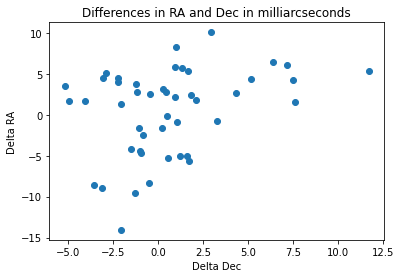

starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal.fits
Image mean, median and std 11.394609 10.827406 55.007805
    xcentroid          ycentroid                RA                     Dec          
------------------ ------------------ ---------------------- -----------------------
 608.5461714111817 2.5131153270429225  0.0008811535076687153   -0.014594743852346248
 685.5165542363047  5.522005289569982      359.9985263490218   -0.014309429398466314
 886.3377102041173  32.12032234845156     359.99243210897583   -0.012997421405947096
  953.858650908105 37.038714754591744     359.99037445698593   -0.012674313169426505
 444.4760693354769 61.921174725845646   0.006066872395400456   -0.013223584608591675
 708.5375051993097  73.05653065791925      359.9979904139565   -0.012224485327696166
 373.6920713251912  82.73362445593573   0.008291490212003361   -0.012772364504572807
 429.1710480615856   96.9361473590585  0.0066252915340002895   -0.012205382067991825
486.33656507950644  111.092996888

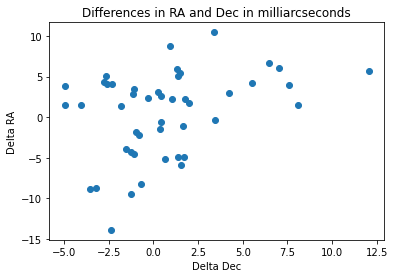

starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal.fits
Image mean, median and std 11.459499 10.829639 55.680965
    xcentroid          ycentroid                RA                    Dec          
------------------ ------------------ ---------------------- ----------------------
  632.757520509536  43.52799873198921  0.0008804967979520648  -0.014626457969967293
 709.8257801184594 47.507856164720145     359.99852516247785  -0.014311550857858348
 910.5959218383333  74.15073580836673     359.99243330115337  -0.012997209251142885
 978.1734916601412  79.09634950402457     359.99037406382115  -0.012674008968996101
 468.7130887677887 103.70932107395348   0.006068286014852335   -0.01322360404683915
  732.790984782116 114.80235210425441     359.99799208670777  -0.012224549793193257
  397.984710427444 124.51324600589399   0.008291256163280063  -0.012770390494991906
453.48648150451567  138.5482319055374   0.006624203827780067  -0.012205946184055615
 510.5826324979371 152.64448533976542   0.0

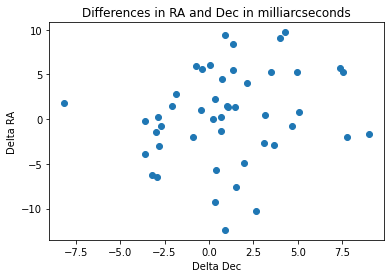

starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal.fits
Image mean, median and std 11.461396 10.8295555 55.684906
    xcentroid          ycentroid                RA                     Dec          
------------------ ------------------ ---------------------- -----------------------
 632.7561014527342  43.52872182023289  0.0008805421841502914   -0.014626439834395417
 709.8260670657803   47.5058809583951     359.99852514867274   -0.014311609453108201
 910.5951520227544  74.15262735916836     359.99243332955854   -0.012997154434847552
 978.1739871993807   79.0963228230719     359.99037404856495   -0.012674008483594294
468.71224848996206 103.70989382247947   0.006068313256945353   -0.013223588820502662
 732.7915923131342 114.80647731539594     359.99799207867466   -0.012224423456660083
397.98413357499743 124.51335799099897   0.008291274143771397   -0.012770388542114123
  453.486222463101  138.5458169269537   0.006624205620663413   -0.012206020133662565
510.58256909558963  152.64532038

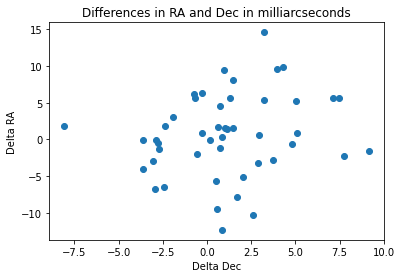

starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal.fits
Image mean, median and std 11.166319 10.819193 52.431835
    xcentroid          ycentroid                RA                     Dec          
------------------ ------------------ ---------------------- -----------------------
 646.9460364189496 123.58824806720995  0.0008803409666353219    -0.01462544759401453
 724.0252320146072  127.5820452764259      359.9985251448545      -0.014310524077353
 924.8606761687124 154.24326052907645      359.9924329361845   -0.012996383566727537
   992.45691902968 159.27374467532363     359.99037339685844   -0.012673064323221303
482.87053476521277 183.28959656865936   0.006068231603246421   -0.013222390879844007
 747.0589422960411 194.39222695244513      359.9979919488258   -0.012223096373398978
412.11218706689084 203.90829274053294   0.008291045403339596   -0.012771385160995604
467.56583952342805 217.90372011464456    0.00662635936109802    -0.01220484372594049
 524.7770858845939 231.8931155015

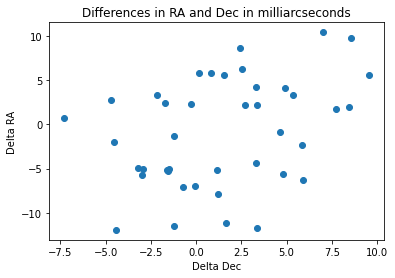

starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal.fits
Image mean, median and std 11.167205 10.820021 52.420555
    xcentroid          ycentroid                RA                    Dec          
------------------ ------------------ ---------------------- ----------------------
 646.9454800415763 123.59122321380107  0.0008803656879164385  -0.014625358834867506
 724.0256726768248 127.58013796160934      359.9985251264132   -0.01431058074881553
 924.8597080043684  154.2432706124099     359.99243296590157  -0.012996385708730001
 992.4534255006282  159.2718625921307      359.9903734990552  -0.012673130090554478
 482.8696673425391  183.2899835191299   0.006068259202637669  -0.013222381265036554
 747.0578849106864 194.39226082259032      359.9979919813537  -0.012223097981552028
 412.1139269048188 203.90945048821695    0.00829099500464183  -0.012771345469780142
467.56675428766414  217.9036290726527  0.0066263310760417415   -0.01220484420928609
 524.7779965210373 231.88761492892587   0.0

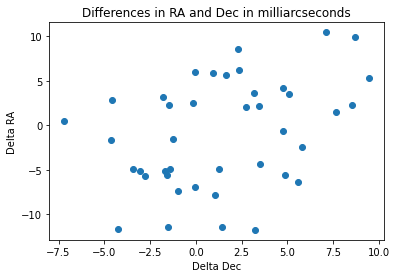

starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal.fits
Image mean, median and std 11.14942 10.819677 52.3238
    xcentroid          ycentroid                RA                     Dec          
------------------ ------------------ ---------------------- -----------------------
 695.2882988999536 103.10651467532003  0.0008800008772832899   -0.014624813910079982
 772.3744183009295  107.0815682195305      359.9985245931245   -0.014309869787115948
  973.228381685913 133.63302595063803     359.99243224223216   -0.012997673379714877
 531.2457880501139 162.90678044840305   0.006067753827247839   -0.013222863142923662
 795.4098654036351 173.99541287004112      359.9979911433319   -0.012223925183360086
  460.547711377863  183.5249036196875   0.008289441834595316   -0.012772358696295038
 515.9706963233565 197.55498823067623   0.006625409028767752   -0.012205661433268716
 573.1045796641623 211.60813499707166   0.004909149394200925    -0.01163371221201762
 899.8933788590772 236.1964594074282

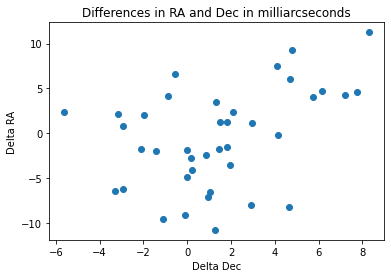

starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal.fits
Image mean, median and std 11.148314 10.819933 52.31703
    xcentroid          ycentroid                RA                    Dec          
------------------ ------------------ ---------------------- ----------------------
   695.28794170584 103.10641319490699  0.0008800115795231863   -0.01462481787900968
 772.3731936505352 107.08007937646431      359.9985246268782  -0.014309917872403828
 973.2281832908834  133.6348268676595       359.992432252969  -0.012997619538201288
 531.2461240972619 162.90616024026545   0.006067741924447004  -0.013222881168460607
 795.4082883628598  173.9964145346605     359.99799119432987   -0.01222389869223297
 460.5482539991836 183.52565213354322   0.008289427105149128  -0.012772334529918135
  515.971022928771 197.55386309448286   0.006625396116303293  -0.012205694933804823
 573.1055169320389  211.6075876893692  0.0049091192277255415  -0.011633726576394846
 899.8952017510751 236.19527724644132     35

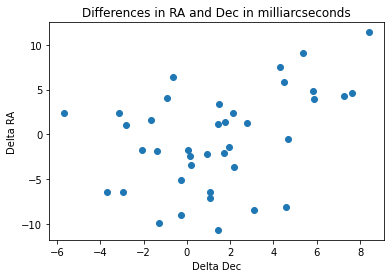

RA difference mean, median and std (units in mas) 1.1037660880047775 0.9281835036028911 3.549202125823858
Dec difference mean, median and std (units in mas) -0.06135758681286737 1.0161649008182116 5.550928948928192


In [11]:
# find stars and get RA, Dec from *_cal.fits files

# Run DAOStarFinder to find sources in image
allRAdiff_cal = []
allDecdiff_cal = []

for calimage in imagelist:
    image = ImageModel(calimage)
    
    # pull out data portion of input file
    data = image.data
    
    # print stats on input image
    print(calimage)
    mean, median, std = sigma_clipped_stats(data, sigma=200.0, maxiters=5)  # default sigma=3
    print('Image mean, median and std',mean, median, std)

    ap_radius = 5.  # radius for aperture for centroiding and photometry

    daofind = DAOStarFinder(fwhm=3.0, threshold=10.*std)    # default threshold=5*std, fwhm=3
    sources = daofind(data)     

    # Create apertures for x,y positions
    positions = tuple(zip(sources['xcentroid'], sources['ycentroid']))
    #print(positions)

    #positions = (sources['xcentroid'], sources['ycentroid'])
    apertures = CircularAperture(positions, r=ap_radius)
    
    # using wcs info from images, put coordinates into RA, Dec
    ra, dec = image.meta.wcs(sources['xcentroid'], sources['ycentroid'])

    # add RA, Dec to sources table

    ra_col = Column(name='RA', data=ra)
    dec_col = Column(name='Dec', data=dec)
    sources.add_column(ra_col)
    sources.add_column(dec_col)

    # print RA, Dec for each x, y position found
    #print(sources['xcentroid', 'ycentroid', 'RA', 'Dec'])  

    sources_sub = sources['xcentroid', 'ycentroid', 'RA', 'Dec']
    sources_sub.pprint_all()
    print()
    
    # read in text file with RA and Dec input coordinates
    RA_in, Dec_in = np.loadtxt( coords, dtype=str, unpack=True)

    # put RA and Dec into floats
    RA_sim = RA_in.astype(float)
    Dec_sim = Dec_in.astype(float)
    
    # Put ra, dec coords into a table
    cat1_sim = Table([RA_sim, Dec_sim], names=('ra', 'dec'))
    cat2_calc = Table([ra, dec], names=('ra', 'dec'))
    
    # Get coordinates with SkyCoord for each catalog
    
    coord_cat1_sim = SkyCoord(ra=cat1_sim['ra'], dec=cat1_sim['dec'], unit="deg")
    coord_cat2_calc = SkyCoord(ra=cat2_calc['ra'], dec=cat2_calc['dec'], unit="deg")
    ind_cat2_cat1, dist_2d, _ = match_coordinates_sky(coord_cat1_sim, coord_cat2_calc)
    
    # Find where the catalogs match
    
    cat1_matched = cat1_sim[dist_2d.arcsec<0.05]
    cat2_matched = cat2_calc[ind_cat2_cat1[dist_2d.arcsec<0.05]]
    
    #print(cat1_matched)
    
    # Get differences in RA, Dec
    ra_diff = cat2_matched['ra'] - cat1_matched['ra']
    dec_diff = cat2_matched['dec'] - cat1_matched['dec'] 
    
    #print(ra_diff)
    
    # put differences in milliarcseconds
    ra_diff = ra_diff * 3600000
    dec_diff = dec_diff * 3600000
    
    
    # Compare input RA, Dec to found RA, Dec
    print('RA_Diff (mas)  Dec_diff (mas) pass/fail')
    # Find if the differences are within the allowed 30 mas range
    for i in np.arange(0,len(ra_diff)):
        #if ra_diff[i] < 30 and dec_diff[i] < 30:
        allRAdiff_cal.append(ra_diff[i])
        allDecdiff_cal.append(dec_diff[i])
        if abs(ra_diff[i]) < 30 and abs(dec_diff[i]) < 30: 
            test = 'pass' 
        else: 
            test = 'fail'
        print('{:15.6f} {:15.6f} {}'.format(ra_diff[i], dec_diff[i], test))
 
    
    # Plot ra and dec differences
    plt.title ('Differences in RA and Dec in milliarcseconds')
    plt.ylabel('Delta RA')
    plt.xlabel('Delta Dec')
    plt.scatter(ra_diff,dec_diff)
    plt.show()
 
    # Plot should show no differences greater than 30 milliarcseconds  
    
meanRAdiff_cal, medianRAdiff_cal, stdRAdiff_cal = sigma_clipped_stats(allRAdiff_cal, sigma=5.0, maxiters=5)  # default sigma=3
meanDecdiff_cal, medianDecdiff_cal, stdDecdiff_cal = sigma_clipped_stats(allDecdiff_cal, sigma=5.0, maxiters=5)  # default sigma=3

print('RA difference mean, median and std (units in mas)',meanRAdiff_cal, medianRAdiff_cal, stdRAdiff_cal) 
print('Dec difference mean, median and std (units in mas)',meanDecdiff_cal, medianDecdiff_cal, stdDecdiff_cal)

### Run the images through calwebb_image3 with tweakreg on

Alter any parameters needed to get better results from tweakreg. Look at individual i2d images afterwards.

In [12]:
# use asn_from_list to create association table

#calfiles = glob.glob('starfield*_cal.fits')
asn = asn_from_list.asn_from_list(imagelist, rule=DMS_Level3_Base, product_name='starfield_50star4ptdither_combined.fits')

# use this if you need to add non'science' exposure types
#asn['products'][0]['members'][1]['exptype'] = 'background'
#asn['products'][0]['members'][2]['exptype'] = 'sourcecat'

# dump association table to a .json file for use in image3
with open('starfield_50star4ptdither_asnfile.json', 'w') as fp:
    fp.write(asn.dump()[1])

print(asn)    

jwnoprogram-a3001_none_010_asn with 1 products
Rule=DMS_Level3_Base
No constraints
Products:
	starfield_50star4ptdither_combined.fits with 8 members


In [13]:
# Run Calwebb_image3 on the association table with tweakreg on
    
# set any specific parameters
# tweakreg parameters to allow data to run
fwhm = 3.318 #3.27  # Gaussian kernel FWHM of objects expected, default=2.5
minobj = 5  # minimum number of objects needed to match positions for a good fit, default=15
snr = 40 # signal to noise threshold, default=5
sigma = 3 # clipping limit, in sigma units, used when performing fit, default=3
fit_geom ='rshift' # ftype of affine transformation to be considered when fitting catalogs, default='general'
use2dhist = False  # boolean indicating whether to use 2D histogram to find initial offset, default=True
   
pipe3=Image3Pipeline()    
pipe3.tweakreg.kernel_fwhm = fwhm
pipe3.tweakreg.snr_threshold = snr
pipe3.tweakreg.minobj = minobj
pipe3.tweakreg.sigma = sigma
pipe3.tweakreg.fitgeometry = fit_geom
pipe3.tweakreg.use2dhist = use2dhist
pipe3.tweakreg.save_catalogs = True
#pipe3.tweakreg.skip = True        # test to see if this affects the final output
pipe3.outlier_detection.skip = True # this is set in later step so mis-alignments aren't 'hidden'
pipe3.outlier_detection.skip = True
pipe3.source_catalog.save_results = True
pipe3.save_results = True
#pipe3.output_dir = datadir

# run Image3

#im = pipe3.run(rtdata.input)
image = pipe3.run('starfield_50star4ptdither_asnfile.json')
print('Image 3 pipeline finished.')

2022-06-20 22:01:50,364 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2022-06-20 22:01:50,368 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2022-06-20 22:01:50,370 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2022-06-20 22:01:50,372 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2022-06-20 22:01:50,374 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2022-06-20 22:01:50,376 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2022-06-20 22:01:50,378 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2022-06-20 22:01:50,553 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('starfield_50star4ptdither_asnfile.json',).


2022-06-20 22:01:50,562 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'steps': {'assign_mtwcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': True, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'assign_mtwcs', 'search_output_file': True, 'input_dir': ''}, 'tweakreg': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': True, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_catalogs': True, 'catalog_format': 'ecsv', 'kernel_fwhm': 3.318, 'snr_threshold': 40, 'brightest': 

2022-06-20 22:01:50,689 - stpipe.Image3Pipeline - INFO - Prefetching reference files for dataset: 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal.fits' reftypes = ['abvegaoffset', 'apcorr', 'drizpars']


2022-06-20 22:01:50,705 - stpipe.Image3Pipeline - INFO - Prefetch for ABVEGAOFFSET reference file is '/grp/crds/cache/references/jwst/jwst_miri_abvegaoffset_0001.asdf'.


2022-06-20 22:01:50,707 - stpipe.Image3Pipeline - INFO - Prefetch for APCORR reference file is '/grp/crds/cache/references/jwst/jwst_miri_apcorr_0005.fits'.


2022-06-20 22:01:50,709 - stpipe.Image3Pipeline - INFO - Prefetch for DRIZPARS reference file is '/grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits'.


2022-06-20 22:01:50,711 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2022-06-20 22:01:51,897 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<ModelContainer>,).


2022-06-20 22:01:51,899 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': True, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_catalogs': True, 'catalog_format': 'ecsv', 'kernel_fwhm': 3.318, 'snr_threshold': 40, 'brightest': 200, 'peakmax': None, 'enforce_user_order': False, 'expand_refcat': False, 'minobj': 5, 'searchrad': 2.0, 'use2dhist': False, 'separation': 1.0, 'tolerance': 0.7, 'xoffset': 0.0, 'yoffset': 0.0, 'fitgeometry': 'rshift', 'nclip': 3, 'sigma': 3, 'align_to_gaia': False, 'gaia_catalog': 'GAIADR2', 'min_gaia': 5, 'save_gaia_catalog': False}


2022-06-20 22:01:52,157 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 48 sources in starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal.fits.


2022-06-20 22:01:52,163 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal_cat.ecsv


2022-06-20 22:01:52,425 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 48 sources in starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal.fits.


2022-06-20 22:01:52,429 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal_cat.ecsv


2022-06-20 22:01:52,694 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 49 sources in starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal.fits.


2022-06-20 22:01:52,698 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal_cat.ecsv


2022-06-20 22:01:52,978 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 48 sources in starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal.fits.


2022-06-20 22:01:52,982 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal_cat.ecsv


2022-06-20 22:01:53,239 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 42 sources in starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal.fits.


2022-06-20 22:01:53,243 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal_cat.ecsv


2022-06-20 22:01:53,510 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 42 sources in starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal.fits.


2022-06-20 22:01:53,514 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal_cat.ecsv


2022-06-20 22:01:53,780 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 43 sources in starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal.fits.


2022-06-20 22:01:53,784 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal_cat.ecsv


2022-06-20 22:01:54,033 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 42 sources in starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal.fits.


2022-06-20 22:01:54,037 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal_cat.ecsv


2022-06-20 22:01:54,060 - stpipe.Image3Pipeline.tweakreg - INFO - 


2022-06-20 22:01:54,061 - stpipe.Image3Pipeline.tweakreg - INFO - Number of image groups to be aligned: 8.


2022-06-20 22:01:54,062 - stpipe.Image3Pipeline.tweakreg - INFO - Image groups:


2022-06-20 22:01:54,086 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal':


2022-06-20 22:01:54,087 - stpipe.Image3Pipeline.tweakreg - INFO -      starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal


2022-06-20 22:01:54,110 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal':


2022-06-20 22:01:54,111 - stpipe.Image3Pipeline.tweakreg - INFO -      starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal


2022-06-20 22:01:54,134 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal':


2022-06-20 22:01:54,134 - stpipe.Image3Pipeline.tweakreg - INFO -      starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal


2022-06-20 22:01:54,156 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal':


2022-06-20 22:01:54,157 - stpipe.Image3Pipeline.tweakreg - INFO -      starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal


2022-06-20 22:01:54,179 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal':


2022-06-20 22:01:54,179 - stpipe.Image3Pipeline.tweakreg - INFO -      starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal


2022-06-20 22:01:54,201 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal':


2022-06-20 22:01:54,202 - stpipe.Image3Pipeline.tweakreg - INFO -      starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal


2022-06-20 22:01:54,224 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal':


2022-06-20 22:01:54,225 - stpipe.Image3Pipeline.tweakreg - INFO -      starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal


2022-06-20 22:01:54,247 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal':


2022-06-20 22:01:54,247 - stpipe.Image3Pipeline.tweakreg - INFO -      starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal


2022-06-20 22:01:54,248 - stpipe.Image3Pipeline.tweakreg - INFO - 


2022-06-20 22:01:54,248 - stpipe.Image3Pipeline.tweakreg - INFO -  


2022-06-20 22:01:54,248 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() started on 2022-06-20 22:01:54.248463


2022-06-20 22:01:54,249 - stpipe.Image3Pipeline.tweakreg - INFO -       Version 0.7.4


2022-06-20 22:01:54,249 - stpipe.Image3Pipeline.tweakreg - INFO -  


2022-06-20 22:01:54,409 - stpipe.Image3Pipeline.tweakreg - INFO - Selected image 'GROUP ID: starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal' as reference image


2022-06-20 22:01:54,415 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal' to the reference catalog.


2022-06-20 22:01:54,532 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal' catalog with sources from the reference 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal' catalog.


2022-06-20 22:01:54,534 - stpipe.Image3Pipeline.tweakreg - INFO - Found 48 matches for 'GROUP ID: starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal'...


2022-06-20 22:01:54,535 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2022-06-20 22:01:54,537 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal:


2022-06-20 22:01:54,538 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -4.99872e-05  YSH: -1.34437e-05    ROT: 5.32927e-05    SCALE: 1


2022-06-20 22:01:54,539 - stpipe.Image3Pipeline.tweakreg - INFO - 


2022-06-20 22:01:54,539 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.000287318   FIT MAE: 0.000256544


2022-06-20 22:01:54,540 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 48 objects.


2022-06-20 22:01:54,578 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal' to the reference catalog.


2022-06-20 22:01:54,694 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal' catalog with sources from the reference 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal' catalog.


2022-06-20 22:01:54,695 - stpipe.Image3Pipeline.tweakreg - INFO - Found 47 matches for 'GROUP ID: starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal'...


2022-06-20 22:01:54,696 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2022-06-20 22:01:54,699 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal:


2022-06-20 22:01:54,700 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.000321171  YSH: -4.24579e-05    ROT: -0.000894824    SCALE: 1


2022-06-20 22:01:54,700 - stpipe.Image3Pipeline.tweakreg - INFO - 


2022-06-20 22:01:54,701 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00527931   FIT MAE: 0.00461642


2022-06-20 22:01:54,702 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 46 objects.


2022-06-20 22:01:54,740 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal' to the reference catalog.


2022-06-20 22:01:54,855 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal' catalog with sources from the reference 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal' catalog.


2022-06-20 22:01:54,857 - stpipe.Image3Pipeline.tweakreg - INFO - Found 47 matches for 'GROUP ID: starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal'...


2022-06-20 22:01:54,858 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2022-06-20 22:01:54,861 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal:


2022-06-20 22:01:54,861 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.000338653  YSH: -0.000284604    ROT: -0.000801054    SCALE: 1


2022-06-20 22:01:54,862 - stpipe.Image3Pipeline.tweakreg - INFO - 


2022-06-20 22:01:54,863 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00545887   FIT MAE: 0.00479425


2022-06-20 22:01:54,863 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 46 objects.


2022-06-20 22:01:54,902 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal' to the reference catalog.


2022-06-20 22:01:55,020 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal' catalog with sources from the reference 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal' catalog.


2022-06-20 22:01:55,022 - stpipe.Image3Pipeline.tweakreg - INFO - Found 41 matches for 'GROUP ID: starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal'...


2022-06-20 22:01:55,023 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2022-06-20 22:01:55,026 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal:


2022-06-20 22:01:55,027 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.000303586  YSH: 0.00105847    ROT: -0.000552349    SCALE: 1


2022-06-20 22:01:55,027 - stpipe.Image3Pipeline.tweakreg - INFO - 


2022-06-20 22:01:55,028 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00771548   FIT MAE: 0.00684298


2022-06-20 22:01:55,029 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 40 objects.


2022-06-20 22:01:55,068 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal' to the reference catalog.


2022-06-20 22:01:55,386 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal' catalog with sources from the reference 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal' catalog.


2022-06-20 22:01:55,388 - stpipe.Image3Pipeline.tweakreg - INFO - Found 41 matches for 'GROUP ID: starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal'...


2022-06-20 22:01:55,389 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2022-06-20 22:01:55,395 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal:


2022-06-20 22:01:55,396 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.000286148  YSH: 0.00108692    ROT: -0.000523678    SCALE: 1


2022-06-20 22:01:55,397 - stpipe.Image3Pipeline.tweakreg - INFO - 


2022-06-20 22:01:55,398 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00770516   FIT MAE: 0.00682456


2022-06-20 22:01:55,399 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 40 objects.


2022-06-20 22:01:55,441 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal' to the reference catalog.


2022-06-20 22:01:55,556 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal' catalog with sources from the reference 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal' catalog.


2022-06-20 22:01:55,558 - stpipe.Image3Pipeline.tweakreg - INFO - Found 40 matches for 'GROUP ID: starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal'...


2022-06-20 22:01:55,559 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2022-06-20 22:01:55,562 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal:


2022-06-20 22:01:55,562 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.000237614  YSH: 0.00262767    ROT: 0.000387146    SCALE: 1


2022-06-20 22:01:55,563 - stpipe.Image3Pipeline.tweakreg - INFO - 


2022-06-20 22:01:55,564 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0110158   FIT MAE: 0.0068922


2022-06-20 22:01:55,564 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 39 objects.


2022-06-20 22:01:55,603 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal' to the reference catalog.


2022-06-20 22:01:55,717 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal' catalog with sources from the reference 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal' catalog.


2022-06-20 22:01:55,719 - stpipe.Image3Pipeline.tweakreg - INFO - Found 40 matches for 'GROUP ID: starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal'...


2022-06-20 22:01:55,720 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2022-06-20 22:01:55,723 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal:


2022-06-20 22:01:55,724 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.000265638  YSH: 0.00262238    ROT: 0.000458858    SCALE: 1


2022-06-20 22:01:55,725 - stpipe.Image3Pipeline.tweakreg - INFO - 


2022-06-20 22:01:55,725 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0110242   FIT MAE: 0.00691673


2022-06-20 22:01:55,726 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 39 objects.


2022-06-20 22:01:55,764 - stpipe.Image3Pipeline.tweakreg - INFO -  


2022-06-20 22:01:55,765 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() ended on 2022-06-20 22:01:55.764884


2022-06-20 22:01:55,766 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() TOTAL RUN TIME: 0:00:01.516421


2022-06-20 22:01:55,767 - stpipe.Image3Pipeline.tweakreg - INFO -  


2022-06-20 22:01:56,222 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg done


2022-06-20 22:01:56,440 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<ModelContainer>,).


2022-06-20 22:01:56,442 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'skymethod': 'match', 'match_down': True, 'subtract': False, 'stepsize': None, 'skystat': 'mode', 'dqbits': '~DO_NOT_USE+NON_SCIENCE', 'lower': None, 'upper': None, 'nclip': 5, 'lsigma': 4.0, 'usigma': 4.0, 'binwidth': 0.1}


2022-06-20 22:01:56,680 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:01:56,682 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() started on 2022-06-20 22:01:56.680934


2022-06-20 22:01:56,682 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:01:56,683 - stpipe.Image3Pipeline.skymatch - INFO - Sky computation method: 'match'


2022-06-20 22:01:56,684 - stpipe.Image3Pipeline.skymatch - INFO - Sky matching direction: DOWN


2022-06-20 22:01:56,684 - stpipe.Image3Pipeline.skymatch - INFO - Sky subtraction from image data: OFF


2022-06-20 22:01:56,685 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:01:56,686 - stpipe.Image3Pipeline.skymatch - INFO - ----  Computing differences in sky values in overlapping regions.


2022-06-20 22:02:09,692 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal.fits. Sky background: 0.00238358


2022-06-20 22:02:09,695 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal.fits. Sky background: 0.0124171


2022-06-20 22:02:09,696 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal.fits. Sky background: 0.00851901


2022-06-20 22:02:09,697 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal.fits. Sky background: 0.00484789


2022-06-20 22:02:09,697 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal.fits. Sky background: 0


2022-06-20 22:02:09,698 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal.fits. Sky background: 0.00727946


2022-06-20 22:02:09,698 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal.fits. Sky background: 0.00377957


2022-06-20 22:02:09,699 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal.fits. Sky background: 0.0117165


2022-06-20 22:02:09,700 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:02:09,700 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() ended on 2022-06-20 22:02:09.700222


2022-06-20 22:02:09,701 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() TOTAL RUN TIME: 0:00:13.019288


2022-06-20 22:02:09,702 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:02:09,741 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch done


2022-06-20 22:02:09,942 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<ModelContainer>,).


2022-06-20 22:02:09,945 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': True, 'suffix': 'crf', 'search_output_file': False, 'input_dir': '', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None}


2022-06-20 22:02:09,946 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2022-06-20 22:02:09,958 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection done


2022-06-20 22:02:10,130 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<ModelContainer>,).


2022-06-20 22:02:10,132 - stpipe.Image3Pipeline.resample - INFO - Step resample parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'i2d', 'search_output_file': True, 'input_dir': '', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'weight_type': 'ivm', 'output_shape': None, 'crpix': None, 'crval': None, 'rotation': None, 'pixel_scale_ratio': 1.0, 'pixel_scale': None, 'single': False, 'blendheaders': True, 'allowed_memory': None}


2022-06-20 22:02:10,152 - stpipe.Image3Pipeline.resample - INFO - Drizpars reference file: /grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits


2022-06-20 22:02:10,350 - stpipe.Image3Pipeline.resample - INFO - Blending metadata for starfield_50star4ptdither_combined.fits


2022-06-20 22:02:11,061 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2022-06-20 22:02:11,800 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:12,919 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:14,042 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:15,163 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:16,316 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:17,418 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:18,530 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:19,625 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:19,977 - stpipe.Image3Pipeline.resample - INFO - Resampling var_rnoise


2022-06-20 22:02:20,565 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:21,685 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:22,789 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:23,890 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:24,983 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:26,096 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:27,202 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:28,301 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:28,663 - stpipe.Image3Pipeline.resample - INFO - Resampling var_poisson


2022-06-20 22:02:29,419 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:30,741 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:32,031 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:33,323 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:34,614 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:36,039 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:37,319 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:38,624 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:38,989 - stpipe.Image3Pipeline.resample - INFO - Resampling var_flat


2022-06-20 22:02:39,702 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:41,008 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:42,331 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:43,688 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:45,016 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:46,428 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:47,719 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:48,992 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:02:49,393 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  0.021880412 -0.020262681 0.024953861 0.014759994 359.990667213 0.017768852 359.987593764 -0.017253822


2022-06-20 22:02:49,863 - stpipe.Image3Pipeline.resample - INFO - Saved model in starfield_50star4ptdither_combined_i2d.fits


2022-06-20 22:02:49,864 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2022-06-20 22:02:50,127 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1142, 1118) from starfield_50star4ptdither_combined_i2d.fits>,).


2022-06-20 22:02:50,130 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'cat', 'search_output_file': True, 'input_dir': '', 'bkg_boxsize': 100, 'kernel_fwhm': 2.0, 'snr_threshold': 3.0, 'npixels': 5, 'deblend': False, 'aperture_ee1': 30, 'aperture_ee2': 50, 'aperture_ee3': 70, 'ci1_star_threshold': 2.0, 'ci2_star_threshold': 1.8}


2022-06-20 22:02:50,155 - stpipe.Image3Pipeline.source_catalog - INFO - Using APCORR reference file: /grp/crds/cache/references/jwst/jwst_miri_apcorr_0005.fits


2022-06-20 22:02:50,167 - stpipe.Image3Pipeline.source_catalog - INFO - Using ABVEGAOFFSET reference file: /grp/crds/cache/references/jwst/jwst_miri_abvegaoffset_0001.asdf


2022-06-20 22:02:50,169 - stpipe.Image3Pipeline.source_catalog - INFO - Instrument: MIRI


2022-06-20 22:02:50,169 - stpipe.Image3Pipeline.source_catalog - INFO - Detector: MIRIMAGE


2022-06-20 22:02:50,170 - stpipe.Image3Pipeline.source_catalog - INFO - Filter: F1130W


2022-06-20 22:02:50,171 - stpipe.Image3Pipeline.source_catalog - INFO - Subarray: FULL


2022-06-20 22:02:50,228 - stpipe.Image3Pipeline.source_catalog - INFO - AB to Vega magnitude offset 5.49349


2022-06-20 22:02:50,808 - stpipe.Image3Pipeline.source_catalog - INFO - Detected 640 sources


2022-06-20 22:02:51,486 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote source catalog: starfield_50star4ptdither_combined_cat.ecsv


2022-06-20 22:02:51,607 - stpipe.Image3Pipeline.source_catalog - INFO - Saved model in starfield_50star4ptdither_combined_segm.fits


2022-06-20 22:02:51,609 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote segmentation map: starfield_50star4ptdither_combined_segm.fits


2022-06-20 22:02:51,610 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog done


2022-06-20 22:02:51,612 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


Image 3 pipeline finished.


### Go through list of individual images and see which sources were found for each image.

In [14]:
# Get list of catalogs

cataloglist = [ele.replace('cal.fits', 'cal_cat.ecsv') for ele in imagelist]
print(imagelist)
print()
print(cataloglist)

['starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal.fits', 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal.fits', 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal.fits', 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal.fits', 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal.fits', 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal.fits', 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal.fits', 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal.fits']

['starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal_cat.ecsv', 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal_cat.ecsv', 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal_cat.ecsv', 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal_cat.ecsv', 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal_cat.ecsv', 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal_cat.ecsv', 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal_cat.ecsv', 'starfield_50star4ptdith

starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal.fits
starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal_cat.ecsv
48 sources found


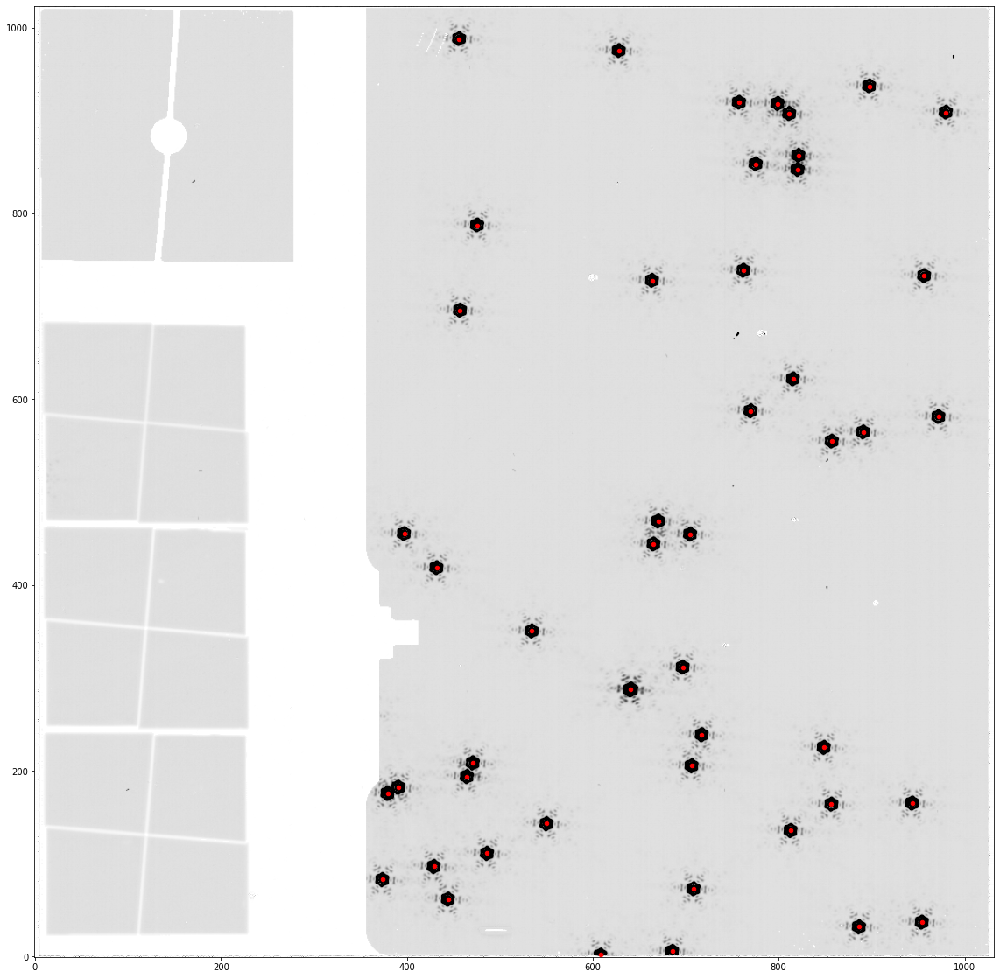


starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal.fits
starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal_cat.ecsv
48 sources found


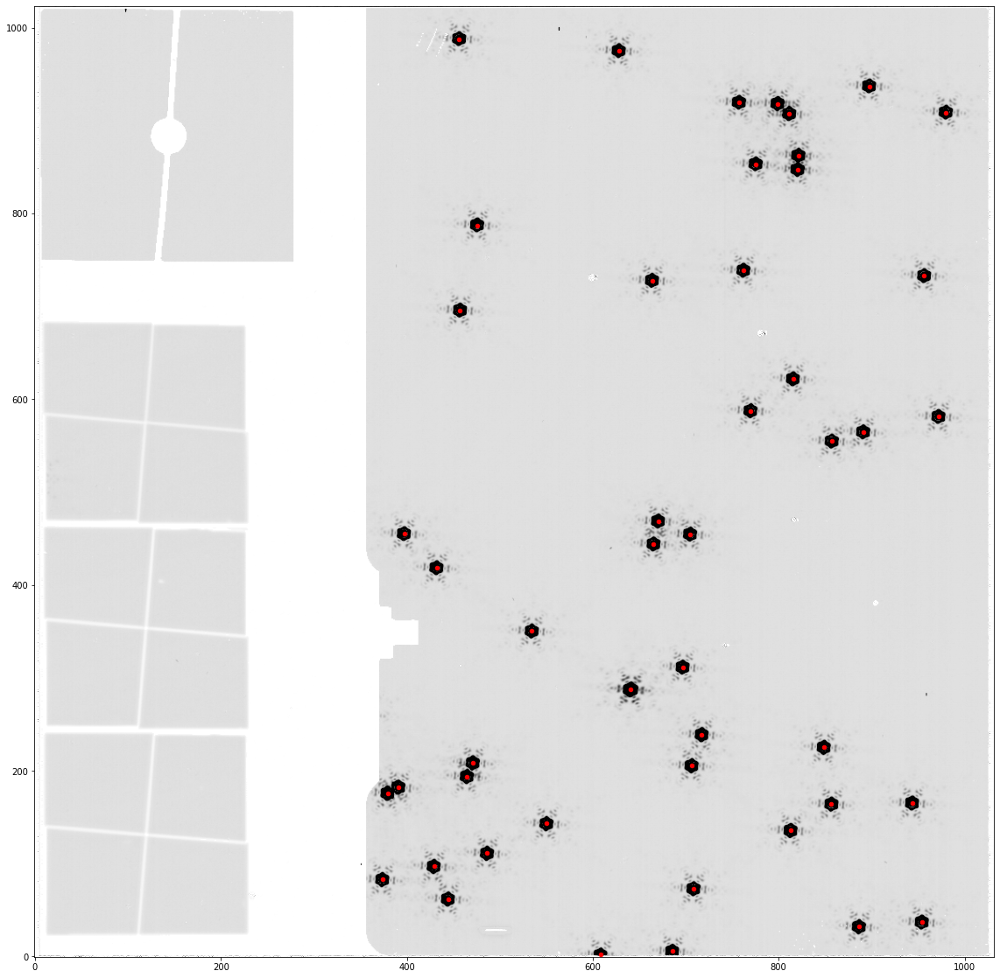


starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal.fits
starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal_cat.ecsv
49 sources found


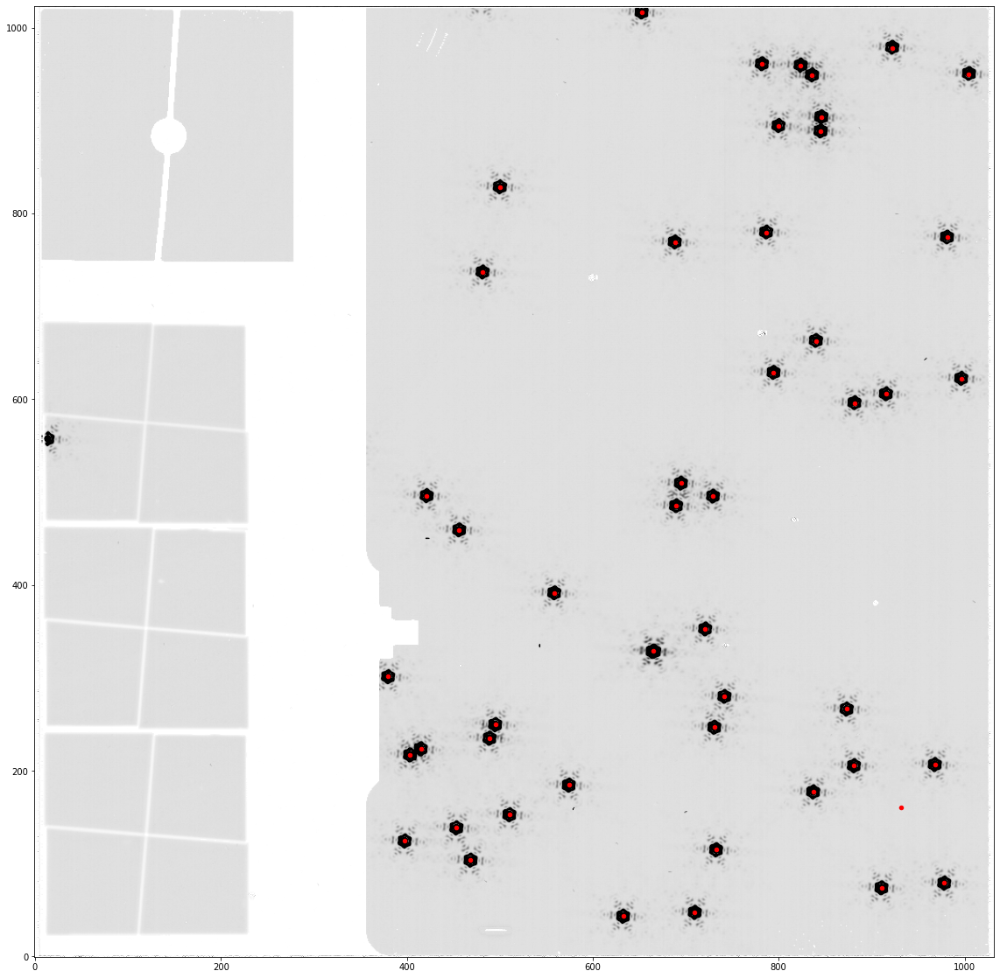


starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal.fits
starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal_cat.ecsv
48 sources found


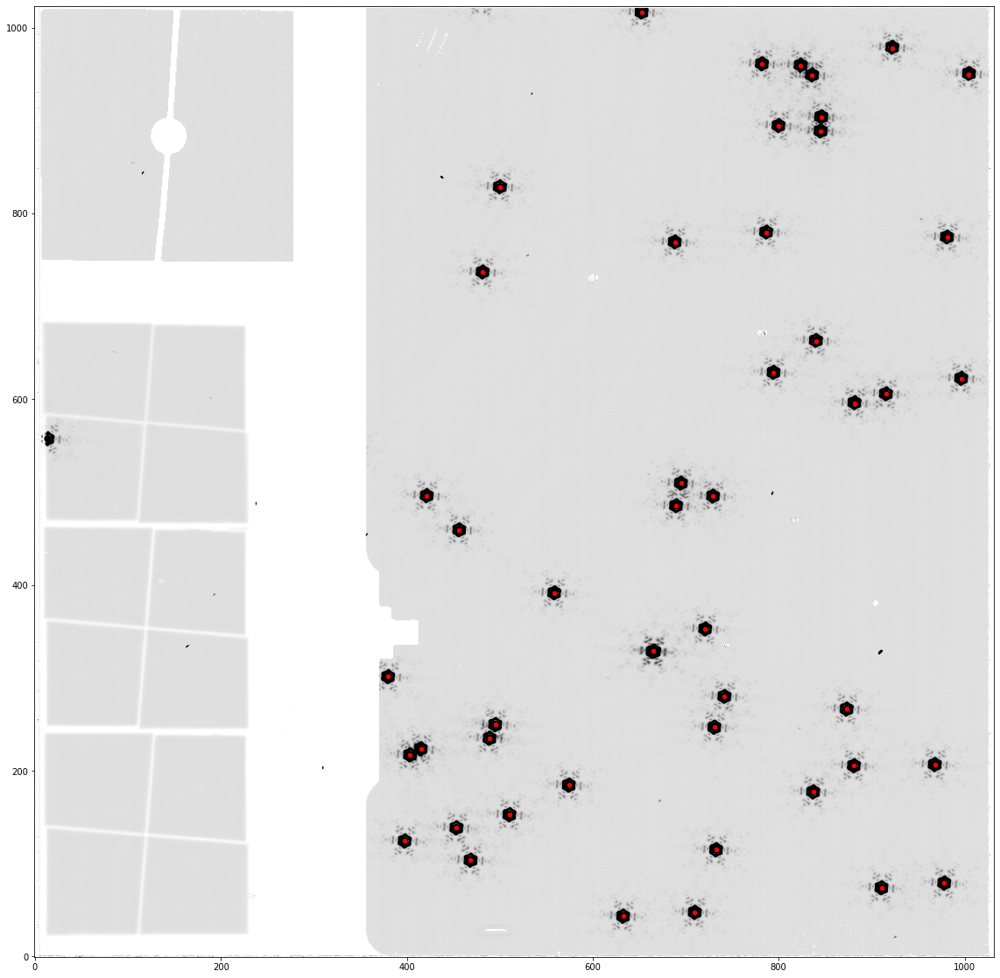


starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal.fits
starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal_cat.ecsv
42 sources found


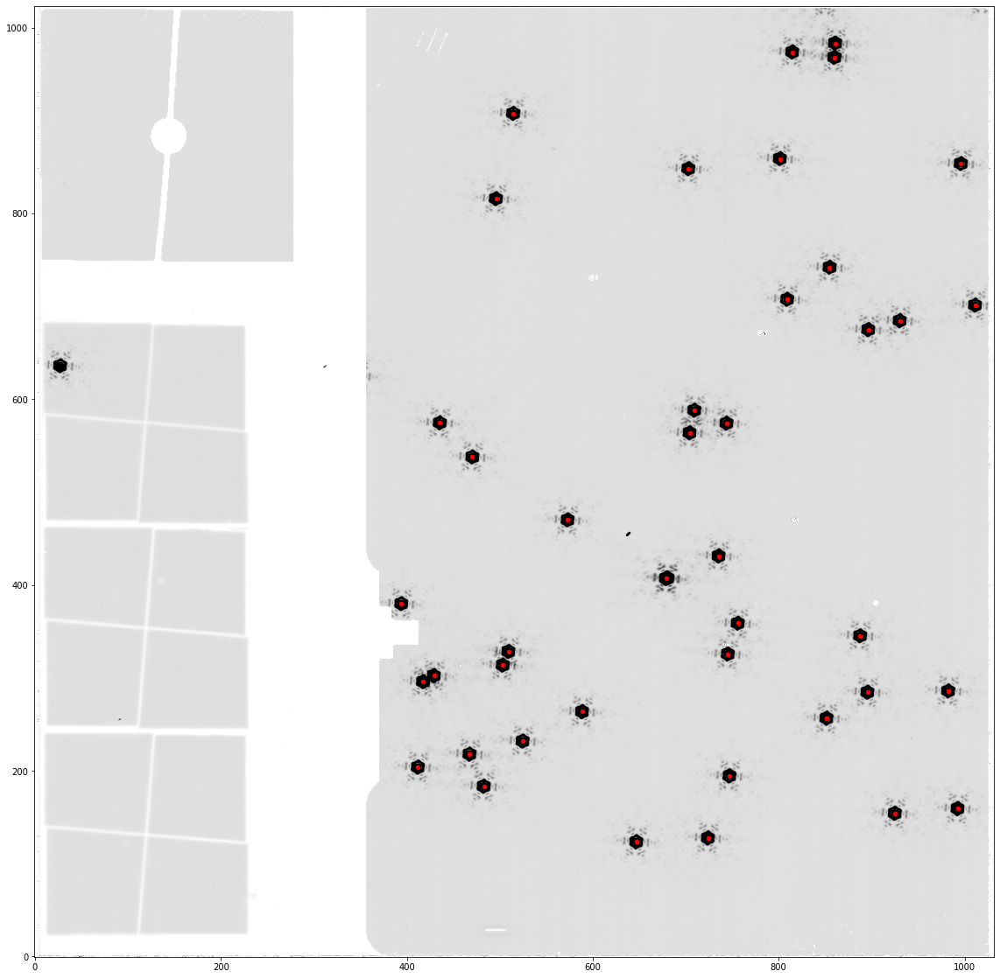


starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal.fits
starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal_cat.ecsv
42 sources found


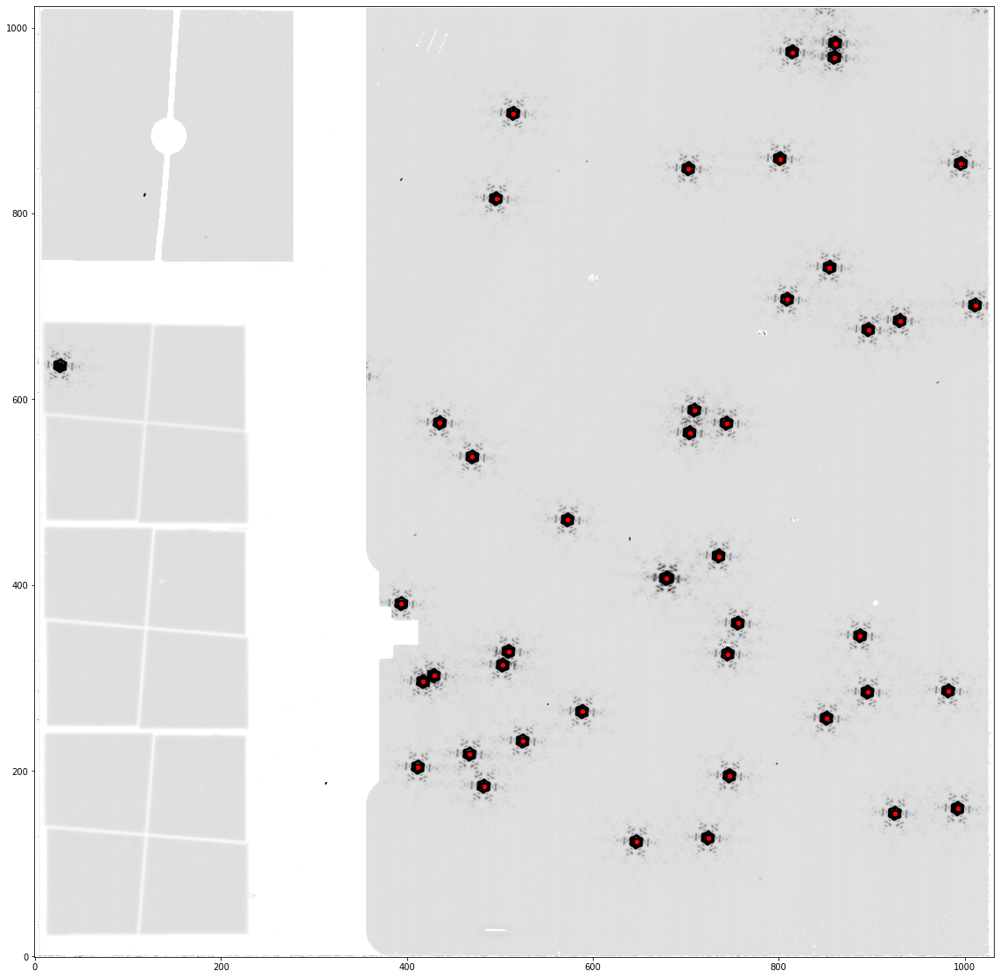


starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal.fits
starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal_cat.ecsv
43 sources found


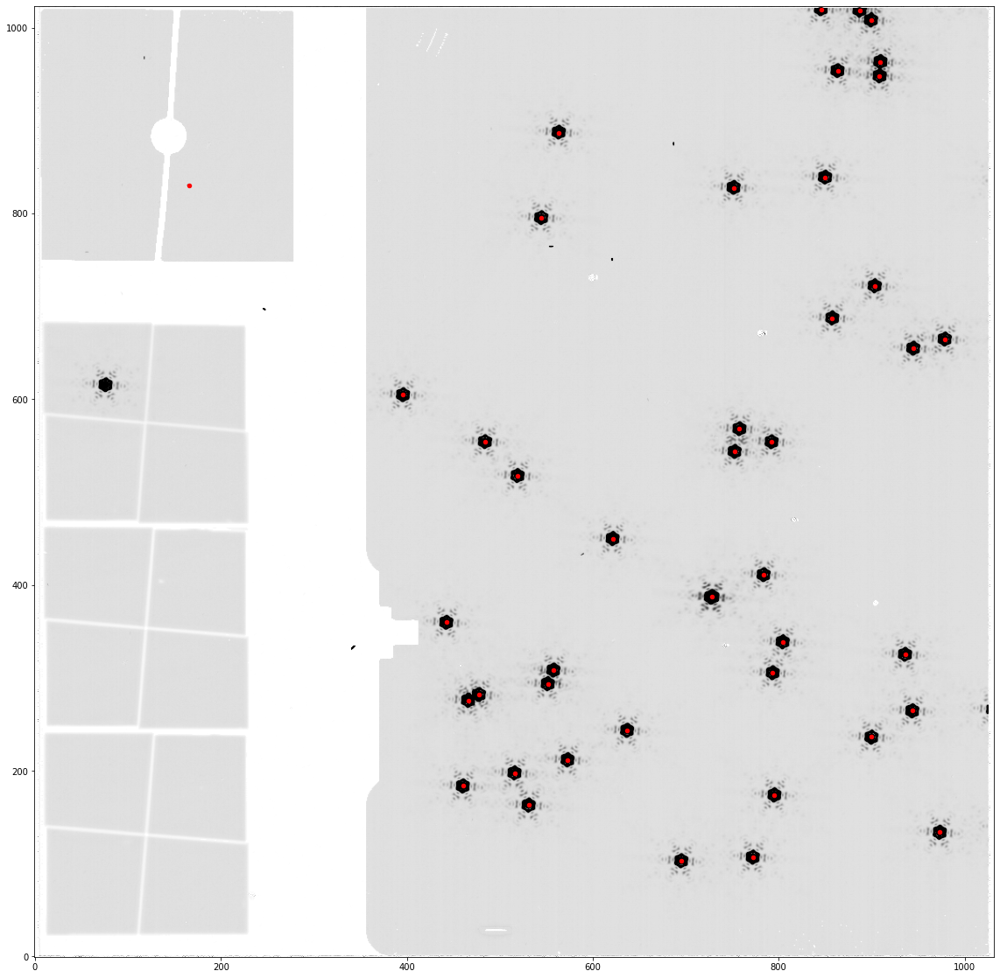


starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal.fits
starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal_cat.ecsv
42 sources found


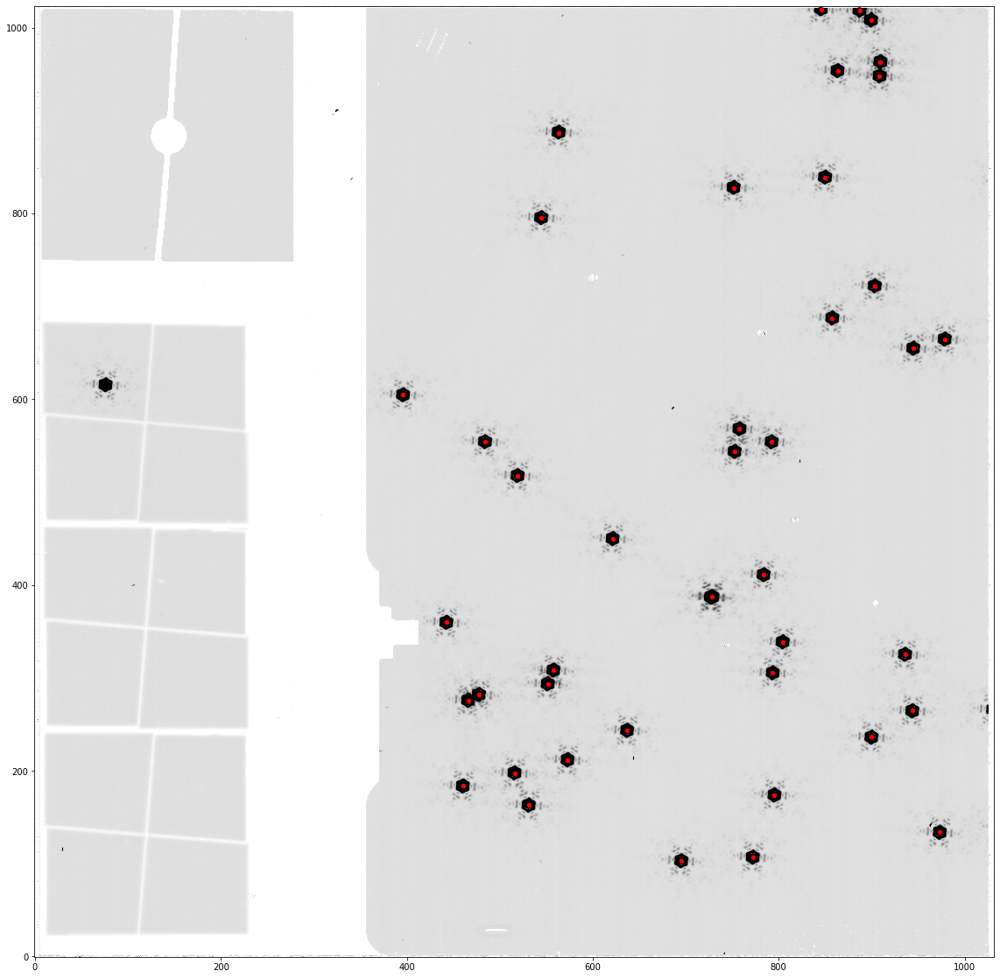

In [15]:
# Loop through each image and overplot the sources found in the individual catalogs

index=0
for cal_image in imagelist:
    indimage = ImageModel(cal_image)
    ind_data = indimage.data
    
    indcat = cataloglist[index]
    catdata = table.Table.read(indcat, format='ascii', comment='#')
    print(cal_image)
    print(indcat)
    print(len(catdata['xcentroid']), 'sources found')
    
    # mark sources on image frame to see if the correct sources were found
    norm = ImageNormalize(stretch=SqrtStretch())
    # keep image stretch in mind for plotting. sky subtracted range ~ (-15, 10), single sample ~ (0, 20)
    plt.figure(figsize=(20,20))
    plt.imshow(ind_data, cmap='Greys', origin='lower', vmin=0,vmax=50)#, norm=norm)
    plt.scatter(catdata['xcentroid'], catdata['ycentroid'],lw=1, s=20,color='red')
    plt.show()
    index = index+1
    print()

### Get position differences as found earlier for the individual i2d files

['starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_i2d.fits', 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_i2d.fits', 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_i2d.fits', 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_i2d.fits', 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_i2d.fits', 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_i2d.fits', 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_i2d.fits', 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_i2d.fits']

starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_i2d.fits
Image mean, median and std 10.02644 10.793919 50.358776
    xcentroid          ycentroid                RA                     Dec          
------------------ ------------------ ---------------------- -----------------------
 608.4171595332177  3.716633578310318  0.0008807940950981058   -0.014608973449832483
 685.5361272711033  6.676640351753473        359.99852368791   -0.014310647118461398
 886.3825749125941 31.883659717761674 

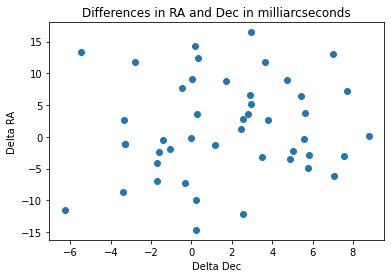

starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_i2d.fits
Image mean, median and std 10.026232 10.794579 50.35233
    xcentroid          ycentroid                RA                    Dec          
------------------ ------------------ ---------------------- ----------------------
 608.4217743899426 3.7168035171784375  0.0008806530247472626  -0.014608955818276448
 685.5330346399653  6.676769811417238      359.9985237831027  -0.014310651471371037
 886.3812659336174 31.878285004130735     359.99243202565873  -0.012997234976352953
 953.8848824256042  36.42439047022927     359.99037407030136  -0.012676144038266371
 444.5429955030846  63.26053560781197   0.006066711030794951  -0.013223922905926165
 708.6665132281873  72.58146280793976     359.99799169764816  -0.012227237949203608
 373.8569607796454   84.2814010265435   0.008291072459253023   -0.01276949470549662
429.38032016588716  97.69024389124867   0.006624377810676887  -0.012208845161481111
 486.5254564267202 111.50351093191216   0.00

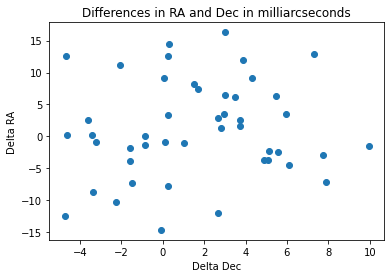

starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_i2d.fits
Image mean, median and std 10.049191 10.796259 50.623425
    xcentroid          ycentroid                RA                     Dec          
------------------ ------------------ ---------------------- -----------------------
 632.8233935642098  44.06086119823765  0.0008800340619298028   -0.014627811614874833
 709.9169975346623  47.64999066773835     359.99852539886984   -0.014310259699632618
 910.7899542358584  72.84607194197352      359.9924328685195   -0.012996943279397016
 978.3389290949946  77.39928083241529     359.99037354123783   -0.012675512414446295
468.95656607733815 104.18453484206745    0.00606728636165211   -0.013224960980699519
 733.1052006228166 113.54443086625955     359.99799160754395   -0.012227013307714954
398.29011251642737 125.19101426263659   0.008291008574920999   -0.012770921269802298
453.79141318518134  138.8639700301856   0.006625701212399733   -0.012202231309132982
 510.9998820290149 152.4020710557

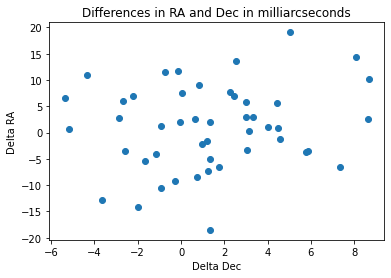

starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_i2d.fits
Image mean, median and std 10.050589 10.797003 50.61101
    xcentroid          ycentroid                RA                     Dec          
------------------ ------------------ ---------------------- -----------------------
 632.8208535562436  44.06661298416791   0.000880127438197349   -0.014627642055924117
 709.9164865144267  47.65030581209815     359.99852541538985   -0.014310251410126587
 910.7918430183055  72.84180030755901      359.9924327990984   -0.012997069197936644
  978.335357305015   77.5497093396856      359.9903740556232   -0.012670908709630084
 468.9478851732465  104.1929445114733  0.0060675752190952675   -0.013224726437080246
 733.1105124238405 113.54050890639823     359.99799143408734   -0.012227119290189927
398.28962699638663  125.1911537846086   0.008291023840269633   -0.012770918297648384
 453.7904577905888 138.86252596936555   0.006625726625909363   -0.012202278166600317
511.00033899269226 152.40231005644

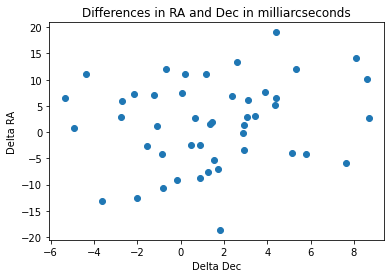

starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_i2d.fits
Image mean, median and std 9.754711 10.78795 47.292503
    xcentroid          ycentroid                RA                     Dec          
------------------ ------------------ ---------------------- -----------------------
 647.2789161605924 122.80321355691154  0.0008797775183292475   -0.014624823462449654
 724.3614374123302  126.2418480774671      359.9985250771654   -0.014311916721041814
 925.2829331844007  151.5145563525393     359.99243126441695   -0.012996119655296002
 992.7487736915098 156.01857184487108      359.9903743542836    -0.01267642117741895
 483.4108876491559 182.81936408337538   0.006066777323068356   -0.013225273542513292
 747.4900629430496 192.29100875074428     359.99799352935986   -0.012224085691362683
412.67624918559994 203.82526964340732   0.008292589094440828      -0.012771434930238
468.22622322261236  217.4335124430099    0.00662561484915368   -0.012204598572113935
 525.4793412791782  231.03638376896

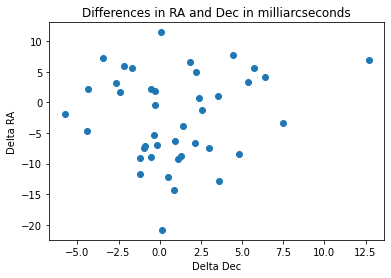

starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_i2d.fits
Image mean, median and std 9.754807 10.787943 47.304714
    xcentroid          ycentroid                RA                    Dec          
------------------ ------------------ ---------------------- ----------------------
 647.2790687385187 122.80495889954449  0.0008797775363115812  -0.014624769525925826
 724.3704541549183 126.23059313821031     359.99852477035114  -0.014312237619081231
 925.2610325886693 151.52399227829787     359.99243196145574   -0.01299588921663906
 992.7460186280499 156.01775330910218      359.9903744365725  -0.012676453694798551
483.40766270574716 182.81635228445626  0.0060668681195144855  -0.013225374587148798
 747.4910350871386 192.29159650116355     359.99799350112806   -0.01222406505001428
 412.6680607696125 203.81917347786944   0.008292823808974977   -0.01277164392386538
468.22315775877274 217.43233581714384   0.006625705693681134  -0.012204642906720062
 525.4949872929363 231.01844098493436   0.00

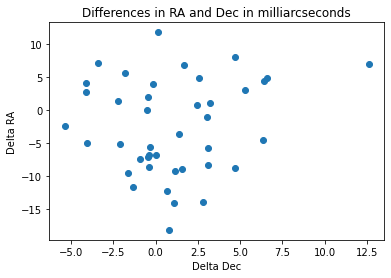

starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_i2d.fits
Image mean, median and std 9.740273 10.788436 47.192795
    xcentroid          ycentroid                RA                     Dec          
------------------ ------------------ ---------------------- -----------------------
 695.5006034054337  102.3933057031372   0.000881875383722068   -0.014622124736287807
 772.6324036323349 105.70259857314427     359.99852531567484   -0.014313051986448201
 973.4763142518625 130.96661093289694      359.9924338589653    -0.01299773038193665
  531.627529372202 162.48279595617868  0.0060692272792496295   -0.013220339264587256
 795.8027898172277 171.79252025563895      359.9979925968647   -0.012223858526128168
460.99927575034184 183.24074380981432   0.008291109129948258   -0.012773818682882378
 516.4753899126669 196.90113053736118   0.006626540343964035   -0.012205581952809972
 573.6395028777987  210.4815046615099   0.004909988940216402   -0.011635256135337755
 900.4056260554462  232.8557447454

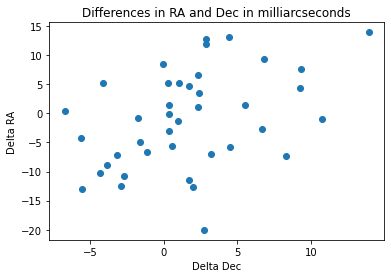

starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_i2d.fits
Image mean, median and std 9.73896 10.788699 47.16118
    xcentroid          ycentroid                RA                     Dec          
------------------ ------------------ ---------------------- -----------------------
 695.5000595981281  102.3955168227148  0.0008818980118768585   -0.014622058389564409
 772.6300829574792 105.70143936470159     359.99852538372517   -0.014313093782482394
 973.4757507928692 130.96871079850118      359.9924338818967   -0.012997667500016314
  531.624385675305  162.4714207126525   0.006069293075609228   -0.013220696579359082
 795.8040154519499 171.79681074372252     359.99799257082407   -0.012223723647572888
460.99912170739447 183.24334537989796    0.00829112085568476   -0.012773739312911188
 516.4762334783253 196.90075184259487   0.006626513454448065   -0.012205591296281152
 573.6407434150301  210.4811316708813   0.004909949891787606   -0.011635264235520873
 900.4052144008393 232.8293688456387

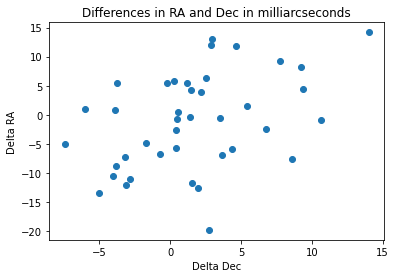

RA difference mean, median and std (units in mas) 1.436019300064677 1.190991620497392 3.8372740253085325
Dec difference mean, median and std (units in mas) -0.09997223853214 0.1772512706485485 7.883142220258062


In [16]:
# find stars and get RA, Dec from *_i2d.fits files

#datadir = '/ifs/jwst/wit/miri/pipelinetests/cracraft/build7_8/'
#filelist = 'starfield_50star4ptdither_i2dfiles.txt'
filelist = glob.glob('*exp*i2d.fits')
print(filelist)
print()

# Run DAOStarFinder to find sources in image
allRAdiff_i2d = []
allDecdiff_i2d = []

for i2dimage in filelist:
    image = ImageModel(i2dimage)
    
    # pull out data portion of input file
    data = image.data
    
    # print stats on input image
    print(i2dimage)
    mean, median, std = sigma_clipped_stats(data, sigma=200.0, maxiters=5)  # default sigma=3
    print('Image mean, median and std',mean, median, std)

    ap_radius = 5.  # radius for aperture for centroiding and photometry

    daofind = DAOStarFinder(fwhm=3.0, threshold=10.*std)    # default threshold=5*std, fwhm=3
    sources = daofind(data)    

    #sources.pprint_all()
    #print(sources['xcentroid','ycentroid','peak'])   

    # Create apertures for x,y positions
    positions = tuple(zip(sources['xcentroid'], sources['ycentroid']))
    #print(positions)

    #positions = (sources['xcentroid'], sources['ycentroid'])
    apertures = CircularAperture(positions, r=ap_radius)
    
    # using wcs info from images, put coordinates into RA, Dec
    ra, dec = image.meta.wcs(sources['xcentroid'], sources['ycentroid'])

    # add RA, Dec to sources table

    ra_col = Column(name='RA', data=ra)
    dec_col = Column(name='Dec', data=dec)
    sources.add_column(ra_col)
    sources.add_column(dec_col)

    # print RA, Dec for each x, y position found
    #print(sources['xcentroid', 'ycentroid', 'RA', 'Dec'])  

    sources_sub = sources['xcentroid', 'ycentroid', 'RA', 'Dec']
    sources_sub.pprint_all()
    print()
    
    # read in text file with RA and Dec input coordinates
    RA_in, Dec_in = np.loadtxt( coords, dtype=str, unpack=True)

    # put RA and Dec into floats
    RA_sim = RA_in.astype(float)
    Dec_sim = Dec_in.astype(float)
    
    # Put ra, dec coords into a table
    cat1_sim = Table([RA_sim, Dec_sim], names=('ra', 'dec'))
    cat2_calc = Table([ra, dec], names=('ra', 'dec'))
    
    # Get coordinates with SkyCoord for each catalog
    
    coord_cat1_sim = SkyCoord(ra=cat1_sim['ra'], dec=cat1_sim['dec'], unit="deg")
    coord_cat2_calc = SkyCoord(ra=cat2_calc['ra'], dec=cat2_calc['dec'], unit="deg")
    ind_cat2_cat1, dist_2d, _ = match_coordinates_sky(coord_cat1_sim, coord_cat2_calc)
    
    # Find where the catalogs match
    
    cat1_matched = cat1_sim[dist_2d.arcsec<0.05]
    cat2_matched = cat2_calc[ind_cat2_cat1[dist_2d.arcsec<0.05]]
    
    #print(cat1_matched)
    
    # Get differences in RA, Dec
    ra_diff = cat2_matched['ra'] - cat1_matched['ra']
    dec_diff = cat2_matched['dec'] - cat1_matched['dec'] 
    
    #print(ra_diff)
    
    # put differences in milliarcseconds
    ra_diff = ra_diff * 3600000
    dec_diff = dec_diff * 3600000
    
    
    # Compare input RA, Dec to found RA, Dec
    print('RA_Diff (mas)  Dec_diff (mas) pass/fail')
    # Find if the differences are within the allowed 30 mas range
    for i in np.arange(0,len(ra_diff)):
        #if ra_diff[i] < 30 and dec_diff[i] < 30:
        allRAdiff_i2d.append(ra_diff[i])
        allDecdiff_i2d.append(dec_diff[i])
        if abs(ra_diff[i]) < 30 and abs(dec_diff[i]) < 30: 
            test = 'pass' 
        else: 
            test = 'fail'
        print('{:15.6f} {:15.6f} {}'.format(ra_diff[i], dec_diff[i], test))
 
    
    # Plot ra and dec differences
    plt.title ('Differences in RA and Dec in milliarcseconds')
    plt.ylabel('Delta RA')
    plt.xlabel('Delta Dec')
    plt.scatter(ra_diff,dec_diff)
    plt.show()

    # Plot should show no differences greater than 30 milliarcseconds  

    
meanRAdiff_i2d, medianRAdiff_i2d, stdRAdiff_i2d = sigma_clipped_stats(allRAdiff_i2d, sigma=5.0, maxiters=5)  # default sigma=3
meanDecdiff_i2d, medianDecdiff_i2d, stdDecdiff_i2d = sigma_clipped_stats(allDecdiff_i2d, sigma=5.0, maxiters=5)  # default sigma=3

print('RA difference mean, median and std (units in mas)',meanRAdiff_i2d, medianRAdiff_i2d, stdRAdiff_i2d) 
print('Dec difference mean, median and std (units in mas)',meanDecdiff_i2d, medianDecdiff_i2d, stdDecdiff_i2d)

### Look at positions of RA, Dec and get stats on differences for the combined image run with tweakreg on

In [17]:
im = ImageModel('starfield_50star4ptdither_combined_i2d.fits')
pixarea = im.meta.photometry.pixelarea_steradians
print('Pixel area in steradians', pixarea)

# pull out data portion of input file
data = im.data

# print stats on input image
mean, median, std = sigma_clipped_stats(data, sigma=200.0, maxiters=5)  # default sigma=3
print('Image mean, median and std',mean, median, std)

Pixel area in steradians 2.84403609523084e-13
Image mean, median and std 10.235801 10.815084 46.58098


    xcentroid          ycentroid                RA                     Dec          
------------------ ------------------ ---------------------- -----------------------
 695.5013549809806  122.7766822025338  0.0008813127670242714   -0.014625592281021131
  772.622356013871 126.26211163727903     359.99852555828016    -0.01431114688172253
 973.4755225481315 151.46687258877478      359.9924336582239   -0.012997617518265737
1041.0315300819998 156.07277971926715     359.99037425709884   -0.012674551580170952
 531.6380615452591 182.87454083332935    0.00606838721592468    -0.01322352383349858
 795.8149629449284 192.30948790749403     359.99799204349625   -0.012223198411829454
 460.9912107378149 203.83898378611806   0.008291395127706937   -0.012770720536852177
 516.4547468081652 217.46520508035724   0.006627120144335814   -0.012203565451173319
 573.6924942105585 231.02101005657985   0.004908244414513841   -0.011633794957402266
 900.3787936543063 253.34340105424758     359.99494955615097   -0

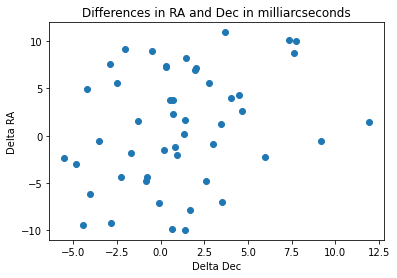

RA difference mean, median and std (units in mas) 1.1220578902474647 0.7866569553698077 3.7478316539340475
Dec difference mean, median and std (units in mas) 0.9367027401338995 1.3584640321296497 5.969149439746364


In [18]:
# Run DAOStarFinder to find sources in image

ap_radius = 5.  # radius for aperture for centroiding and photometry

daofind = DAOStarFinder(fwhm=3.0, threshold=10.*std)    # default threshold=5*std, fwhm=3
sources = daofind(data)    

# Create apertures for x,y positions
positions = tuple(zip(sources['xcentroid'], sources['ycentroid']))
#print(positions)

#positions = (sources['xcentroid'], sources['ycentroid'])
apertures = CircularAperture(positions, r=ap_radius)

# using wcs info from images, put coordinates into RA, Dec
ra, dec = im.meta.wcs(sources['xcentroid'], sources['ycentroid'])

# add RA, Dec to sources table

ra_col = Column(name='RA', data=ra)
dec_col = Column(name='Dec', data=dec)
sources.add_column(ra_col)
sources.add_column(dec_col)

# print RA, Dec for each x, y position found
#print(sources['xcentroid', 'ycentroid', 'RA', 'Dec'])  

sources_sub = sources['xcentroid', 'ycentroid', 'RA', 'Dec']
sources_sub.pprint_all()
print()

# Compare input RA, Dec to found RA, Dec
#print('       RA found       Dec found    RA_Diff (mas)  Dec_diff (mas) pass/fail')

deltara_twon = []
deltadec_twon = []

# Put ra, dec coords into a table
cat1_sim = Table([RA_sim, Dec_sim], names=('ra', 'dec'))
cat2_calc = Table([ra, dec], names=('ra', 'dec'))
    
# Get coordinates with SkyCoord for each catalog
    
coord_cat1_sim = SkyCoord(ra=cat1_sim['ra'], dec=cat1_sim['dec'], unit="deg")
coord_cat2_calc = SkyCoord(ra=cat2_calc['ra'], dec=cat2_calc['dec'], unit="deg")    
ind_cat2_cat1, dist_2d, _ = match_coordinates_sky(coord_cat1_sim, coord_cat2_calc)
    
# Find where the catalogs match
    
cat1_matched = cat1_sim[dist_2d.arcsec<0.05]
cat2_matched = cat2_calc[ind_cat2_cat1[dist_2d.arcsec<0.05]]
    
#print(cat1_matched)
    
# Get differences in RA, Dec
ra_diff = cat2_matched['ra'] - cat1_matched['ra']
dec_diff = cat2_matched['dec'] - cat1_matched['dec'] 
    
#print(ra_diff)
    
# put differences in milliarcseconds
ra_diff = ra_diff * 3600000
dec_diff = dec_diff * 3600000
    
    
# Compare input RA, Dec to found RA, Dec
print('RA_Diff (mas)  Dec_diff (mas) pass/fail')
# Find if the differences are within the allowed 30 mas range
for i in np.arange(0,len(ra_diff)):
    #if ra_diff[i] < 30 and dec_diff[i] < 30:
    deltara_twon.append(ra_diff[i])
    deltadec_twon.append(dec_diff[i])
    if abs(ra_diff[i]) < 30 and abs(dec_diff[i]) < 30: 
        test = 'pass' 
    else: 
        test = 'fail'
    print('{:15.6f} {:15.6f} {}'.format(ra_diff[i], dec_diff[i], test))
 
    
# Plot ra and dec differences
plt.title ('Differences in RA and Dec in milliarcseconds')
plt.ylabel('Delta RA')
plt.xlabel('Delta Dec')
plt.scatter(deltara_twon,deltadec_twon)
plt.show()

# Plot should show no differences greater than 30 milliarcseconds  
     
meanRAdiff_twon, medianRAdiff_twon, stdRAdiff_twon = sigma_clipped_stats(deltara_twon, sigma=5.0, maxiters=5)  # default sigma=3
meanDecdiff_twon, medianDecdiff_twon, stdDecdiff_twon = sigma_clipped_stats(deltadec_twon, sigma=5.0, maxiters=5)  # default sigma=3

print('RA difference mean, median and std (units in mas)',meanRAdiff_twon, medianRAdiff_twon, stdRAdiff_twon) 
print('Dec difference mean, median and std (units in mas)',meanDecdiff_twon, medianDecdiff_twon, stdDecdiff_twon)

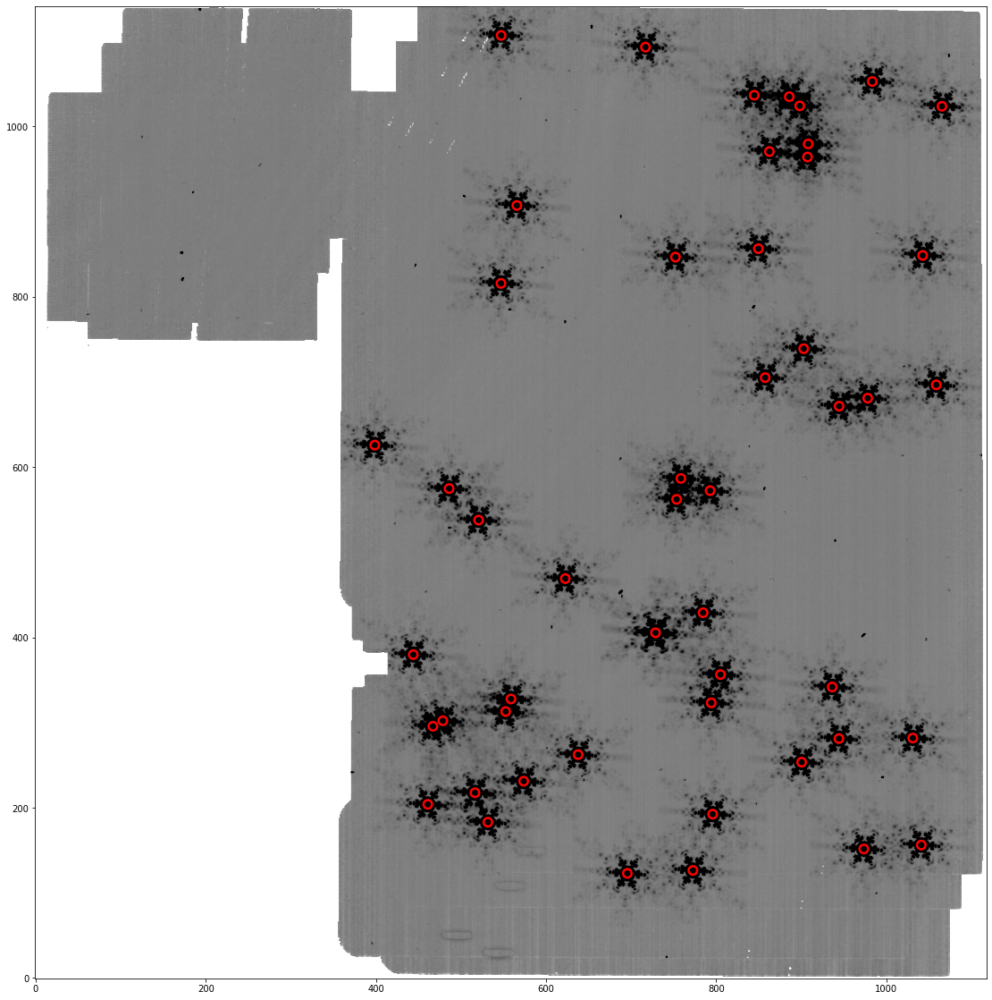

In [19]:
# mark sources on image frame to see if the correct sources were found
norm = ImageNormalize(stretch=SqrtStretch())
# keep image stretch in mind for plotting. sky subtracted range ~ (-15, 10), single sample ~ (0, 20)
plt.figure(figsize=(20,20))
plt.imshow(data, cmap='Greys', origin='lower', vmin=5,vmax=15)#, norm=norm)
apertures.plot(color='red', lw=2.5) #, alpha=0.5)
plt.show()

### Run calwebb_image3 with tweakreg turned off

Re-run the pipeline with tweakreg turned off to see if the differences found in the previous step are due to tweakreg alone, or differences in the distortion model that would show up in any run of the calwebb_image3 pipeline.

In [20]:
# Run Calwebb_image3 on the association table with tweakreg off
    
# set any specific parameters
# tweakreg parameters to allow data to run
fwhm = 3.318 #3.27  # Gaussian kernel FWHM of objects expected, default=2.5
minobj = 5  # minimum number of objects needed to match positions for a good fit, default=15
snr = 10 # signal to noise threshold, default=5
sigma = 3 # clipping limit, in sigma units, used when performing fit, default=3
fit_geom ='rshift' # ftype of affine transformation to be considered when fitting catalogs, default='general'
use2dhist = False  # boolean indicating whether to use 2D histogram to find initial offset, default=True
   
pipe3=Image3Pipeline()    
#pipe3.tweakreg.kernel_fwhm = fwhm
#pipe3.tweakreg.snr_threshold = snr
#pipe3.tweakreg.minobj = minobj
#pipe3.tweakreg.sigma = sigma
#pipe3.tweakreg.fitgeometry = fit_geom
#pipe3.tweakreg.use2dhist = use2dhist
pipe3.tweakreg.skip = True        # test to see if this affects the final output
pipe3.outlier_detection.skip = True # this is set in later step so mis-alignments aren't 'hidden'
pipe3.source_catalog.save_results = True
pipe3.save_results = True
#pipe3.output_dir = datadir

# run Image3

#im = pipe3.run(rtdata.input)
image = pipe3.run('starfield_50star4ptdither_asnfile.json')
print('Image 3 pipeline finished.')

2022-06-20 22:03:00,135 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2022-06-20 22:03:00,138 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2022-06-20 22:03:00,140 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2022-06-20 22:03:00,142 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2022-06-20 22:03:00,144 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2022-06-20 22:03:00,145 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2022-06-20 22:03:00,147 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2022-06-20 22:03:00,310 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('starfield_50star4ptdither_asnfile.json',).


2022-06-20 22:03:00,317 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'steps': {'assign_mtwcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': True, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'assign_mtwcs', 'search_output_file': True, 'input_dir': ''}, 'tweakreg': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': True, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_catalogs': False, 'catalog_format': 'ecsv', 'kernel_fwhm': 2.5, 'snr_threshold': 10.0, 'brightest': 

2022-06-20 22:03:00,457 - stpipe.Image3Pipeline - INFO - Prefetching reference files for dataset: 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal.fits' reftypes = ['abvegaoffset', 'apcorr', 'drizpars']


2022-06-20 22:03:00,464 - stpipe.Image3Pipeline - INFO - Prefetch for ABVEGAOFFSET reference file is '/grp/crds/cache/references/jwst/jwst_miri_abvegaoffset_0001.asdf'.


2022-06-20 22:03:00,465 - stpipe.Image3Pipeline - INFO - Prefetch for APCORR reference file is '/grp/crds/cache/references/jwst/jwst_miri_apcorr_0005.fits'.


2022-06-20 22:03:00,466 - stpipe.Image3Pipeline - INFO - Prefetch for DRIZPARS reference file is '/grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits'.


2022-06-20 22:03:00,469 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2022-06-20 22:03:01,707 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<ModelContainer>,).


2022-06-20 22:03:01,710 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': True, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_catalogs': False, 'catalog_format': 'ecsv', 'kernel_fwhm': 2.5, 'snr_threshold': 10.0, 'brightest': 200, 'peakmax': None, 'enforce_user_order': False, 'expand_refcat': False, 'minobj': 15, 'searchrad': 2.0, 'use2dhist': True, 'separation': 1.0, 'tolerance': 0.7, 'xoffset': 0.0, 'yoffset': 0.0, 'fitgeometry': 'rshift', 'nclip': 3, 'sigma': 3.0, 'align_to_gaia': False, 'gaia_catalog': 'GAIADR2', 'min_gaia': 5, 'save_gaia_catalog': False}


2022-06-20 22:03:01,711 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2022-06-20 22:03:01,722 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg done


2022-06-20 22:03:01,890 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<ModelContainer>,).


2022-06-20 22:03:01,892 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'skymethod': 'match', 'match_down': True, 'subtract': False, 'stepsize': None, 'skystat': 'mode', 'dqbits': '~DO_NOT_USE+NON_SCIENCE', 'lower': None, 'upper': None, 'nclip': 5, 'lsigma': 4.0, 'usigma': 4.0, 'binwidth': 0.1}


2022-06-20 22:03:02,120 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:03:02,122 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() started on 2022-06-20 22:03:02.120920


2022-06-20 22:03:02,122 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:03:02,123 - stpipe.Image3Pipeline.skymatch - INFO - Sky computation method: 'match'


2022-06-20 22:03:02,124 - stpipe.Image3Pipeline.skymatch - INFO - Sky matching direction: DOWN


2022-06-20 22:03:02,124 - stpipe.Image3Pipeline.skymatch - INFO - Sky subtraction from image data: OFF


2022-06-20 22:03:02,125 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:03:02,126 - stpipe.Image3Pipeline.skymatch - INFO - ----  Computing differences in sky values in overlapping regions.


2022-06-20 22:03:15,203 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal.fits. Sky background: 0.00238358


2022-06-20 22:03:15,207 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal.fits. Sky background: 0.0124171


2022-06-20 22:03:15,208 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal.fits. Sky background: 0.00851901


2022-06-20 22:03:15,208 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal.fits. Sky background: 0.00484789


2022-06-20 22:03:15,209 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal.fits. Sky background: 0


2022-06-20 22:03:15,210 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal.fits. Sky background: 0.00727946


2022-06-20 22:03:15,210 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal.fits. Sky background: 0.00377957


2022-06-20 22:03:15,211 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal.fits. Sky background: 0.0117165


2022-06-20 22:03:15,212 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:03:15,212 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() ended on 2022-06-20 22:03:15.212152


2022-06-20 22:03:15,213 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() TOTAL RUN TIME: 0:00:13.091232


2022-06-20 22:03:15,213 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:03:15,255 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch done


2022-06-20 22:03:15,486 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<ModelContainer>,).


2022-06-20 22:03:15,488 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': True, 'suffix': 'crf', 'search_output_file': False, 'input_dir': '', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None}


2022-06-20 22:03:15,489 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2022-06-20 22:03:15,501 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection done


2022-06-20 22:03:15,684 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<ModelContainer>,).


2022-06-20 22:03:15,686 - stpipe.Image3Pipeline.resample - INFO - Step resample parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'i2d', 'search_output_file': True, 'input_dir': '', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'weight_type': 'ivm', 'output_shape': None, 'crpix': None, 'crval': None, 'rotation': None, 'pixel_scale_ratio': 1.0, 'pixel_scale': None, 'single': False, 'blendheaders': True, 'allowed_memory': None}


2022-06-20 22:03:15,705 - stpipe.Image3Pipeline.resample - INFO - Drizpars reference file: /grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits


2022-06-20 22:03:15,885 - stpipe.Image3Pipeline.resample - INFO - Blending metadata for starfield_50star4ptdither_combined.fits


2022-06-20 22:03:16,597 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2022-06-20 22:03:17,221 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:18,157 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:19,353 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:20,607 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:21,689 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:22,787 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:23,977 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:25,305 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:25,661 - stpipe.Image3Pipeline.resample - INFO - Resampling var_rnoise


2022-06-20 22:03:26,411 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:27,684 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:28,764 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:29,862 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:30,799 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:31,783 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:32,772 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:34,207 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:34,646 - stpipe.Image3Pipeline.resample - INFO - Resampling var_poisson


2022-06-20 22:03:35,468 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:36,635 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:37,755 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:38,682 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:39,614 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:40,551 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:41,471 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:42,397 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:42,751 - stpipe.Image3Pipeline.resample - INFO - Resampling var_flat


2022-06-20 22:03:43,341 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:44,264 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:45,221 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:46,169 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:47,110 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:48,038 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:48,966 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:49,891 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:03:50,277 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  0.021880629 -0.020262886 0.024954079 0.014759789 359.990667431 0.017768647 359.987593981 -0.017254027


2022-06-20 22:03:50,720 - stpipe.Image3Pipeline.resample - INFO - Saved model in starfield_50star4ptdither_combined_i2d.fits


2022-06-20 22:03:50,721 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2022-06-20 22:03:50,948 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1142, 1118) from starfield_50star4ptdither_combined_i2d.fits>,).


2022-06-20 22:03:50,950 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'cat', 'search_output_file': True, 'input_dir': '', 'bkg_boxsize': 100, 'kernel_fwhm': 2.0, 'snr_threshold': 3.0, 'npixels': 5, 'deblend': False, 'aperture_ee1': 30, 'aperture_ee2': 50, 'aperture_ee3': 70, 'ci1_star_threshold': 2.0, 'ci2_star_threshold': 1.8}


2022-06-20 22:03:50,972 - stpipe.Image3Pipeline.source_catalog - INFO - Using APCORR reference file: /grp/crds/cache/references/jwst/jwst_miri_apcorr_0005.fits


2022-06-20 22:03:50,983 - stpipe.Image3Pipeline.source_catalog - INFO - Using ABVEGAOFFSET reference file: /grp/crds/cache/references/jwst/jwst_miri_abvegaoffset_0001.asdf


2022-06-20 22:03:50,984 - stpipe.Image3Pipeline.source_catalog - INFO - Instrument: MIRI


2022-06-20 22:03:50,985 - stpipe.Image3Pipeline.source_catalog - INFO - Detector: MIRIMAGE


2022-06-20 22:03:50,986 - stpipe.Image3Pipeline.source_catalog - INFO - Filter: F1130W


2022-06-20 22:03:50,986 - stpipe.Image3Pipeline.source_catalog - INFO - Subarray: FULL


2022-06-20 22:03:51,039 - stpipe.Image3Pipeline.source_catalog - INFO - AB to Vega magnitude offset 5.49349


2022-06-20 22:03:51,596 - stpipe.Image3Pipeline.source_catalog - INFO - Detected 642 sources


2022-06-20 22:03:52,335 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote source catalog: starfield_50star4ptdither_combined_cat.ecsv


2022-06-20 22:03:52,462 - stpipe.Image3Pipeline.source_catalog - INFO - Saved model in starfield_50star4ptdither_combined_segm.fits


2022-06-20 22:03:52,464 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote segmentation map: starfield_50star4ptdither_combined_segm.fits


2022-06-20 22:03:52,465 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog done


2022-06-20 22:03:52,466 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


Image 3 pipeline finished.


In [21]:
im = ImageModel('starfield_50star4ptdither_combined_i2d.fits')
pixarea = im.meta.photometry.pixelarea_steradians
print('Pixel area in steradians', pixarea)

# pull out data portion of input file
data = im.data

# print stats on input image
mean, median, std = sigma_clipped_stats(data, sigma=200.0, maxiters=5)  # default sigma=3
print('Image mean, median and std',mean, median, std)

Pixel area in steradians 2.84403609523084e-13


Image mean, median and std 10.2361145 10.815056 46.592316


    xcentroid          ycentroid                RA                     Dec          
------------------ ------------------ ---------------------- -----------------------
  695.509656871691  122.7731352114558  0.0008812659609691389   -0.014625883703879764
 772.6300595966864 126.25881302467741      359.9985255304914   -0.014311432297556579
 973.4845950402436 151.46570797371396      359.9924335941968   -0.012997833804871057
1041.0402466411213 156.08608009673736      359.9903742429169   -0.012674325214607936
 531.6452188195361 182.86753119415394   0.006068366193812612    -0.01322392452879569
 795.8214655360165 192.30749063274445      359.9979920560416   -0.012223447150665144
460.99769105256127 203.83678397784786   0.008291407811122661   -0.012770975546914774
 516.4628063689622  217.4606335961348   0.006627078012817703   -0.012203888945226294
 573.6994021947937  231.0193109064272   0.004908245329639044   -0.011634033462371511
 900.3859136776463 253.34330822322437      359.9949495548864    -

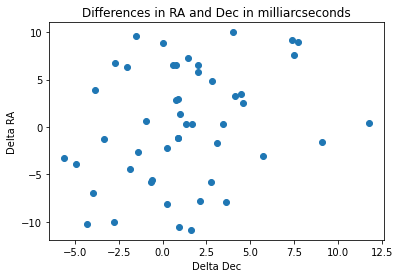

RA difference mean, median and std (units in mas) 1.2708751343637914 0.912537143449299 3.6629026624266148
Dec difference mean, median and std (units in mas) 0.23732602327684807 0.3018591787326205 5.992955377971589


In [22]:
# Run DAOStarFinder to find sources in image

ap_radius = 5.  # radius for aperture for centroiding and photometry

daofind = DAOStarFinder(fwhm=3.0, threshold=10.*std)    # default threshold=5*std, fwhm=3
sources = daofind(data)    

#sources.pprint_all()
#print(sources['xcentroid','ycentroid','peak'])   

# Create apertures for x,y positions
positions = tuple(zip(sources['xcentroid'], sources['ycentroid']))
#print(positions)

#positions = (sources['xcentroid'], sources['ycentroid'])
apertures = CircularAperture(positions, r=ap_radius)


# using wcs info from images, put coordinates into RA, Dec
ra, dec = im.meta.wcs(sources['xcentroid'], sources['ycentroid'])

# add RA, Dec to sources table

ra_col = Column(name='RA', data=ra)
dec_col = Column(name='Dec', data=dec)
sources.add_column(ra_col)
sources.add_column(dec_col)

# print RA, Dec for each x, y position found
#print(sources['xcentroid', 'ycentroid', 'RA', 'Dec'])  

sources_sub = sources['xcentroid', 'ycentroid', 'RA', 'Dec']
sources_sub.pprint_all()
print()

# Compare input RA, Dec to found RA, Dec
#print('       RA found       Dec found    RA_Diff (mas)  Dec_diff (mas) pass/fail')

deltara_twoff = []
deltadec_twoff = []

# Put ra, dec coords into a table
cat1_sim = Table([RA_sim, Dec_sim], names=('ra', 'dec'))
cat2_calc = Table([ra, dec], names=('ra', 'dec'))
    
# Get coordinates with SkyCoord for each catalog
    
coord_cat1_sim = SkyCoord(ra=cat1_sim['ra'], dec=cat1_sim['dec'], unit="deg")
coord_cat2_calc = SkyCoord(ra=cat2_calc['ra'], dec=cat2_calc['dec'], unit="deg")    
ind_cat2_cat1, dist_2d, _ = match_coordinates_sky(coord_cat1_sim, coord_cat2_calc)
    
# Find where the catalogs match
    
cat1_matched = cat1_sim[dist_2d.arcsec<0.05]
cat2_matched = cat2_calc[ind_cat2_cat1[dist_2d.arcsec<0.05]]
    
#print(cat1_matched)
    
# Get differences in RA, Dec
ra_diff = cat2_matched['ra'] - cat1_matched['ra']
dec_diff = cat2_matched['dec'] - cat1_matched['dec'] 
    
#print(ra_diff)
    
# put differences in milliarcseconds
ra_diff = ra_diff * 3600000
dec_diff = dec_diff * 3600000
    
    
# Compare input RA, Dec to found RA, Dec
print('RA_Diff (mas)  Dec_diff (mas) pass/fail')
# Find if the differences are within the allowed 30 mas range
for i in np.arange(0,len(ra_diff)):
    #if ra_diff[i] < 30 and dec_diff[i] < 30:
    deltara_twoff.append(ra_diff[i])
    deltadec_twoff.append(dec_diff[i])
    if abs(ra_diff[i]) < 30 and abs(dec_diff[i]) < 30: 
        test = 'pass' 
    else: 
        test = 'fail'
    print('{:15.6f} {:15.6f} {}'.format(ra_diff[i], dec_diff[i], test))
 
    
# Plot ra and dec differences
plt.title ('Differences in RA and Dec in milliarcseconds')
plt.ylabel('Delta RA')
plt.xlabel('Delta Dec')
plt.scatter(deltara_twoff,deltadec_twoff)
plt.show()

# Plot should show no differences greater than 30 milliarcseconds      
    
meanRAdiff_twoff, medianRAdiff_twoff, stdRAdiff_twoff = sigma_clipped_stats(deltara_twoff, sigma=5.0, maxiters=5)  # default sigma=3
meanDecdiff_twoff, medianDecdiff_twoff, stdDecdiff_twoff = sigma_clipped_stats(deltadec_twoff, sigma=5.0, maxiters=5)  # default sigma=3

print('RA difference mean, median and std (units in mas)',meanRAdiff_twoff, medianRAdiff_twoff, stdRAdiff_twoff) 
print('Dec difference mean, median and std (units in mas)',meanDecdiff_twoff, medianDecdiff_twoff, stdDecdiff_twoff)

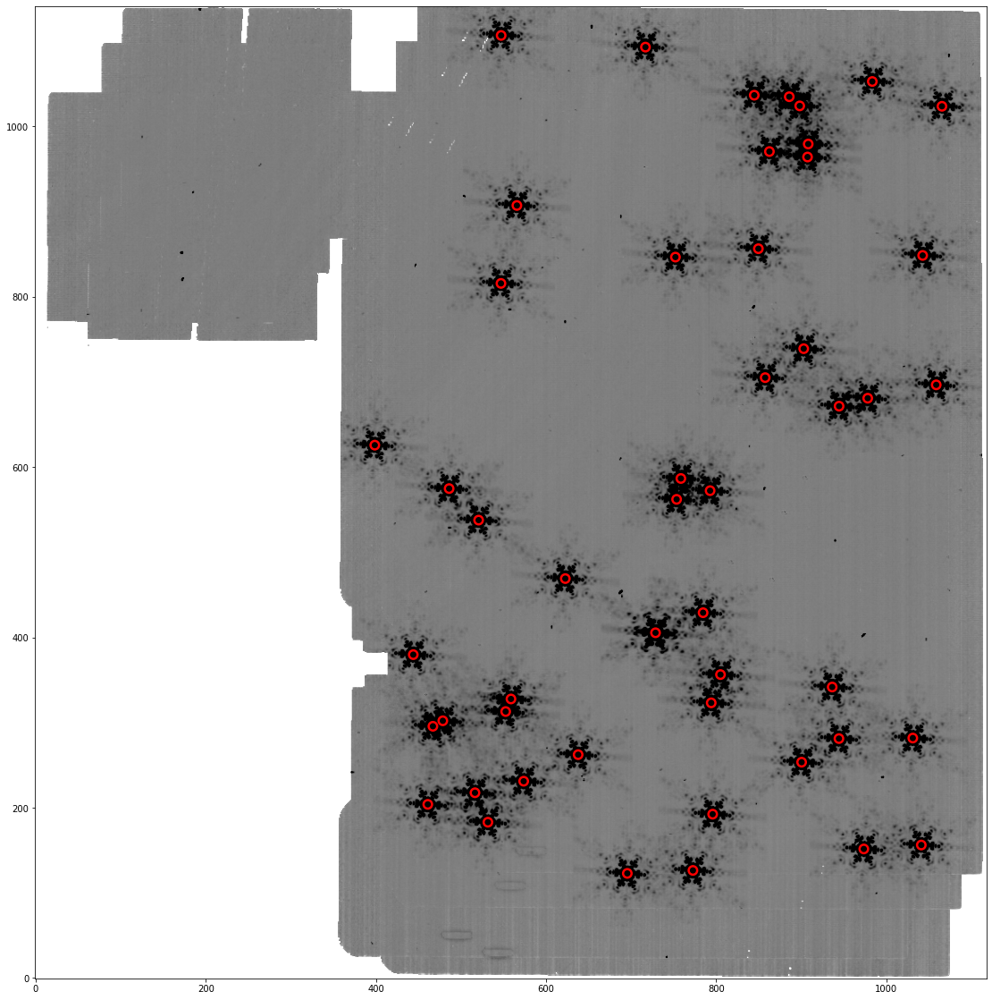

In [23]:
# mark sources on image frame to see if the correct sources were found
norm = ImageNormalize(stretch=SqrtStretch())
# keep image stretch in mind for plotting. sky subtracted range ~ (-15, 10), single sample ~ (0, 20)
plt.figure(figsize=(20,20))
plt.imshow(data, cmap='Greys', origin='lower', vmin=5,vmax=15)#, norm=norm)
apertures.plot(color='red', lw=2.5) #, alpha=0.5)
plt.show()

In [24]:
# Compare stats across tests:

print('All units are milliarcseconds for statistics')
print('Statistics on differences between RA and Dec in individual calibrated files')
print('RA difference mean, median and std',meanRAdiff_cal, medianRAdiff_cal, stdRAdiff_cal) 
print('Dec difference mean, median and std',meanDecdiff_cal, medianDecdiff_cal, stdDecdiff_cal)
print()
print('Statistics on differences between RA and Dec in individual i2d files when run with tweakreg on')
print('RA difference mean, median and std',meanRAdiff_i2d, medianRAdiff_i2d, stdRAdiff_i2d) 
print('Dec difference mean, median and std',meanDecdiff_i2d, medianDecdiff_i2d, stdDecdiff_i2d)
print()
print('Statistics on differences between RA and Dec in combined i2d file when run with tweakreg on')
print('RA difference mean, median and std',meanRAdiff_twon, medianRAdiff_twon, stdRAdiff_twon) 
print('Dec difference mean, median and std',meanDecdiff_twon, medianDecdiff_twon, stdDecdiff_twon)
print()
print('Statistics on differences between RA and Dec in combined i2d file when run with tweakreg off')
print('RA difference mean, median and std',meanRAdiff_twoff, medianRAdiff_twoff, stdRAdiff_twoff) 
print('Dec difference mean, median and std',meanDecdiff_twoff, medianDecdiff_twoff, stdDecdiff_twoff)

All units are milliarcseconds for statistics
Statistics on differences between RA and Dec in individual calibrated files
RA difference mean, median and std 1.1037660880047775 0.9281835036028911 3.549202125823858
Dec difference mean, median and std -0.06135758681286737 1.0161649008182116 5.550928948928192

Statistics on differences between RA and Dec in individual i2d files when run with tweakreg on
RA difference mean, median and std 1.436019300064677 1.190991620497392 3.8372740253085325
Dec difference mean, median and std -0.09997223853214 0.1772512706485485 7.883142220258062

Statistics on differences between RA and Dec in combined i2d file when run with tweakreg on
RA difference mean, median and std 1.1220578902474647 0.7866569553698077 3.7478316539340475
Dec difference mean, median and std 0.9367027401338995 1.3584640321296497 5.969149439746364

Statistics on differences between RA and Dec in combined i2d file when run with tweakreg off
RA difference mean, median and std 1.270875134

## Test # 2: See what happens with tweakreg when there are shifts between images not tracked in the wcs.

This test uses MIRISim data using only the simulated dithers, and one shifted image. Two exposures each of four different dithers. 

First look at the cal images out of calwebb_image2. 
* Apply specified shift (~0.5 arcseconds) to x and y positions of one image
* Use DAOStarFinder to get the x,y positions of the stars in each image
* Use wcs info from image to convert x,y positions to RA, Dec
* Compare the RA, Dec calculated values to the RA, Dec positions put into the simulated images
* Get statistics on the differences of the calculated and input positions in units of mas


In [25]:
# apply shifts to files in input list

# Read in a single rate.fits file, modify header values RA_REF and DEC_REF by adding in a shift of less than one 
# arcsecond, which is the default search radius for tweakreg
# 0.72 arcseconds ~ 0.0002 degrees
# 0.5 arcseconds ~ 0.00014 degrees

origfile = 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits'

model = ImageModel(origfile)

# modify header vaules

model.meta.wcsinfo.ra_ref = model.meta.wcsinfo.ra_ref + 0.00014
model.meta.wcsinfo.dec_ref = model.meta.wcsinfo.dec_ref + 0.00014

# Run file through calwebb_image2 to get cal.fits version and then retest steps in Test # 1.

# create an object for the pipeline    
pipe2 = Image2Pipeline()
pipe2.save_results = True
#pipe2.output_file = rampfile+'_cal.fits'
#pipe2.output_dir = datadir
pipe2.run(model)


2022-06-20 22:03:53,589 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2022-06-20 22:03:53,591 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2022-06-20 22:03:53,593 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2022-06-20 22:03:53,595 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2022-06-20 22:03:53,597 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2022-06-20 22:03:53,599 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2022-06-20 22:03:53,816 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:03:53,821 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '

2022-06-20 22:03:53,829 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2022-06-20 22:03:53,837 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is '/grp/crds/cache/references/jwst/jwst_miri_area_0004.fits'.


2022-06-20 22:03:53,839 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2022-06-20 22:03:53,840 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2022-06-20 22:03:53,841 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2022-06-20 22:03:53,842 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2022-06-20 22:03:53,842 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is '/grp/crds/cache/references/jwst/jwst_miri_distortion_0028.asdf'.


2022-06-20 22:03:53,845 - stpipe.Image2Pipeline - INFO - Prefetch for DRIZPARS reference file is '/grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits'.


2022-06-20 22:03:53,848 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2022-06-20 22:03:53,849 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is '/grp/crds/cache/references/jwst/jwst_miri_filteroffset_0005.asdf'.


2022-06-20 22:03:53,851 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is '/grp/crds/cache/references/jwst/jwst_miri_flat_0626.fits'.


2022-06-20 22:03:53,854 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2022-06-20 22:03:53,854 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2022-06-20 22:03:53,855 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2022-06-20 22:03:53,856 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2022-06-20 22:03:53,857 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2022-06-20 22:03:53,857 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2022-06-20 22:03:53,858 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2022-06-20 22:03:53,859 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is '/grp/crds/cache/references/jwst/jwst_miri_photom_0073.fits'.


2022-06-20 22:03:53,861 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2022-06-20 22:03:53,862 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2022-06-20 22:03:53,862 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2022-06-20 22:03:53,863 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2022-06-20 22:03:53,864 - stpipe.Image2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


2022-06-20 22:03:53,865 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2022-06-20 22:03:53,916 - stpipe.Image2Pipeline - INFO - Processing product starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate


2022-06-20 22:03:53,918 - stpipe.Image2Pipeline - INFO - Working on input <ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits> ...


2022-06-20 22:03:54,087 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:03:54,090 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2022-06-20 22:03:54,277 - stpipe.Image2Pipeline.assign_wcs - INFO - Created a MIRI mir_image pipeline with references {'distortion': '/grp/crds/cache/references/jwst/jwst_miri_distortion_0028.asdf', 'filteroffset': '/grp/crds/cache/references/jwst/jwst_miri_filteroffset_0005.asdf', 'specwcs': None, 'regions': None, 'wavelengthrange': None, 'camera': None, 'collimator': None, 'disperser': None, 'fore': None, 'fpa': None, 'msa': None, 'ote': None, 'ifupost': None, 'ifufore': None, 'ifuslicer': None}


2022-06-20 22:03:54,351 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  0.020312025 -0.017329545 0.022778707 0.013855672 359.991476319 0.016448478 359.988668642 -0.014750638


2022-06-20 22:03:54,352 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  0.020312025 -0.017329545 0.022778707 0.013855672 359.991476319 0.016448478 359.988668642 -0.014750638


2022-06-20 22:03:54,353 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2022-06-20 22:03:54,390 - stpipe.Image2Pipeline.assign_wcs - WARNING - /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.10/site-packages/astropy/modeling/fitting.py:789: AstropyUserWarning: The fit may be poorly conditioned

  warnings.warn("The fit may be poorly conditioned\n",



2022-06-20 22:03:54,448 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2022-06-20 22:03:54,616 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:03:54,618 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


2022-06-20 22:03:54,728 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_PARTIAL_DATA does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:03:54,730 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_LOW_QUAL does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:03:54,731 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword CDP_UNRELIABLE_ERROR does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:03:54,738 - stpipe.Image2Pipeline.flat_field - WARNING - Keyword DIFF_PATTERN does not correspond to an existing DQ mnemonic, so will be ignored


2022-06-20 22:03:54,872 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2022-06-20 22:03:55,038 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:03:55,040 - stpipe.Image2Pipeline.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'inverse': False, 'source_type': None}


2022-06-20 22:03:55,066 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: /grp/crds/cache/references/jwst/jwst_miri_photom_0073.fits


2022-06-20 22:03:55,068 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: /grp/crds/cache/references/jwst/jwst_miri_area_0004.fits


2022-06-20 22:03:55,155 - stpipe.Image2Pipeline.photom - INFO - Using instrument: MIRI


2022-06-20 22:03:55,156 - stpipe.Image2Pipeline.photom - INFO -  detector: MIRIMAGE


2022-06-20 22:03:55,156 - stpipe.Image2Pipeline.photom - INFO -  exp_type: MIR_IMAGE


2022-06-20 22:03:55,157 - stpipe.Image2Pipeline.photom - INFO -  filter: F1130W


2022-06-20 22:03:55,208 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2022-06-20 22:03:55,211 - stpipe.Image2Pipeline.photom - INFO -  subarray: FULL


2022-06-20 22:03:55,212 - stpipe.Image2Pipeline.photom - WARNING - Expected to find one matching row in table, found 0.


2022-06-20 22:03:55,213 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 2.54947


2022-06-20 22:03:55,231 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2022-06-20 22:03:55,400 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate.fits>,).


2022-06-20 22:03:55,403 - stpipe.Image2Pipeline.resample - INFO - Step resample parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'i2d', 'search_output_file': True, 'input_dir': '', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'weight_type': 'ivm', 'output_shape': None, 'crpix': None, 'crval': None, 'rotation': None, 'pixel_scale_ratio': 1.0, 'pixel_scale': None, 'single': False, 'blendheaders': True, 'allowed_memory': None}


2022-06-20 22:03:55,431 - stpipe.Image2Pipeline.resample - INFO - Drizpars reference file: /grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits


2022-06-20 22:03:55,561 - stpipe.Image2Pipeline.resample - INFO - Resampling science data


2022-06-20 22:03:56,140 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:03:56,491 - stpipe.Image2Pipeline.resample - INFO - Resampling var_rnoise


2022-06-20 22:03:57,070 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:03:57,431 - stpipe.Image2Pipeline.resample - INFO - Resampling var_poisson


2022-06-20 22:03:58,016 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:03:58,370 - stpipe.Image2Pipeline.resample - INFO - Resampling var_flat


2022-06-20 22:03:58,957 - stpipe.Image2Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1022, 1031)


2022-06-20 22:03:59,339 - stpipe.Image2Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  0.020308782 -0.017542172 0.023059277 0.013800362 359.991440731 0.016575079 359.988690236 -0.014767455


2022-06-20 22:03:59,467 - stpipe.Image2Pipeline.resample - INFO - Saved model in starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_i2d.fits


2022-06-20 22:03:59,468 - stpipe.Image2Pipeline.resample - INFO - Step resample done


2022-06-20 22:03:59,469 - stpipe.Image2Pipeline - INFO - Finished processing product starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_rate


2022-06-20 22:03:59,470 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2022-06-20 22:03:59,472 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_0874.pmap


2022-06-20 22:03:59,647 - stpipe.Image2Pipeline - INFO - Saved model in starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal.fits


2022-06-20 22:03:59,648 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


[<ImageModel(1024, 1032) from starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal.fits>]

starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal.fits
Image mean, median and std 11.393542 10.826687 55.011623
    xcentroid          ycentroid                RA                   Dec          
------------------ ------------------ --------------------- ----------------------
 608.5415674187961 2.5119766176307223 0.0008812919624467749  -0.014594789515541495
 685.5194495798157 5.5188105009736175     359.9985262521632  -0.014309517462321978
 886.3394041097413 32.119070281158955    359.99243205390275  -0.012997454423196865
    953.8640393199  37.04011242844017     359.9903742953238  -0.012674257323148128
444.47609551197064 61.922582668650286  0.006066875156909462  -0.013223542150700983
  708.539078792773  73.05874981354657     359.9979903713137   -0.01222441448341229
373.69156711571156  82.73445867221936   0.00829150779169885  -0.012772340592118013
 429.1719580852977   96.9350873606011 0.0066252609207797806   -0.01220541183653611
486.33656250883286 111.09479540127342 0.0049071267763

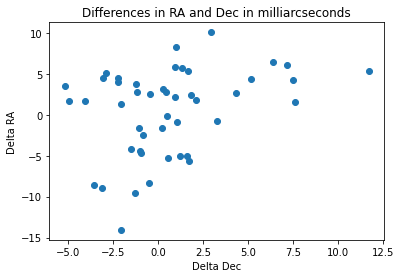

starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal.fits
Image mean, median and std 11.394609 10.827406 55.007805
    xcentroid          ycentroid                RA                     Dec          
------------------ ------------------ ---------------------- -----------------------
 608.5461714111817 2.5131153270429225  0.0008811535076687153   -0.014594743852346248
 685.5165542363047  5.522005289569982      359.9985263490218   -0.014309429398466314
 886.3377102041173  32.12032234845156     359.99243210897583   -0.012997421405947096
  953.858650908105 37.038714754591744     359.99037445698593   -0.012674313169426505
 444.4760693354769 61.921174725845646   0.006066872395400456   -0.013223584608591675
 708.5375051993097  73.05653065791925      359.9979904139565   -0.012224485327696166
 373.6920713251912  82.73362445593573   0.008291490212003361   -0.012772364504572807
 429.1710480615856   96.9361473590585  0.0066252915340002895   -0.012205382067991825
486.33656507950644  111.092996888

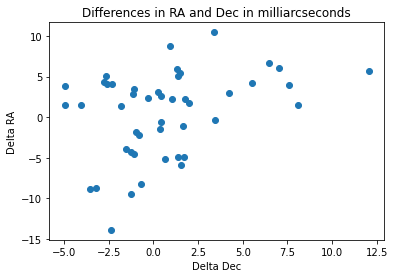

starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal.fits
Image mean, median and std 11.459499 10.829639 55.680965
    xcentroid          ycentroid                RA                    Dec          
------------------ ------------------ ---------------------- ----------------------
  632.757520509536  43.52799873198921  0.0008804967979520648  -0.014626457969967293
 709.8257801184594 47.507856164720145     359.99852516247785  -0.014311550857858348
 910.5959218383333  74.15073580836673     359.99243330115337  -0.012997209251142885
 978.1734916601412  79.09634950402457     359.99037406382115  -0.012674008968996101
 468.7130887677887 103.70932107395348   0.006068286014852335   -0.01322360404683915
  732.790984782116 114.80235210425441     359.99799208670777  -0.012224549793193257
  397.984710427444 124.51324600589399   0.008291256163280063  -0.012770390494991906
453.48648150451567  138.5482319055374   0.006624203827780067  -0.012205946184055615
 510.5826324979371 152.64448533976542   0.0

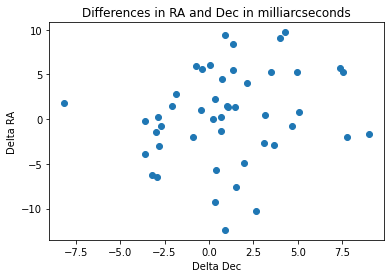

starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal.fits
Image mean, median and std 11.461396 10.8295555 55.684906
    xcentroid          ycentroid                RA                    Dec          
------------------ ------------------ ---------------------- ----------------------
 632.7561014527342  43.52872182023289  0.0010205421837794608  -0.014486439834403033
 709.8260670657803   47.5058809583951      359.9986651486738  -0.014171609453174118
 910.5951520227544  74.15262735916836     359.99257332956284  -0.012857154436161493
 978.1739871993807   79.0963228230719      359.9905140485703  -0.012534008485688053
468.71224848996206 103.70989382247947   0.006208313253700151  -0.013083588821216326
 732.7915923131342 114.80647731539594      359.9981320786759  -0.012084423456772018
397.98413357499743 124.51335799099897   0.008431274139434002  -0.012630388543481575
  453.486222463101  138.5458169269537   0.006764205617381574   -0.01206602013451995
510.58256909558963  152.6453203832899   0.

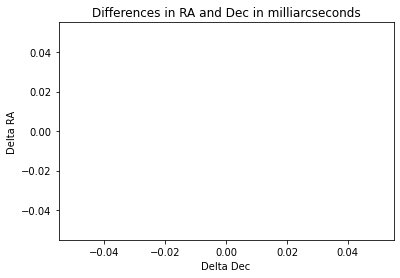

starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal.fits
Image mean, median and std 11.166319 10.819193 52.431835
    xcentroid          ycentroid                RA                     Dec          
------------------ ------------------ ---------------------- -----------------------
 646.9460364189496 123.58824806720995  0.0008803409666353219    -0.01462544759401453
 724.0252320146072  127.5820452764259      359.9985251448545      -0.014310524077353
 924.8606761687124 154.24326052907645      359.9924329361845   -0.012996383566727537
   992.45691902968 159.27374467532363     359.99037339685844   -0.012673064323221303
482.87053476521277 183.28959656865936   0.006068231603246421   -0.013222390879844007
 747.0589422960411 194.39222695244513      359.9979919488258   -0.012223096373398978
412.11218706689084 203.90829274053294   0.008291045403339596   -0.012771385160995604
467.56583952342805 217.90372011464456    0.00662635936109802    -0.01220484372594049
 524.7770858845939 231.8931155015

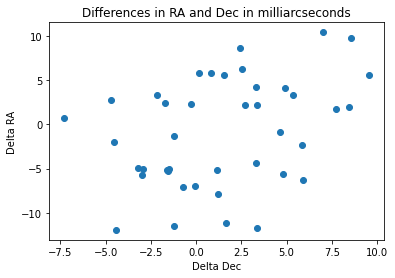

starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal.fits
Image mean, median and std 11.167205 10.820021 52.420555
    xcentroid          ycentroid                RA                    Dec          
------------------ ------------------ ---------------------- ----------------------
 646.9454800415763 123.59122321380107  0.0008803656879164385  -0.014625358834867506
 724.0256726768248 127.58013796160934      359.9985251264132   -0.01431058074881553
 924.8597080043684  154.2432706124099     359.99243296590157  -0.012996385708730001
 992.4534255006282  159.2718625921307      359.9903734990552  -0.012673130090554478
 482.8696673425391  183.2899835191299   0.006068259202637669  -0.013222381265036554
 747.0578849106864 194.39226082259032      359.9979919813537  -0.012223097981552028
 412.1139269048188 203.90945048821695    0.00829099500464183  -0.012771345469780142
467.56675428766414  217.9036290726527  0.0066263310760417415   -0.01220484420928609
 524.7779965210373 231.88761492892587   0.0

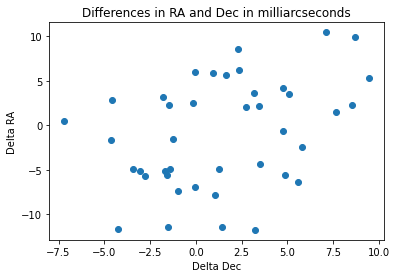

starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal.fits
Image mean, median and std 11.14942 10.819677 52.3238
    xcentroid          ycentroid                RA                     Dec          
------------------ ------------------ ---------------------- -----------------------
 695.2882988999536 103.10651467532003  0.0008800008772832899   -0.014624813910079982
 772.3744183009295  107.0815682195305      359.9985245931245   -0.014309869787115948
  973.228381685913 133.63302595063803     359.99243224223216   -0.012997673379714877
 531.2457880501139 162.90678044840305   0.006067753827247839   -0.013222863142923662
 795.4098654036351 173.99541287004112      359.9979911433319   -0.012223925183360086
  460.547711377863  183.5249036196875   0.008289441834595316   -0.012772358696295038
 515.9706963233565 197.55498823067623   0.006625409028767752   -0.012205661433268716
 573.1045796641623 211.60813499707166   0.004909149394200925    -0.01163371221201762
 899.8933788590772 236.1964594074282

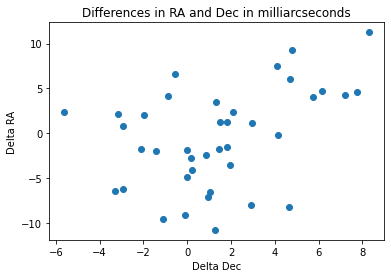

starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal.fits
Image mean, median and std 11.148314 10.819933 52.31703
    xcentroid          ycentroid                RA                    Dec          
------------------ ------------------ ---------------------- ----------------------
   695.28794170584 103.10641319490699  0.0008800115795231863   -0.01462481787900968
 772.3731936505352 107.08007937646431      359.9985246268782  -0.014309917872403828
 973.2281832908834  133.6348268676595       359.992432252969  -0.012997619538201288
 531.2461240972619 162.90616024026545   0.006067741924447004  -0.013222881168460607
 795.4082883628598  173.9964145346605     359.99799119432987   -0.01222389869223297
 460.5482539991836 183.52565213354322   0.008289427105149128  -0.012772334529918135
  515.971022928771 197.55386309448286   0.006625396116303293  -0.012205694933804823
 573.1055169320389  211.6075876893692  0.0049091192277255415  -0.011633726576394846
 899.8952017510751 236.19527724644132     35

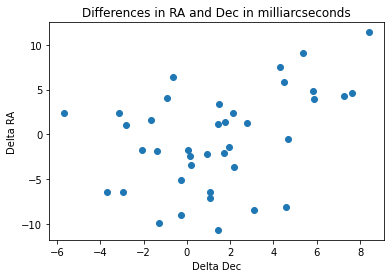

RA difference mean, median and std (units in mas) 1.1084997025612093 0.928302277808206 3.5773131993903524
Dec difference mean, median and std (units in mas) -0.17537865973407207 1.1691161048078824 5.539940734870295


In [26]:
# find stars and get RA, Dec from *_cal.fits files

# Run DAOStarFinder to find sources in image
allRAdiff_cal = []
allDecdiff_cal = []

for calimage in imagelist:
    image = ImageModel(calimage)
    
    # pull out data portion of input file
    data = image.data
    
    # print stats on input image
    print(calimage)
    mean, median, std = sigma_clipped_stats(data, sigma=200.0, maxiters=5)  # default sigma=3
    print('Image mean, median and std',mean, median, std)

    ap_radius = 5.  # radius for aperture for centroiding and photometry

    daofind = DAOStarFinder(fwhm=3.0, threshold=10.*std)    # default threshold=5*std, fwhm=3
    sources = daofind(data)      

    # Create apertures for x,y positions
    positions = tuple(zip(sources['xcentroid'], sources['ycentroid']))
    #print(positions)

    #positions = (sources['xcentroid'], sources['ycentroid'])
    apertures = CircularAperture(positions, r=ap_radius)
    
    # using wcs info from images, put coordinates into RA, Dec
    ra, dec = image.meta.wcs(sources['xcentroid'], sources['ycentroid'])

    # add RA, Dec to sources table

    ra_col = Column(name='RA', data=ra)
    dec_col = Column(name='Dec', data=dec)
    sources.add_column(ra_col)
    sources.add_column(dec_col)

    # print RA, Dec for each x, y position found
    #print(sources['xcentroid', 'ycentroid', 'RA', 'Dec'])  

    sources_sub = sources['xcentroid', 'ycentroid', 'RA', 'Dec']
    sources_sub.pprint_all()
    print()
    
    # read in text file with RA and Dec input coordinates
    RA_in, Dec_in = np.loadtxt(coords, dtype=str, unpack=True)

    # put RA and Dec into floats
    RA_sim = RA_in.astype(float)
    Dec_sim = Dec_in.astype(float)
    
    # Put ra, dec coords into a table
    cat1_sim = Table([RA_sim, Dec_sim], names=('ra', 'dec'))
    cat2_calc = Table([ra, dec], names=('ra', 'dec'))
    

    # Get coordinates with SkyCoord for each catalog
    
    coord_cat1_sim = SkyCoord(ra=cat1_sim['ra'], dec=cat1_sim['dec'], unit="deg")
    coord_cat2_calc = SkyCoord(ra=cat2_calc['ra'], dec=cat2_calc['dec'], unit="deg")
    ind_cat2_cat1, dist_2d, _ = match_coordinates_sky(coord_cat1_sim, coord_cat2_calc)
    
    # Find where the catalogs match
    
    cat1_matched = cat1_sim[dist_2d.arcsec<0.05]
    cat2_matched = cat2_calc[ind_cat2_cat1[dist_2d.arcsec<0.05]]
    
    #print(cat1_matched)
    
    # Get differences in RA, Dec
    ra_diff = cat2_matched['ra'] - cat1_matched['ra']
    dec_diff = cat2_matched['dec'] - cat1_matched['dec'] 
    
    #print(ra_diff)
    
    # put differences in milliarcseconds
    ra_diff = ra_diff * 3600000
    dec_diff = dec_diff * 3600000
    
    
    # Compare input RA, Dec to found RA, Dec
    print('RA_Diff (mas)  Dec_diff (mas) pass/fail')
    # Find if the differences are within the allowed 30 mas range
    for i in np.arange(0,len(ra_diff)):
        #if ra_diff[i] < 30 and dec_diff[i] < 30:
        allRAdiff_cal.append(ra_diff[i])
        allDecdiff_cal.append(dec_diff[i])
        if abs(ra_diff[i]) < 30 and abs(dec_diff[i]) < 30: 
            test = 'pass' 
        else: 
            test = 'fail'
        print('{:15.6f} {:15.6f} {}'.format(ra_diff[i], dec_diff[i], test))
 
    
    # Plot ra and dec differences
    plt.title ('Differences in RA and Dec in milliarcseconds')
    plt.ylabel('Delta RA')
    plt.xlabel('Delta Dec')
    plt.scatter(ra_diff,dec_diff)
    plt.show()

    # Plot should show no differences greater than 30 milliarcseconds  
    
meanRAdiff_cal, medianRAdiff_cal, stdRAdiff_cal = sigma_clipped_stats(allRAdiff_cal, sigma=5.0, maxiters=5)  # default sigma=3
meanDecdiff_cal, medianDecdiff_cal, stdDecdiff_cal = sigma_clipped_stats(allDecdiff_cal, sigma=5.0, maxiters=5)  # default sigma=3

print('RA difference mean, median and std (units in mas)',meanRAdiff_cal, medianRAdiff_cal, stdRAdiff_cal) 
print('Dec difference mean, median and std (units in mas)',meanDecdiff_cal, medianDecdiff_cal, stdDecdiff_cal)

### Run the images through calwebb_image3 with tweakreg on

Alter any parameters needed to get better results from tweakreg. Look at individual i2d images afterwards.

In [27]:
# Run Calwebb_image3 on the association table with tweakreg on
    
# set any specific parameters
# tweakreg parameters to allow data to run
fwhm = 3.318 #3.27  # Gaussian kernel FWHM of objects expected, default=2.5
minobj = 5  # minimum number of objects needed to match positions for a good fit, default=15
snr = 40 # signal to noise threshold, default=5
sigma = 3 # clipping limit, in sigma units, used when performing fit, default=3
fit_geom ='rshift' # ftype of affine transformation to be considered when fitting catalogs, default='general'
use2dhist = False  # boolean indicating whether to use 2D histogram to find initial offset, default=True
search_radius = 1.0 # radius in arcseconds to search for a match
tol = 1.0  # Matching tolerance for xyxymatch in arcsec. (Default=1.0)
use2dhist = True  # boolean indicating whether to use 2D histogram to find initial offset, default=True
   
pipe3=Image3Pipeline()    
pipe3.tweakreg.kernel_fwhm = fwhm
pipe3.tweakreg.snr_threshold = snr
pipe3.tweakreg.minobj = minobj
pipe3.tweakreg.sigma = sigma
pipe3.tweakreg.fitgeometry = fit_geom
pipe3.tweakreg.use2dhist = use2dhist
pipe3.tweakreg.save_catalogs = True
#pipe3.tweakreg.skip = True        # test to see if this affects the final output
pipe3.outlier_detection.skip = True
pipe3.source_catalog.save_results = True
pipe3.save_results = True
#pipe3.output_dir = datadir

# run Image3

#im = pipe3.run(rtdata.input)
image = pipe3.run('starfield_50star4ptdither_asnfile.json')
print('Image 3 pipeline finished.')

2022-06-20 22:04:02,369 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2022-06-20 22:04:02,372 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2022-06-20 22:04:02,375 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2022-06-20 22:04:02,377 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2022-06-20 22:04:02,380 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2022-06-20 22:04:02,382 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2022-06-20 22:04:02,384 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2022-06-20 22:04:02,592 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('starfield_50star4ptdither_asnfile.json',).


2022-06-20 22:04:02,598 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'steps': {'assign_mtwcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': True, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'assign_mtwcs', 'search_output_file': True, 'input_dir': ''}, 'tweakreg': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': True, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_catalogs': True, 'catalog_format': 'ecsv', 'kernel_fwhm': 3.318, 'snr_threshold': 40, 'brightest': 

2022-06-20 22:04:02,728 - stpipe.Image3Pipeline - INFO - Prefetching reference files for dataset: 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal.fits' reftypes = ['abvegaoffset', 'apcorr', 'drizpars']


2022-06-20 22:04:02,733 - stpipe.Image3Pipeline - INFO - Prefetch for ABVEGAOFFSET reference file is '/grp/crds/cache/references/jwst/jwst_miri_abvegaoffset_0001.asdf'.


2022-06-20 22:04:02,735 - stpipe.Image3Pipeline - INFO - Prefetch for APCORR reference file is '/grp/crds/cache/references/jwst/jwst_miri_apcorr_0005.fits'.


2022-06-20 22:04:02,737 - stpipe.Image3Pipeline - INFO - Prefetch for DRIZPARS reference file is '/grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits'.


2022-06-20 22:04:02,738 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2022-06-20 22:04:03,825 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<ModelContainer>,).


2022-06-20 22:04:03,829 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': True, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_catalogs': True, 'catalog_format': 'ecsv', 'kernel_fwhm': 3.318, 'snr_threshold': 40, 'brightest': 200, 'peakmax': None, 'enforce_user_order': False, 'expand_refcat': False, 'minobj': 5, 'searchrad': 2.0, 'use2dhist': True, 'separation': 1.0, 'tolerance': 0.7, 'xoffset': 0.0, 'yoffset': 0.0, 'fitgeometry': 'rshift', 'nclip': 3, 'sigma': 3, 'align_to_gaia': False, 'gaia_catalog': 'GAIADR2', 'min_gaia': 5, 'save_gaia_catalog': False}


2022-06-20 22:04:04,086 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 48 sources in starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal.fits.


2022-06-20 22:04:04,091 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal_cat.ecsv


2022-06-20 22:04:04,366 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 48 sources in starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal.fits.


2022-06-20 22:04:04,372 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal_cat.ecsv


2022-06-20 22:04:04,657 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 49 sources in starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal.fits.


2022-06-20 22:04:04,661 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal_cat.ecsv


2022-06-20 22:04:04,952 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 48 sources in starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal.fits.


2022-06-20 22:04:04,956 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal_cat.ecsv


2022-06-20 22:04:05,222 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 42 sources in starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal.fits.


2022-06-20 22:04:05,226 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal_cat.ecsv


2022-06-20 22:04:05,492 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 42 sources in starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal.fits.


2022-06-20 22:04:05,498 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal_cat.ecsv


2022-06-20 22:04:05,761 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 43 sources in starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal.fits.


2022-06-20 22:04:05,766 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal_cat.ecsv


2022-06-20 22:04:06,016 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 42 sources in starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal.fits.


2022-06-20 22:04:06,021 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal_cat.ecsv


2022-06-20 22:04:06,046 - stpipe.Image3Pipeline.tweakreg - INFO - 


2022-06-20 22:04:06,047 - stpipe.Image3Pipeline.tweakreg - INFO - Number of image groups to be aligned: 8.


2022-06-20 22:04:06,048 - stpipe.Image3Pipeline.tweakreg - INFO - Image groups:


2022-06-20 22:04:06,073 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal':


2022-06-20 22:04:06,074 - stpipe.Image3Pipeline.tweakreg - INFO -      starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal


2022-06-20 22:04:06,099 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal':


2022-06-20 22:04:06,100 - stpipe.Image3Pipeline.tweakreg - INFO -      starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal


2022-06-20 22:04:06,125 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal':


2022-06-20 22:04:06,127 - stpipe.Image3Pipeline.tweakreg - INFO -      starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal


2022-06-20 22:04:06,150 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal':


2022-06-20 22:04:06,151 - stpipe.Image3Pipeline.tweakreg - INFO -      starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal


2022-06-20 22:04:06,176 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal':


2022-06-20 22:04:06,177 - stpipe.Image3Pipeline.tweakreg - INFO -      starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal


2022-06-20 22:04:06,201 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal':


2022-06-20 22:04:06,202 - stpipe.Image3Pipeline.tweakreg - INFO -      starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal


2022-06-20 22:04:06,226 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal':


2022-06-20 22:04:06,227 - stpipe.Image3Pipeline.tweakreg - INFO -      starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal


2022-06-20 22:04:06,250 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal':


2022-06-20 22:04:06,251 - stpipe.Image3Pipeline.tweakreg - INFO -      starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal


2022-06-20 22:04:06,252 - stpipe.Image3Pipeline.tweakreg - INFO - 


2022-06-20 22:04:06,253 - stpipe.Image3Pipeline.tweakreg - INFO -  


2022-06-20 22:04:06,254 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() started on 2022-06-20 22:04:06.253537


2022-06-20 22:04:06,255 - stpipe.Image3Pipeline.tweakreg - INFO -       Version 0.7.4


2022-06-20 22:04:06,256 - stpipe.Image3Pipeline.tweakreg - INFO -  


2022-06-20 22:04:06,423 - stpipe.Image3Pipeline.tweakreg - INFO - Selected image 'GROUP ID: starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal' as reference image


2022-06-20 22:04:06,428 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal' to the reference catalog.


2022-06-20 22:04:06,547 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal' catalog with sources from the reference 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal' catalog.


2022-06-20 22:04:06,548 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2022-06-20 22:04:06,551 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 3.997e-15, -6.217e-15 with significance of 48 and 56 matches.


2022-06-20 22:04:06,553 - stpipe.Image3Pipeline.tweakreg - INFO - Found 48 matches for 'GROUP ID: starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal'...


2022-06-20 22:04:06,554 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2022-06-20 22:04:06,556 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal:


2022-06-20 22:04:06,557 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -4.99872e-05  YSH: -1.34437e-05    ROT: 5.32927e-05    SCALE: 1


2022-06-20 22:04:06,558 - stpipe.Image3Pipeline.tweakreg - INFO - 


2022-06-20 22:04:06,559 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.000287318   FIT MAE: 0.000256544


2022-06-20 22:04:06,560 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 48 objects.


2022-06-20 22:04:06,599 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal' to the reference catalog.


2022-06-20 22:04:06,718 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal' catalog with sources from the reference 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal' catalog.


2022-06-20 22:04:06,720 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2022-06-20 22:04:06,722 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of -8.882e-16, -1.421e-14 with significance of 47 and 55 matches.


2022-06-20 22:04:06,724 - stpipe.Image3Pipeline.tweakreg - INFO - Found 47 matches for 'GROUP ID: starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal'...


2022-06-20 22:04:06,725 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2022-06-20 22:04:06,730 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal:


2022-06-20 22:04:06,731 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.000321171  YSH: -4.24579e-05    ROT: -0.000894824    SCALE: 1


2022-06-20 22:04:06,732 - stpipe.Image3Pipeline.tweakreg - INFO - 


2022-06-20 22:04:06,732 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00527931   FIT MAE: 0.00461642


2022-06-20 22:04:06,733 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 46 objects.


2022-06-20 22:04:06,772 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal' to the reference catalog.


2022-06-20 22:04:06,890 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal' catalog with sources from the reference 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal' catalog.


2022-06-20 22:04:06,891 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2022-06-20 22:04:06,893 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.6648, 0.4196 with significance of 21.66 and 56 matches.


2022-06-20 22:04:06,895 - stpipe.Image3Pipeline.tweakreg - INFO - Found 47 matches for 'GROUP ID: starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal'...


2022-06-20 22:04:06,898 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2022-06-20 22:04:06,901 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal:


2022-06-20 22:04:06,902 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.504339  YSH: -0.504285    ROT: -0.000801053    SCALE: 1


2022-06-20 22:04:06,902 - stpipe.Image3Pipeline.tweakreg - INFO - 


2022-06-20 22:04:06,903 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00545887   FIT MAE: 0.00479425


2022-06-20 22:04:06,904 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 46 objects.


2022-06-20 22:04:06,944 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal' to the reference catalog.


2022-06-20 22:04:07,062 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal' catalog with sources from the reference 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal' catalog.


2022-06-20 22:04:07,063 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2022-06-20 22:04:07,065 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of -2.22e-15, -1.11e-14 with significance of 41 and 47 matches.


2022-06-20 22:04:07,067 - stpipe.Image3Pipeline.tweakreg - INFO - Found 41 matches for 'GROUP ID: starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal'...


2022-06-20 22:04:07,068 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2022-06-20 22:04:07,072 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal:


2022-06-20 22:04:07,072 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.000303586  YSH: 0.00105847    ROT: -0.000552349    SCALE: 1


2022-06-20 22:04:07,073 - stpipe.Image3Pipeline.tweakreg - INFO - 


2022-06-20 22:04:07,074 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00771548   FIT MAE: 0.00684298


2022-06-20 22:04:07,075 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 40 objects.


2022-06-20 22:04:07,114 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal' to the reference catalog.


2022-06-20 22:04:07,232 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal' catalog with sources from the reference 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal' catalog.


2022-06-20 22:04:07,233 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2022-06-20 22:04:07,234 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of -2.22e-15, -1.11e-14 with significance of 41 and 47 matches.


2022-06-20 22:04:07,236 - stpipe.Image3Pipeline.tweakreg - INFO - Found 41 matches for 'GROUP ID: starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal'...


2022-06-20 22:04:07,237 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2022-06-20 22:04:07,240 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal:


2022-06-20 22:04:07,240 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.000286148  YSH: 0.00108692    ROT: -0.000523678    SCALE: 1


2022-06-20 22:04:07,241 - stpipe.Image3Pipeline.tweakreg - INFO - 


2022-06-20 22:04:07,242 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00770516   FIT MAE: 0.00682456


2022-06-20 22:04:07,242 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 40 objects.


2022-06-20 22:04:07,280 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal' to the reference catalog.


2022-06-20 22:04:07,632 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal' catalog with sources from the reference 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal' catalog.


2022-06-20 22:04:07,633 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2022-06-20 22:04:07,635 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 1.332e-15, -1.066e-14 with significance of 40 and 48 matches.


2022-06-20 22:04:07,636 - stpipe.Image3Pipeline.tweakreg - INFO - Found 40 matches for 'GROUP ID: starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal'...


2022-06-20 22:04:07,637 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2022-06-20 22:04:07,640 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal:


2022-06-20 22:04:07,641 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.000237614  YSH: 0.00262767    ROT: 0.000387146    SCALE: 1


2022-06-20 22:04:07,642 - stpipe.Image3Pipeline.tweakreg - INFO - 


2022-06-20 22:04:07,642 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0110158   FIT MAE: 0.0068922


2022-06-20 22:04:07,643 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 39 objects.


2022-06-20 22:04:07,682 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal' to the reference catalog.


2022-06-20 22:04:07,799 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal' catalog with sources from the reference 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal' catalog.


2022-06-20 22:04:07,801 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2022-06-20 22:04:07,802 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 1.332e-15, -1.066e-14 with significance of 40 and 48 matches.


2022-06-20 22:04:07,804 - stpipe.Image3Pipeline.tweakreg - INFO - Found 40 matches for 'GROUP ID: starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal'...


2022-06-20 22:04:07,805 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2022-06-20 22:04:07,808 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal:


2022-06-20 22:04:07,809 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.000265638  YSH: 0.00262238    ROT: 0.000458858    SCALE: 1


2022-06-20 22:04:07,809 - stpipe.Image3Pipeline.tweakreg - INFO - 


2022-06-20 22:04:07,810 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0110242   FIT MAE: 0.00691673


2022-06-20 22:04:07,810 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 39 objects.


2022-06-20 22:04:07,850 - stpipe.Image3Pipeline.tweakreg - INFO -  


2022-06-20 22:04:07,851 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() ended on 2022-06-20 22:04:07.850367


2022-06-20 22:04:07,851 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() TOTAL RUN TIME: 0:00:01.596830


2022-06-20 22:04:07,852 - stpipe.Image3Pipeline.tweakreg - INFO -  


2022-06-20 22:04:08,308 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg done


2022-06-20 22:04:08,538 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<ModelContainer>,).


2022-06-20 22:04:08,540 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'skymethod': 'match', 'match_down': True, 'subtract': False, 'stepsize': None, 'skystat': 'mode', 'dqbits': '~DO_NOT_USE+NON_SCIENCE', 'lower': None, 'upper': None, 'nclip': 5, 'lsigma': 4.0, 'usigma': 4.0, 'binwidth': 0.1}


2022-06-20 22:04:08,780 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:04:08,781 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() started on 2022-06-20 22:04:08.780471


2022-06-20 22:04:08,782 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:04:08,783 - stpipe.Image3Pipeline.skymatch - INFO - Sky computation method: 'match'


2022-06-20 22:04:08,783 - stpipe.Image3Pipeline.skymatch - INFO - Sky matching direction: DOWN


2022-06-20 22:04:08,784 - stpipe.Image3Pipeline.skymatch - INFO - Sky subtraction from image data: OFF


2022-06-20 22:04:08,785 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:04:08,785 - stpipe.Image3Pipeline.skymatch - INFO - ----  Computing differences in sky values in overlapping regions.


2022-06-20 22:04:21,855 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal.fits. Sky background: 0.00238358


2022-06-20 22:04:21,857 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal.fits. Sky background: 0.0124171


2022-06-20 22:04:21,858 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal.fits. Sky background: 0.00851901


2022-06-20 22:04:21,858 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal.fits. Sky background: 0.00484789


2022-06-20 22:04:21,859 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal.fits. Sky background: 0


2022-06-20 22:04:21,860 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal.fits. Sky background: 0.00727946


2022-06-20 22:04:21,860 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal.fits. Sky background: 0.00377957


2022-06-20 22:04:21,861 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal.fits. Sky background: 0.0117165


2022-06-20 22:04:21,861 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:04:21,862 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() ended on 2022-06-20 22:04:21.861791


2022-06-20 22:04:21,862 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() TOTAL RUN TIME: 0:00:13.081320


2022-06-20 22:04:21,863 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:04:21,899 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch done


2022-06-20 22:04:22,152 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<ModelContainer>,).


2022-06-20 22:04:22,155 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': True, 'suffix': 'crf', 'search_output_file': False, 'input_dir': '', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None}


2022-06-20 22:04:22,155 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2022-06-20 22:04:22,167 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection done


2022-06-20 22:04:22,347 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<ModelContainer>,).


2022-06-20 22:04:22,349 - stpipe.Image3Pipeline.resample - INFO - Step resample parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'i2d', 'search_output_file': True, 'input_dir': '', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'weight_type': 'ivm', 'output_shape': None, 'crpix': None, 'crval': None, 'rotation': None, 'pixel_scale_ratio': 1.0, 'pixel_scale': None, 'single': False, 'blendheaders': True, 'allowed_memory': None}


2022-06-20 22:04:22,367 - stpipe.Image3Pipeline.resample - INFO - Drizpars reference file: /grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits


2022-06-20 22:04:22,565 - stpipe.Image3Pipeline.resample - INFO - Blending metadata for starfield_50star4ptdither_combined.fits


2022-06-20 22:04:23,270 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2022-06-20 22:04:23,883 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:25,011 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:26,126 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:27,244 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:28,362 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:29,475 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:30,583 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:31,694 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:32,047 - stpipe.Image3Pipeline.resample - INFO - Resampling var_rnoise


2022-06-20 22:04:32,658 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:33,754 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:34,852 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:35,946 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:37,045 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:38,147 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:39,239 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:40,359 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:40,715 - stpipe.Image3Pipeline.resample - INFO - Resampling var_poisson


2022-06-20 22:04:41,342 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:42,458 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:43,572 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:44,688 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:45,902 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:47,030 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:48,154 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:49,282 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:49,639 - stpipe.Image3Pipeline.resample - INFO - Resampling var_flat


2022-06-20 22:04:50,253 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:51,357 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:52,481 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:53,605 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:54,740 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:55,867 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:56,998 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:58,113 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:04:58,493 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  0.021880412 -0.020262681 0.024953861 0.014759994 359.990667213 0.017768852 359.987593764 -0.017253822


2022-06-20 22:04:58,938 - stpipe.Image3Pipeline.resample - INFO - Saved model in starfield_50star4ptdither_combined_i2d.fits


2022-06-20 22:04:58,940 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2022-06-20 22:04:59,180 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1142, 1118) from starfield_50star4ptdither_combined_i2d.fits>,).


2022-06-20 22:04:59,182 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'cat', 'search_output_file': True, 'input_dir': '', 'bkg_boxsize': 100, 'kernel_fwhm': 2.0, 'snr_threshold': 3.0, 'npixels': 5, 'deblend': False, 'aperture_ee1': 30, 'aperture_ee2': 50, 'aperture_ee3': 70, 'ci1_star_threshold': 2.0, 'ci2_star_threshold': 1.8}


2022-06-20 22:04:59,211 - stpipe.Image3Pipeline.source_catalog - INFO - Using APCORR reference file: /grp/crds/cache/references/jwst/jwst_miri_apcorr_0005.fits


2022-06-20 22:04:59,224 - stpipe.Image3Pipeline.source_catalog - INFO - Using ABVEGAOFFSET reference file: /grp/crds/cache/references/jwst/jwst_miri_abvegaoffset_0001.asdf


2022-06-20 22:04:59,225 - stpipe.Image3Pipeline.source_catalog - INFO - Instrument: MIRI


2022-06-20 22:04:59,226 - stpipe.Image3Pipeline.source_catalog - INFO - Detector: MIRIMAGE


2022-06-20 22:04:59,226 - stpipe.Image3Pipeline.source_catalog - INFO - Filter: F1130W


2022-06-20 22:04:59,227 - stpipe.Image3Pipeline.source_catalog - INFO - Subarray: FULL


2022-06-20 22:04:59,292 - stpipe.Image3Pipeline.source_catalog - INFO - AB to Vega magnitude offset 5.49349


2022-06-20 22:04:59,864 - stpipe.Image3Pipeline.source_catalog - INFO - Detected 640 sources


2022-06-20 22:05:00,608 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote source catalog: starfield_50star4ptdither_combined_cat.ecsv


2022-06-20 22:05:00,733 - stpipe.Image3Pipeline.source_catalog - INFO - Saved model in starfield_50star4ptdither_combined_segm.fits


2022-06-20 22:05:00,735 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote segmentation map: starfield_50star4ptdither_combined_segm.fits


2022-06-20 22:05:00,736 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog done


2022-06-20 22:05:00,737 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


Image 3 pipeline finished.


### Go through list of individual images and see which sources were found for each image.

In [28]:
# Get list of catalogs

cataloglist = [ele.replace('cal.fits', 'cal_cat.ecsv') for ele in imagelist]
print(imagelist)
print()
print(cataloglist)

['starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal.fits', 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal.fits', 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal.fits', 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal.fits', 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal.fits', 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal.fits', 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal.fits', 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal.fits']

['starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal_cat.ecsv', 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal_cat.ecsv', 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal_cat.ecsv', 'starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal_cat.ecsv', 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal_cat.ecsv', 'starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal_cat.ecsv', 'starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal_cat.ecsv', 'starfield_50star4ptdith

starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal.fits
starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal_cat.ecsv
48 sources found


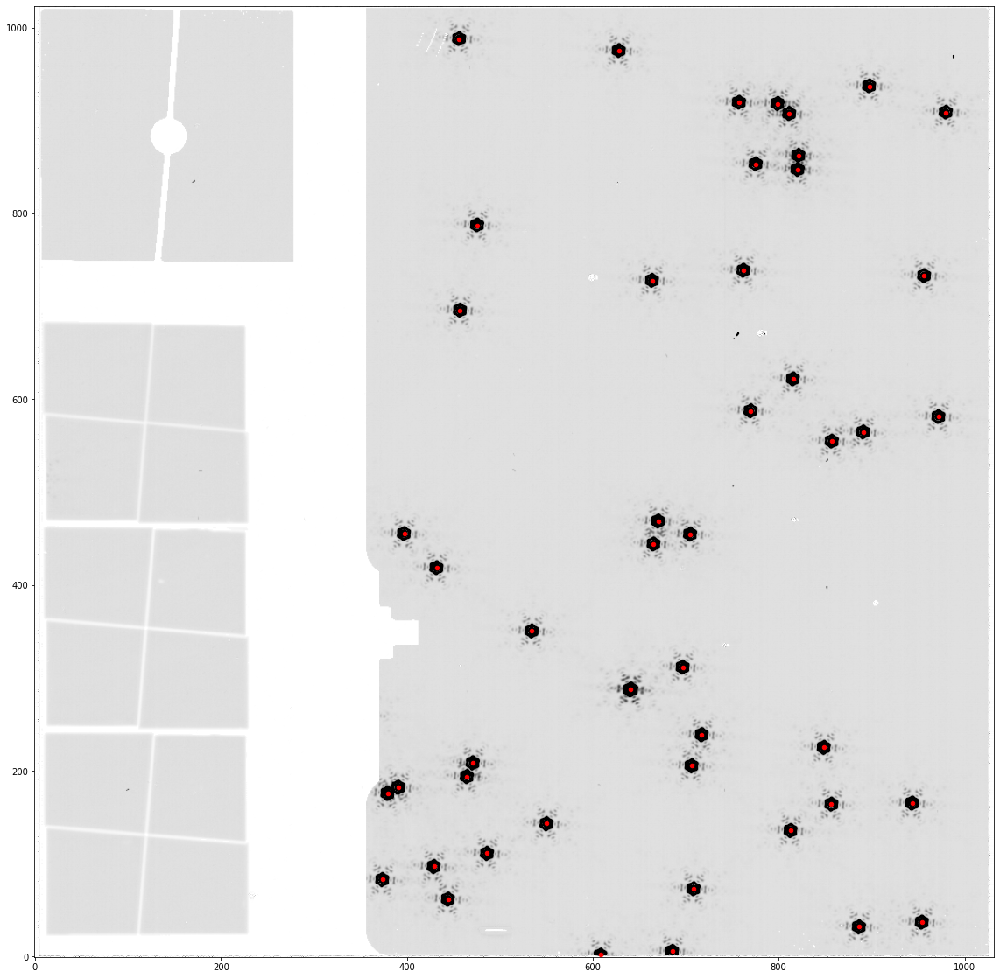


starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal.fits
starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal_cat.ecsv
48 sources found


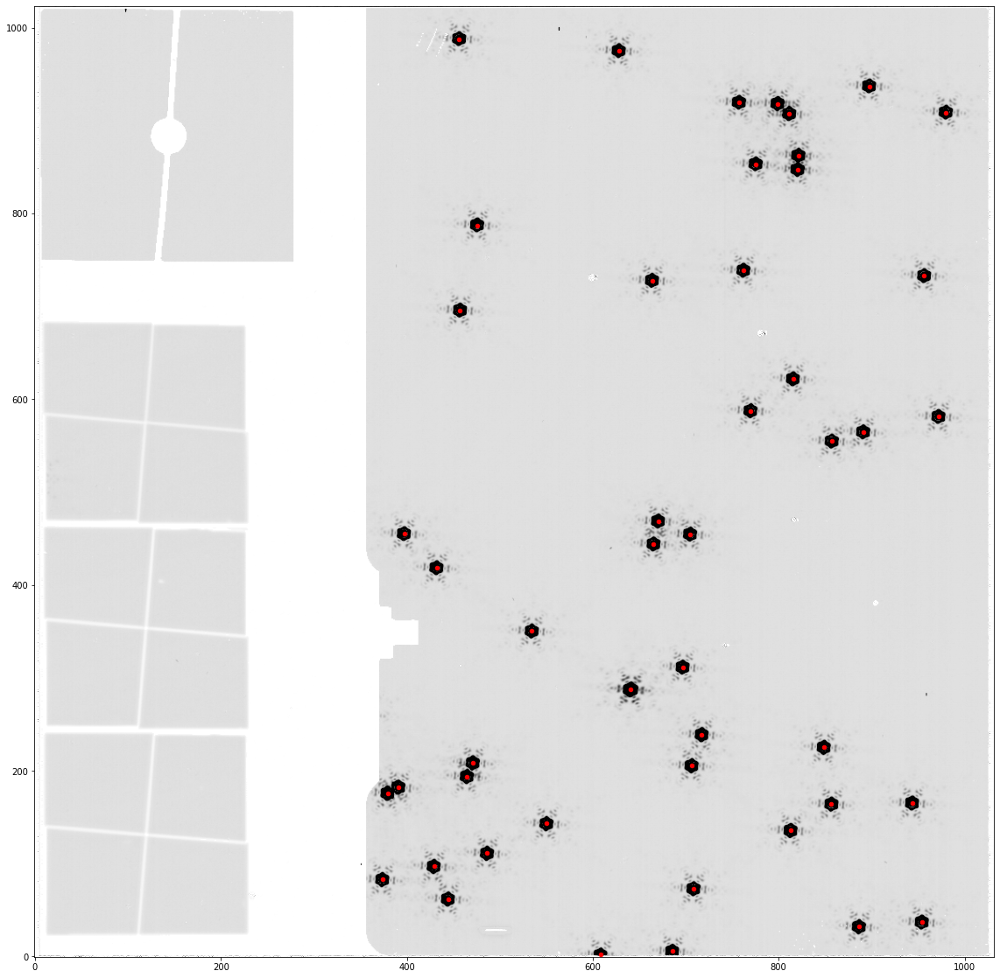


starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal.fits
starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal_cat.ecsv
49 sources found


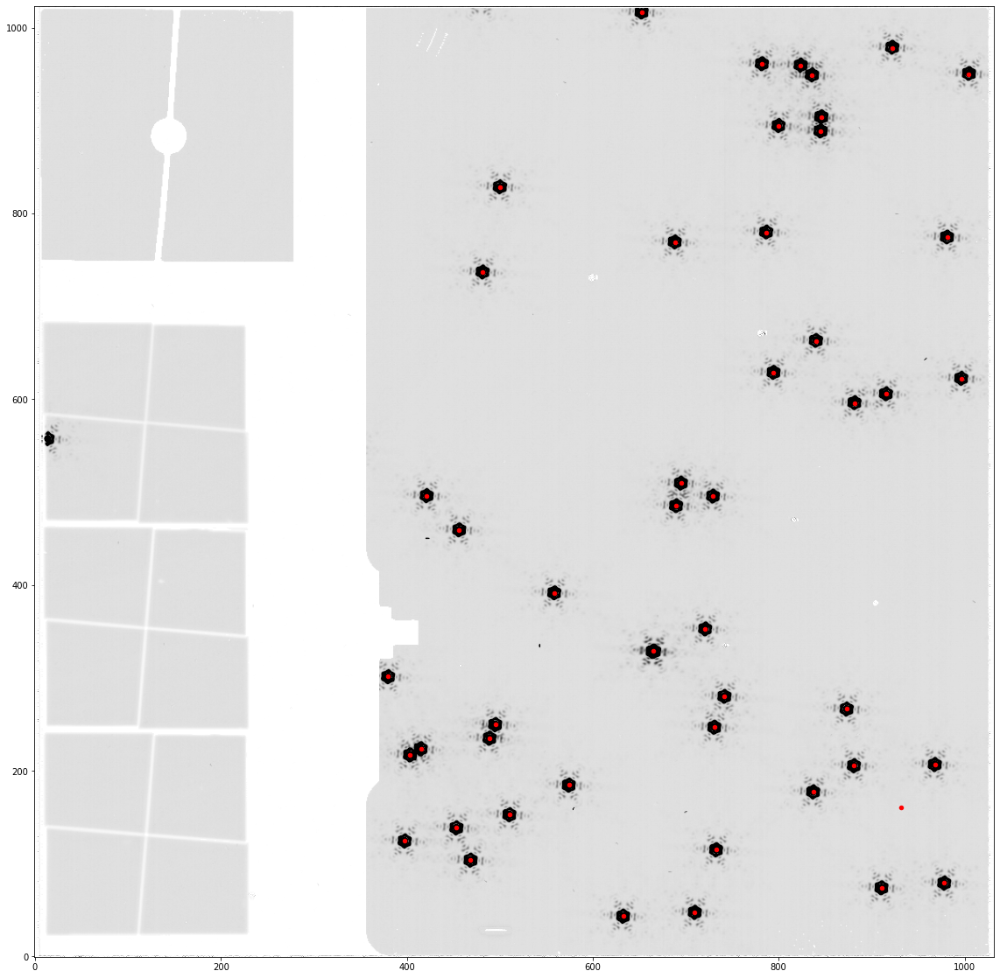


starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal.fits
starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal_cat.ecsv
48 sources found


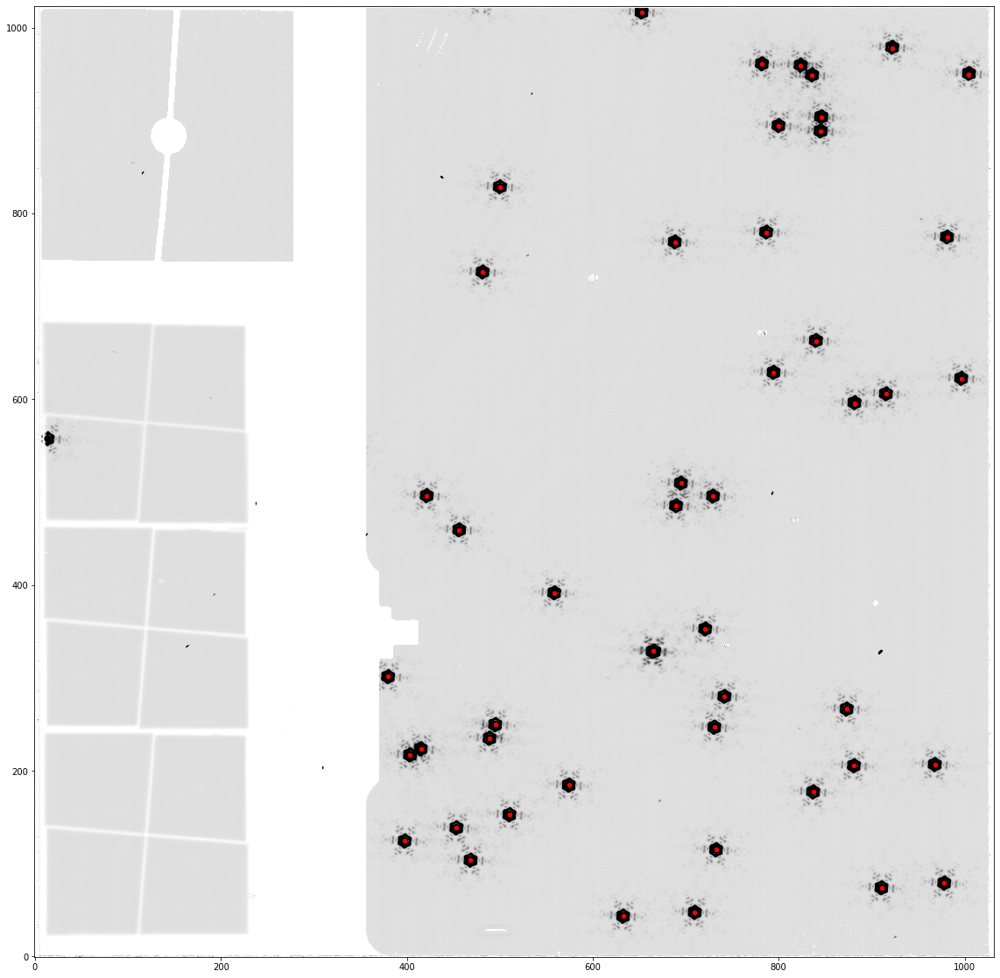


starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal.fits
starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal_cat.ecsv
42 sources found


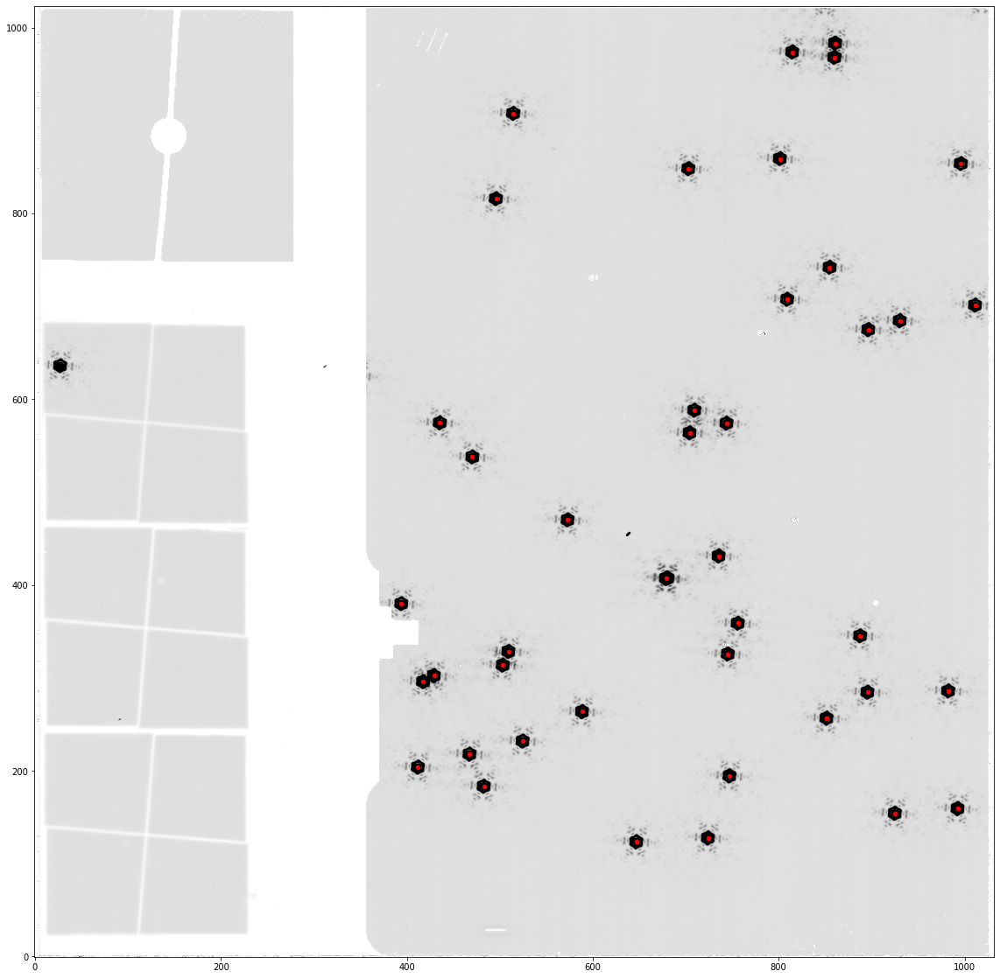


starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal.fits
starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal_cat.ecsv
42 sources found


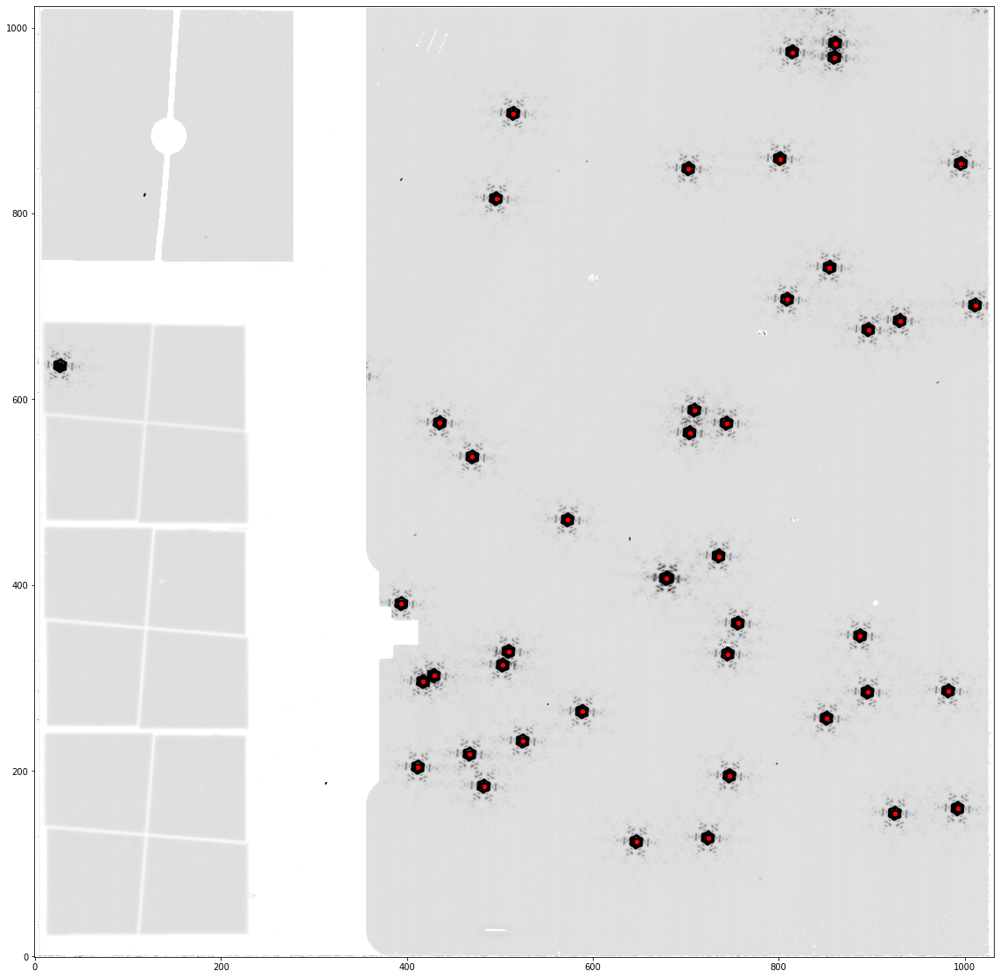

starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal.fits
starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal_cat.ecsv
43 sources found


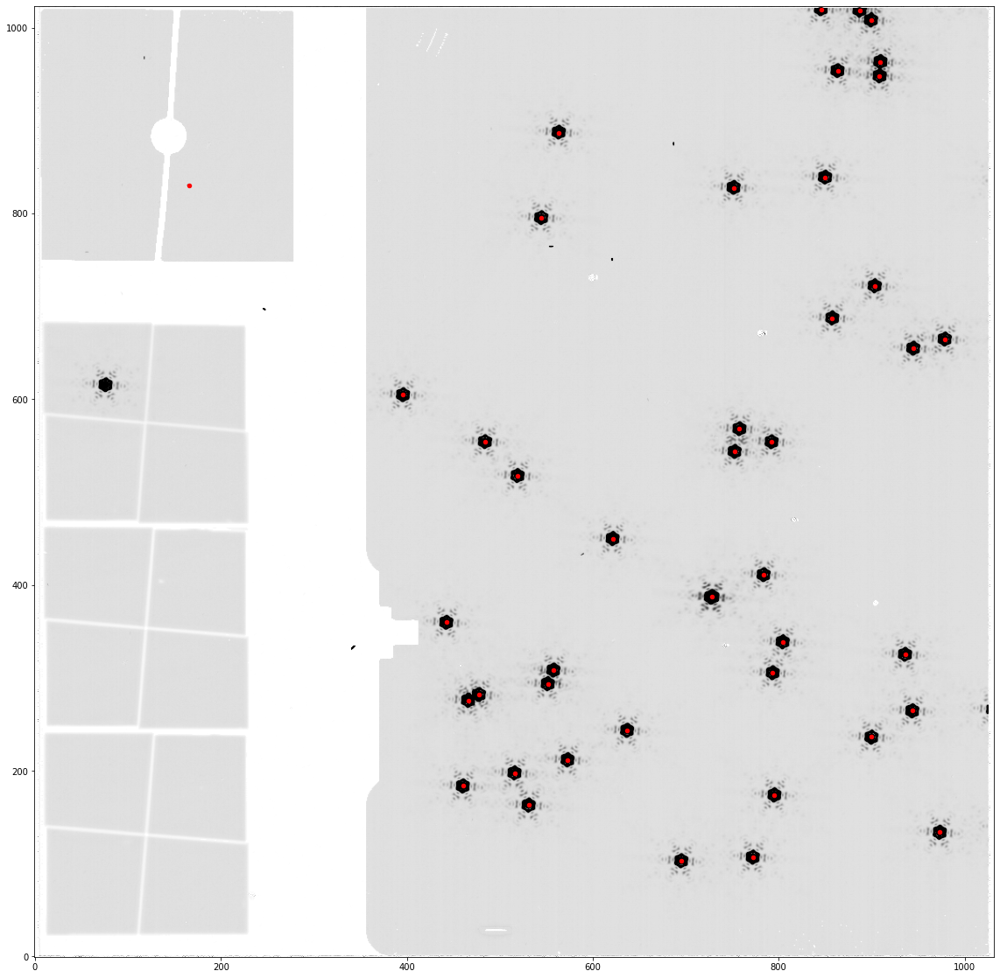


starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal.fits
starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal_cat.ecsv
42 sources found


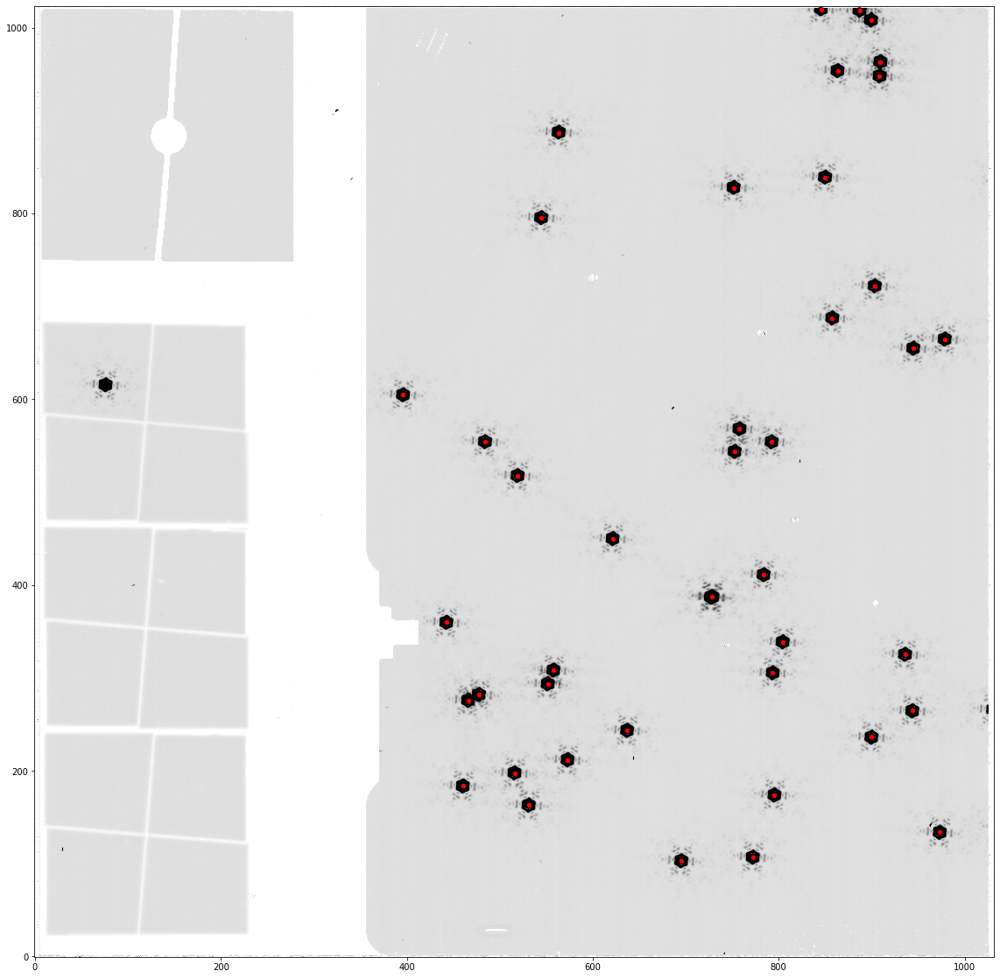

In [29]:
# Loop through each image and overplot the sources found in the individual catalogs

index=0
for cal_image in imagelist:
    indimage = ImageModel(cal_image)
    ind_data = indimage.data
    
    indcat = cataloglist[index]
    catdata = table.Table.read(indcat, format='ascii', comment='#')
    print(cal_image)
    print(indcat)
    print(len(catdata['xcentroid']), 'sources found')
    
    # mark sources on image frame to see if the correct sources were found
    norm = ImageNormalize(stretch=SqrtStretch())
    # keep image stretch in mind for plotting. sky subtracted range ~ (-15, 10), single sample ~ (0, 20)
    plt.figure(figsize=(20,20))
    plt.imshow(ind_data, cmap='Greys', origin='lower', vmin=0,vmax=50)#, norm=norm)
    plt.scatter(catdata['xcentroid'], catdata['ycentroid'],lw=1, s=20,color='red')
    plt.show()
    index = index+1
    print()

### Look at positions of RA, Dec and get stats on differences for the combined image run with tweakreg on

In [30]:
im = ImageModel('starfield_50star4ptdither_combined_i2d.fits')
pixarea = im.meta.photometry.pixelarea_steradians
print('Pixel area in steradians', pixarea)

# pull out data portion of input file
data = im.data

# print stats on input image
mean, median, std = sigma_clipped_stats(data, sigma=200.0, maxiters=5)  # default sigma=3
print('Image mean, median and std',mean, median, std)

Pixel area in steradians 2.84403609523084e-13
Image mean, median and std 10.235801 10.815083 46.580975


Number of sources found with DAOStarFinder:  50
    xcentroid          ycentroid                RA                     Dec          
------------------ ------------------ ---------------------- -----------------------
 695.5013548466345  122.7766822148834  0.0008813127711848324   -0.014625592280985556
  772.622355870295 126.26211162239302     359.99852555828454   -0.014311146882553569
 973.4755225173215 151.46687244793293     359.99243365822446   -0.012997617522665683
1041.0315301090152 156.07277990007543      359.9903742570985   -0.012674551574549303
 531.6380617008092 182.87454090622103   0.006068387211350582   -0.013223523830829635
 795.8149629671833 192.30948795497238     359.99799204349574   -0.012223198410312979
460.99121071659505  203.8389836956923   0.008291395128115275   -0.012770720539687534
 516.4547466729491 217.46520522871936   0.006627120148882256   -0.012203565446996089
 573.6924942597375  231.0210100241405   0.004908244412918651   -0.011633794958262018
  900.37879363640

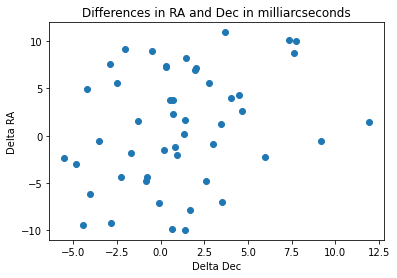


Number of sources matched:  48


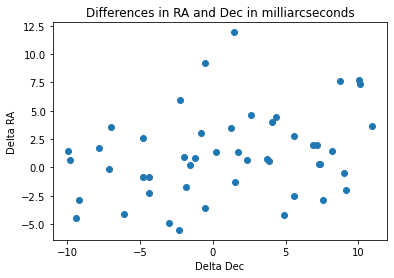

RA difference mean, median and std (units in mas) 1.1220575628978426 0.7866620390517207 3.7478347153110656
Dec difference mean, median and std (units in mas) 0.9367013327956238 1.358465583157706 5.969151909744572


In [31]:
# Run DAOStarFinder to find sources in image

ap_radius = 5.  # radius for aperture for centroiding and photometry

daofind = DAOStarFinder(fwhm=3.0, threshold=10.*std)    # default threshold=5*std, fwhm=3
sources = daofind(data)    

# Create apertures for x,y positions
positions = tuple(zip(sources['xcentroid'], sources['ycentroid']))
#print(positions)

#positions = (sources['xcentroid'], sources['ycentroid'])
apertures = CircularAperture(positions, r=ap_radius)

# using wcs info from images, put coordinates into RA, Dec
ra, dec = im.meta.wcs(sources['xcentroid'], sources['ycentroid'])

print('Number of sources found with DAOStarFinder: ',np.size(ra))

# add RA, Dec to sources table

ra_col = Column(name='RA', data=ra)
dec_col = Column(name='Dec', data=dec)
sources.add_column(ra_col)
sources.add_column(dec_col)

# print RA, Dec for each x, y position found
#print(sources['xcentroid', 'ycentroid', 'RA', 'Dec'])  

sources_sub = sources['xcentroid', 'ycentroid', 'RA', 'Dec']
sources_sub.pprint_all()
print()

# Put ra, dec coords into a table
cat1_sim = Table([RA_sim, Dec_sim], names=('ra', 'dec'))
cat2_calc = Table([ra, dec], names=('ra', 'dec'))
    
# Get coordinates with SkyCoord for each catalog
    
coord_cat1_sim = SkyCoord(ra=cat1_sim['ra'], dec=cat1_sim['dec'], unit="deg")
coord_cat2_calc = SkyCoord(ra=cat2_calc['ra'], dec=cat2_calc['dec'], unit="deg")    
ind_cat2_cat1, dist_2d, _ = match_coordinates_sky(coord_cat1_sim, coord_cat2_calc)
    
# Find where the catalogs match
    
cat1_matched = cat1_sim[dist_2d.arcsec<0.05]
cat2_matched = cat2_calc[ind_cat2_cat1[dist_2d.arcsec<0.05]]
    
#print(cat1_matched)
    
# Get differences in RA, Dec
ra_diff = cat2_matched['ra'] - cat1_matched['ra']
dec_diff = cat2_matched['dec'] - cat1_matched['dec'] 
    
#print(ra_diff)
    
# put differences in milliarcseconds
ra_diff = ra_diff * 3600000
dec_diff = dec_diff * 3600000

deltara_twon = []
deltadec_twon = []
    
# Compare input RA, Dec to found RA, Dec
print('RA_Diff (mas)  Dec_diff (mas) pass/fail')
# Find if the differences are within the allowed 30 mas range
for i in np.arange(0,len(ra_diff)):
    #if ra_diff[i] < 30 and dec_diff[i] < 30:
    deltara_twon.append(ra_diff[i])
    deltadec_twon.append(dec_diff[i])
    if abs(ra_diff[i]) < 30 and abs(dec_diff[i]) < 30: 
        test = 'pass' 
    else: 
        test = 'fail'
    print('{:15.6f} {:15.6f} {}'.format(ra_diff[i], dec_diff[i], test))
 
    
# Plot ra and dec differences
plt.title ('Differences in RA and Dec in milliarcseconds')
plt.ylabel('Delta RA')
plt.xlabel('Delta Dec')
plt.scatter(deltara_twon,deltadec_twon)
plt.show()

# Plot should show no differences greater than 30 milliarcseconds  

print()
print('Number of sources matched: ', np.size(deltara_twon))
# Plot ra and dec differences
plt.title ('Differences in RA and Dec in milliarcseconds')
plt.ylabel('Delta RA')
plt.xlabel('Delta Dec')
plt.scatter(deltadec_twon,deltara_twon)
plt.show()

# Plot should show no differences greater than 30 milliarcseconds      

    
meanRAdiff_twon, medianRAdiff_twon, stdRAdiff_twon = sigma_clipped_stats(deltara_twon, sigma=5.0, maxiters=5)  # default sigma=3
meanDecdiff_twon, medianDecdiff_twon, stdDecdiff_twon = sigma_clipped_stats(deltadec_twon, sigma=5.0, maxiters=5)  # default sigma=3

print('RA difference mean, median and std (units in mas)',meanRAdiff_twon, medianRAdiff_twon, stdRAdiff_twon) 
print('Dec difference mean, median and std (units in mas)',meanDecdiff_twon, medianDecdiff_twon, stdDecdiff_twon)

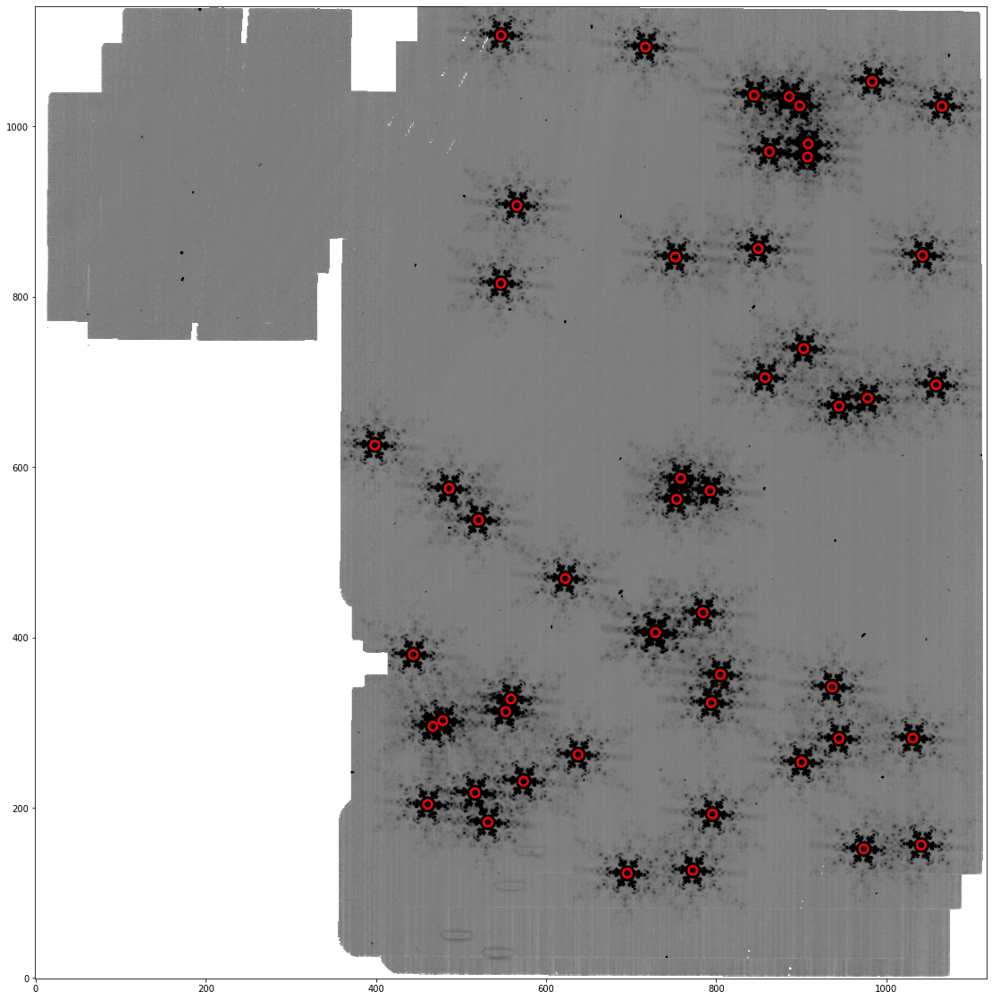

In [32]:
# mark sources on image frame to see if the correct sources were found
norm = ImageNormalize(stretch=SqrtStretch())
# keep image stretch in mind for plotting. sky subtracted range ~ (-15, 10), single sample ~ (0, 20)
plt.figure(figsize=(20,20))
plt.imshow(data, cmap='Greys', origin='lower', vmin=5,vmax=15)#, norm=norm)
apertures.plot(color='red', lw=2.5) #, alpha=0.5)
plt.show()

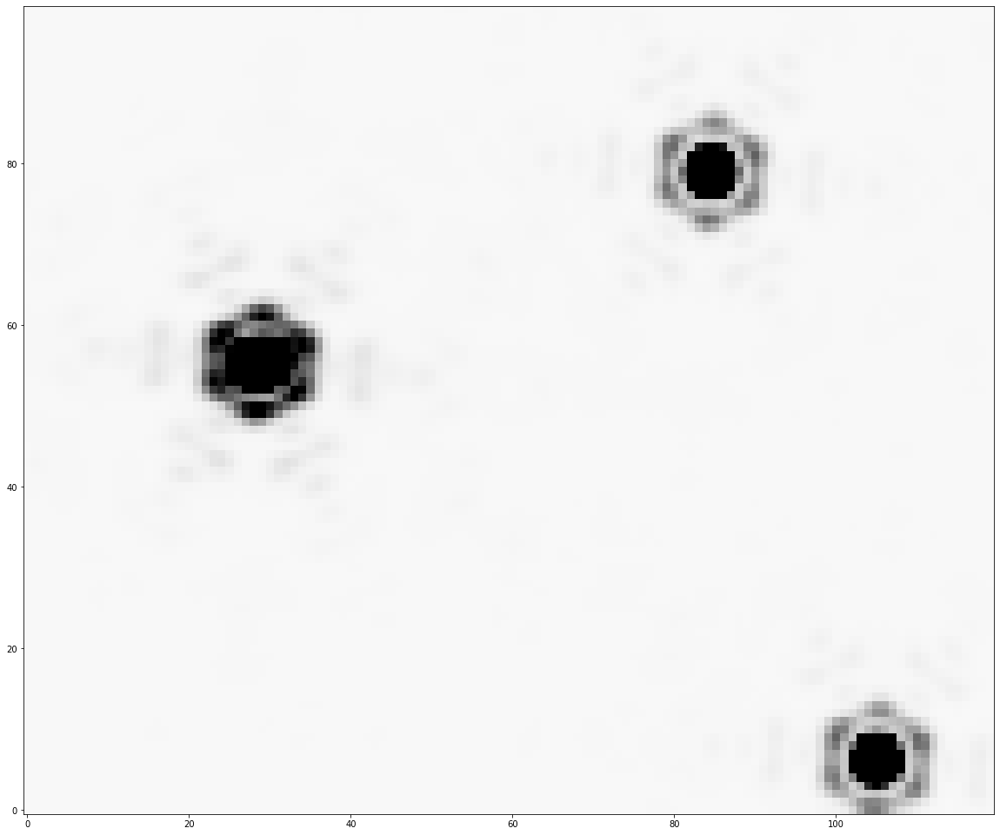

In [33]:
# Take a closer look at a portion of the image to get a closer look at the psf

# mark sources on image frame to see if the correct sources were found
norm = ImageNormalize(stretch=SqrtStretch())
# keep image stretch in mind for plotting. sky subtracted range ~ (-15, 10), single sample ~ (0, 20)
plt.figure(figsize=(20,20))

plt.imshow(data[350:450, 700:820], cmap='Greys', origin='lower', vmin=0,vmax=200)#, norm=norm)
#apertures.plot(color='red', lw=2.5) #, alpha=0.5)
#plt.scatter(sources['xcentroid']-700, sources['ycentroid']-350, color='red')
#plt.ylim(350,450)
#plt.xlim(700,820)
plt.show()

### Test again with tweakreg off

In [34]:
# Run Calwebb_image3 on the association table with tweakreg on
    
# set any specific parameters
# tweakreg parameters to allow data to run
fwhm = 3.318 #3.27  # Gaussian kernel FWHM of objects expected, default=2.5
minobj = 5  # minimum number of objects needed to match positions for a good fit, default=15
snr = 40 # signal to noise threshold, default=5
sigma = 3 # clipping limit, in sigma units, used when performing fit, default=3
fit_geom ='rshift' # ftype of affine transformation to be considered when fitting catalogs, default='general'
use2dhist = False  # boolean indicating whether to use 2D histogram to find initial offset, default=True
   
#pipe3=Image3Pipeline()    
#pipe3.tweakreg.kernel_fwhm = fwhm
#pipe3.tweakreg.snr_threshold = snr
#pipe3.tweakreg.minobj = minobj
#pipe3.tweakreg.sigma = sigma
#pipe3.tweakreg.fitgeometry = fit_geom
#pipe3.tweakreg.use2dhist = use2dhist
pipe3.tweakreg.skip = True        # test to see if this affects the final output
pipe3.outlier_detection.skip = True
pipe3.source_catalog.save_results = True
pipe3.save_results = True
#pipe3.output_dir = datadir

# run Image3

#im = pipe3.run(rtdata.input)
image = pipe3.run('starfield_50star4ptdither_asnfile.json')
print('Image 3 pipeline finished.')

2022-06-20 22:05:07,428 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('starfield_50star4ptdither_asnfile.json',).


2022-06-20 22:05:07,435 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp90cicwdg/starfield_50star4ptdither_combined.fits', 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'image3pipeline', 'search_output_file': True, 'input_dir': '', 'steps': {'assign_mtwcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': True, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'assign_mtwcs', 'search_output_file': True, 'input_dir': ''}, 'tweakreg': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': True, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': 'tweakr

2022-06-20 22:05:07,564 - stpipe.Image3Pipeline - INFO - Prefetching reference files for dataset: 'starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal.fits' reftypes = ['abvegaoffset', 'apcorr', 'drizpars']


2022-06-20 22:05:07,568 - stpipe.Image3Pipeline - INFO - Prefetch for ABVEGAOFFSET reference file is '/grp/crds/cache/references/jwst/jwst_miri_abvegaoffset_0001.asdf'.


2022-06-20 22:05:07,570 - stpipe.Image3Pipeline - INFO - Prefetch for APCORR reference file is '/grp/crds/cache/references/jwst/jwst_miri_apcorr_0005.fits'.


2022-06-20 22:05:07,571 - stpipe.Image3Pipeline - INFO - Prefetch for DRIZPARS reference file is '/grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits'.


2022-06-20 22:05:07,573 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2022-06-20 22:05:08,664 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<ModelContainer>,).


2022-06-20 22:05:08,666 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': True, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': 'tweakreg', 'search_output_file': True, 'input_dir': '', 'save_catalogs': True, 'catalog_format': 'ecsv', 'kernel_fwhm': 3.318, 'snr_threshold': 40, 'brightest': 200, 'peakmax': None, 'enforce_user_order': False, 'expand_refcat': False, 'minobj': 5, 'searchrad': 2.0, 'use2dhist': True, 'separation': 1.0, 'tolerance': 0.7, 'xoffset': 0.0, 'yoffset': 0.0, 'fitgeometry': 'rshift', 'nclip': 3, 'sigma': 3, 'align_to_gaia': False, 'gaia_catalog': 'GAIADR2', 'min_gaia': 5, 'save_gaia_catalog': False}


2022-06-20 22:05:08,667 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2022-06-20 22:05:08,679 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg done


2022-06-20 22:05:08,855 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<ModelContainer>,).


2022-06-20 22:05:08,856 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'skymatch', 'search_output_file': True, 'input_dir': '', 'skymethod': 'match', 'match_down': True, 'subtract': False, 'stepsize': None, 'skystat': 'mode', 'dqbits': '~DO_NOT_USE+NON_SCIENCE', 'lower': None, 'upper': None, 'nclip': 5, 'lsigma': 4.0, 'usigma': 4.0, 'binwidth': 0.1}


2022-06-20 22:05:09,084 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:05:09,086 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() started on 2022-06-20 22:05:09.084926


2022-06-20 22:05:09,086 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:05:09,087 - stpipe.Image3Pipeline.skymatch - INFO - Sky computation method: 'match'


2022-06-20 22:05:09,088 - stpipe.Image3Pipeline.skymatch - INFO - Sky matching direction: DOWN


2022-06-20 22:05:09,088 - stpipe.Image3Pipeline.skymatch - INFO - Sky subtraction from image data: OFF


2022-06-20 22:05:09,089 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:05:09,089 - stpipe.Image3Pipeline.skymatch - INFO - ----  Computing differences in sky values in overlapping regions.


2022-06-20 22:05:22,092 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp1_cal.fits. Sky background: 0.00258738


2022-06-20 22:05:22,095 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq1_MIRIMAGE_F1130Wexp2_cal.fits. Sky background: 0.0122796


2022-06-20 22:05:22,096 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp1_cal.fits. Sky background: 0.00816192


2022-06-20 22:05:22,097 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq2_MIRIMAGE_F1130Wexp2_cal.fits. Sky background: 0.00662269


2022-06-20 22:05:22,097 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp1_cal.fits. Sky background: 0


2022-06-20 22:05:22,098 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq3_MIRIMAGE_F1130Wexp2_cal.fits. Sky background: 0.00758915


2022-06-20 22:05:22,099 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp1_cal.fits. Sky background: 0.00479741


2022-06-20 22:05:22,099 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=starfield_50star4ptdither_seq4_MIRIMAGE_F1130Wexp2_cal.fits. Sky background: 0.0132615


2022-06-20 22:05:22,100 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:05:22,101 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() ended on 2022-06-20 22:05:22.100579


2022-06-20 22:05:22,101 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() TOTAL RUN TIME: 0:00:13.015653


2022-06-20 22:05:22,102 - stpipe.Image3Pipeline.skymatch - INFO -  


2022-06-20 22:05:22,139 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch done


2022-06-20 22:05:22,355 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<ModelContainer>,).


2022-06-20 22:05:22,358 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': True, 'suffix': 'crf', 'search_output_file': False, 'input_dir': '', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None}


2022-06-20 22:05:22,358 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2022-06-20 22:05:22,370 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection done


2022-06-20 22:05:22,547 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<ModelContainer>,).


2022-06-20 22:05:22,549 - stpipe.Image3Pipeline.resample - INFO - Step resample parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'i2d', 'search_output_file': True, 'input_dir': '', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'weight_type': 'ivm', 'output_shape': None, 'crpix': None, 'crval': None, 'rotation': None, 'pixel_scale_ratio': 1.0, 'pixel_scale': None, 'single': False, 'blendheaders': True, 'allowed_memory': None}


2022-06-20 22:05:22,566 - stpipe.Image3Pipeline.resample - INFO - Drizpars reference file: /grp/crds/cache/references/jwst/jwst_miri_drizpars_0001.fits


2022-06-20 22:05:22,745 - stpipe.Image3Pipeline.resample - INFO - Blending metadata for starfield_50star4ptdither_combined.fits


2022-06-20 22:05:23,454 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2022-06-20 22:05:24,037 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:24,959 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:25,878 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:26,801 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:27,727 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:28,655 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:29,583 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:30,504 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:30,857 - stpipe.Image3Pipeline.resample - INFO - Resampling var_rnoise


2022-06-20 22:05:31,460 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:32,399 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:33,328 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:34,250 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:35,177 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:36,096 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:37,018 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:37,937 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:38,297 - stpipe.Image3Pipeline.resample - INFO - Resampling var_poisson


2022-06-20 22:05:39,024 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:40,083 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:41,426 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:42,349 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:43,271 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:44,194 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:45,146 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:46,085 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:46,440 - stpipe.Image3Pipeline.resample - INFO - Resampling var_flat


2022-06-20 22:05:47,009 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:47,945 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:48,915 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:49,862 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:50,796 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:51,735 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:52,659 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:53,604 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1142, 1118)


2022-06-20 22:05:53,990 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  0.021880629 -0.020262886 0.024954079 0.014759789 359.990667431 0.017768647 359.987593981 -0.017254027


2022-06-20 22:05:54,432 - stpipe.Image3Pipeline.resample - INFO - Saved model in starfield_50star4ptdither_combined_i2d.fits


2022-06-20 22:05:54,433 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2022-06-20 22:05:54,670 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1142, 1118) from starfield_50star4ptdither_combined_i2d.fits>,).


2022-06-20 22:05:54,672 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'cat', 'search_output_file': True, 'input_dir': '', 'bkg_boxsize': 100, 'kernel_fwhm': 2.0, 'snr_threshold': 3.0, 'npixels': 5, 'deblend': False, 'aperture_ee1': 30, 'aperture_ee2': 50, 'aperture_ee3': 70, 'ci1_star_threshold': 2.0, 'ci2_star_threshold': 1.8}


2022-06-20 22:05:54,690 - stpipe.Image3Pipeline.source_catalog - INFO - Using APCORR reference file: /grp/crds/cache/references/jwst/jwst_miri_apcorr_0005.fits


2022-06-20 22:05:54,699 - stpipe.Image3Pipeline.source_catalog - INFO - Using ABVEGAOFFSET reference file: /grp/crds/cache/references/jwst/jwst_miri_abvegaoffset_0001.asdf


2022-06-20 22:05:54,700 - stpipe.Image3Pipeline.source_catalog - INFO - Instrument: MIRI


2022-06-20 22:05:54,701 - stpipe.Image3Pipeline.source_catalog - INFO - Detector: MIRIMAGE


2022-06-20 22:05:54,701 - stpipe.Image3Pipeline.source_catalog - INFO - Filter: F1130W


2022-06-20 22:05:54,702 - stpipe.Image3Pipeline.source_catalog - INFO - Subarray: FULL


2022-06-20 22:05:54,754 - stpipe.Image3Pipeline.source_catalog - INFO - AB to Vega magnitude offset 5.49349


2022-06-20 22:05:55,303 - stpipe.Image3Pipeline.source_catalog - INFO - Detected 520 sources


2022-06-20 22:05:55,857 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote source catalog: starfield_50star4ptdither_combined_cat.ecsv


2022-06-20 22:05:55,974 - stpipe.Image3Pipeline.source_catalog - INFO - Saved model in starfield_50star4ptdither_combined_segm.fits


2022-06-20 22:05:55,976 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote segmentation map: starfield_50star4ptdither_combined_segm.fits


2022-06-20 22:05:55,977 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog done


2022-06-20 22:05:55,979 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


Image 3 pipeline finished.


In [35]:
im = ImageModel('starfield_50star4ptdither_combined_i2d.fits')
pixarea = im.meta.photometry.pixelarea_steradians
print('Pixel area in steradians', pixarea)

# pull out data portion of input file
data = im.data

# print stats on input image
mean, median, std = sigma_clipped_stats(data, sigma=200.0, maxiters=5)  # default sigma=3
print('Image mean, median and std',mean, median, std)

Pixel area in steradians 2.84403609523084e-13


Image mean, median and std 10.150862 10.816078 38.378338


Number of sources found with DAOStarFinder:  53
    xcentroid          ycentroid                RA                     Dec          
------------------ ------------------ ---------------------- -----------------------
  695.585776112344   122.834262537915  0.0008790960591962484   -0.014623804201933937
 772.6017877671096 126.26968385287942     359.99852642678394   -0.014311175000364341
 973.4892523508298  151.5056066875812     359.99243355874603   -0.012996597663287137
1041.0470776199775  156.0626772581467      359.9903739704418   -0.012675024544997172
 531.6363570022298 182.85517527014605   0.006068604713303265   -0.013224327308012759
  795.810277651175 192.30053511395235     359.99799238043056   -0.012223690571236661
460.99247823080657 203.85432246345692    0.00829161487822159   -0.012770451708592038
 516.4775392160169 217.46310926648974   0.006626632850906603    -0.01220377337145032
 573.6679717794119 231.04195340673564   0.004909270170172627   -0.011633423654002564
 900.387974523155

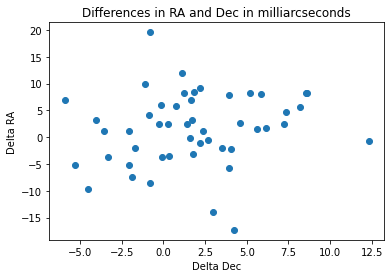


RA difference mean, median and std (units in mas) 1.7805352132316612 1.672047255851794 3.8957032498583533
Dec difference mean, median and std (units in mas) 1.5955753956851049 2.4046217676543247 6.730500918309516


In [36]:
# Run DAOStarFinder to find sources in image

ap_radius = 5.  # radius for aperture for centroiding and photometry

daofind = DAOStarFinder(fwhm=3.0, threshold=10.*std)    # default threshold=5*std, fwhm=3
sources = daofind(data)    

#sources.pprint_all()
#print(sources['xcentroid','ycentroid','peak'])   

# Create apertures for x,y positions
positions = tuple(zip(sources['xcentroid'], sources['ycentroid']))
#print(positions)

#positions = (sources['xcentroid'], sources['ycentroid'])
apertures = CircularAperture(positions, r=ap_radius)


# using wcs info from images, put coordinates into RA, Dec
ra, dec = im.meta.wcs(sources['xcentroid'], sources['ycentroid'])

print('Number of sources found with DAOStarFinder: ',np.size(ra))
# add RA, Dec to sources table

ra_col = Column(name='RA', data=ra)
dec_col = Column(name='Dec', data=dec)
sources.add_column(ra_col)
sources.add_column(dec_col)

# print RA, Dec for each x, y position found
#print(sources['xcentroid', 'ycentroid', 'RA', 'Dec'])  

sources_sub = sources['xcentroid', 'ycentroid', 'RA', 'Dec']
sources_sub.pprint_all()
print()

# Compare input RA, Dec to found RA, Dec
#print('       RA found       Dec found    RA_Diff (mas)  Dec_diff (mas) pass/fail')

deltara_twoff = []
deltadec_twoff = []

# Put ra, dec coords into a table
cat1_sim = Table([RA_sim, Dec_sim], names=('ra', 'dec'))
cat2_calc = Table([ra, dec], names=('ra', 'dec'))
    
# Get coordinates with SkyCoord for each catalog
    
coord_cat1_sim = SkyCoord(ra=cat1_sim['ra'], dec=cat1_sim['dec'], unit="deg")
coord_cat2_calc = SkyCoord(ra=cat2_calc['ra'], dec=cat2_calc['dec'], unit="deg")    
ind_cat2_cat1, dist_2d, _ = match_coordinates_sky(coord_cat1_sim, coord_cat2_calc)
    
# Find where the catalogs match
    
cat1_matched = cat1_sim[dist_2d.arcsec<0.05]
cat2_matched = cat2_calc[ind_cat2_cat1[dist_2d.arcsec<0.05]]
    
#print(cat1_matched)
    
# Get differences in RA, Dec
ra_diff = cat2_matched['ra'] - cat1_matched['ra']
dec_diff = cat2_matched['dec'] - cat1_matched['dec'] 
    
#print(ra_diff)
    
# put differences in milliarcseconds
ra_diff = ra_diff * 3600000
dec_diff = dec_diff * 3600000

    
# Compare input RA, Dec to found RA, Dec
print('RA_Diff (mas)  Dec_diff (mas) pass/fail')
# Find if the differences are within the allowed 30 mas range
for i in np.arange(0,len(ra_diff)):
    #if ra_diff[i] < 30 and dec_diff[i] < 30:
    deltara_twoff.append(ra_diff[i])
    deltadec_twoff.append(dec_diff[i])
    if abs(ra_diff[i]) < 30 and abs(dec_diff[i]) < 30: 
        test = 'pass' 
    else: 
        test = 'fail'
    print('{:15.6f} {:15.6f} {}'.format(ra_diff[i], dec_diff[i], test))
 
    
# Plot ra and dec differences
plt.title ('Differences in RA and Dec in milliarcseconds')
plt.ylabel('Delta RA')
plt.xlabel('Delta Dec')
plt.scatter(deltara_twoff,deltadec_twoff)
plt.show()

# Plot should show no differences greater than 30 milliarcseconds 

print()
    
meanRAdiff_twoff, medianRAdiff_twoff, stdRAdiff_twoff = sigma_clipped_stats(deltara_twoff, sigma=5.0, maxiters=5)  # default sigma=3
meanDecdiff_twoff, medianDecdiff_twoff, stdDecdiff_twoff = sigma_clipped_stats(deltadec_twoff, sigma=5.0, maxiters=5)  # default sigma=3

print('RA difference mean, median and std (units in mas)',meanRAdiff_twoff, medianRAdiff_twoff, stdRAdiff_twoff) 
print('Dec difference mean, median and std (units in mas)',meanDecdiff_twoff, medianDecdiff_twoff, stdDecdiff_twoff)

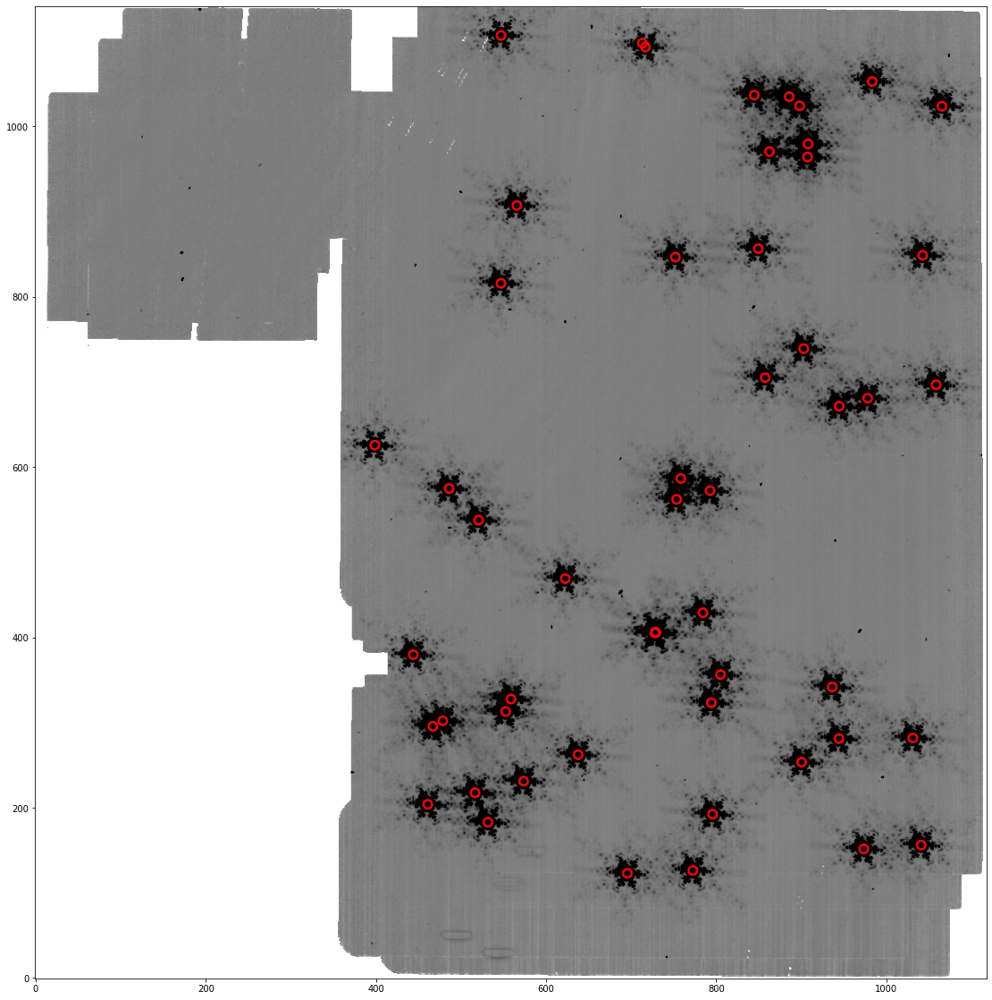

In [37]:
# mark sources on image frame to see if the correct sources were found
norm = ImageNormalize(stretch=SqrtStretch())
# keep image stretch in mind for plotting. sky subtracted range ~ (-15, 10), single sample ~ (0, 20)
plt.figure(figsize=(20,20))
plt.imshow(data, cmap='Greys', origin='lower', vmin=5,vmax=15)#, norm=norm)
apertures.plot(color='red', lw=2.5) #, alpha=0.5)
plt.show()

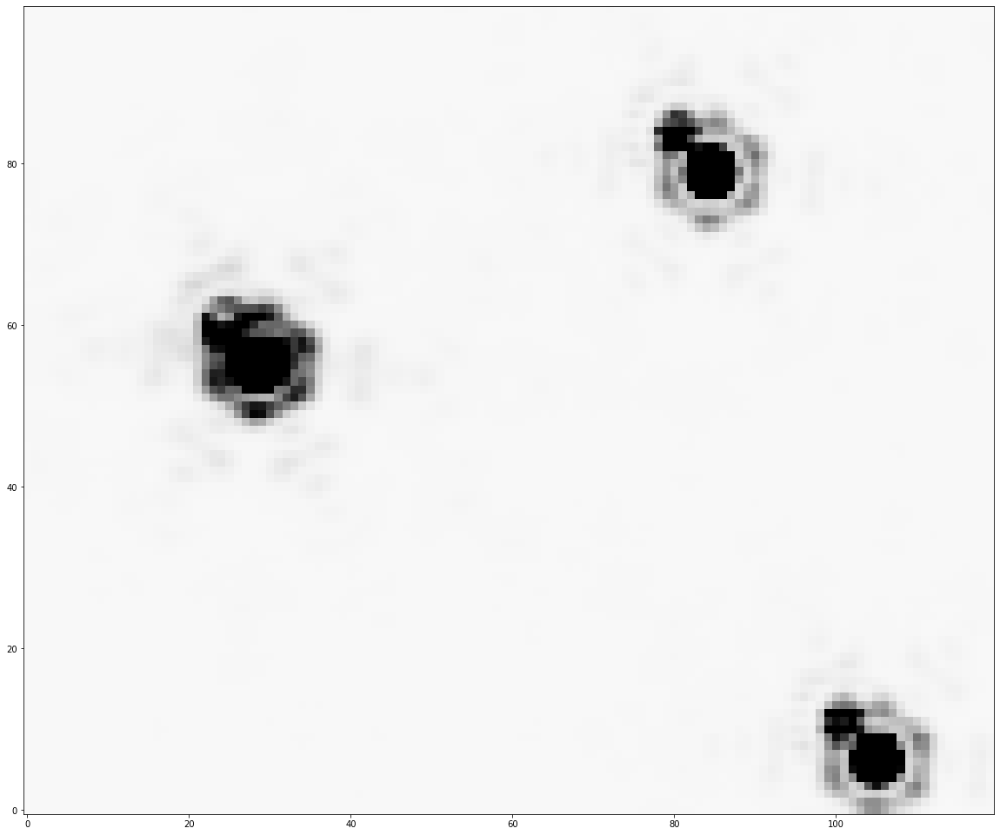

In [38]:
# Take a closer look at a portion of the image to get a closer look at the psf

# mark sources on image frame to see if the correct sources were found
norm = ImageNormalize(stretch=SqrtStretch())
# keep image stretch in mind for plotting. sky subtracted range ~ (-15, 10), single sample ~ (0, 20)
plt.figure(figsize=(20,20))

plt.imshow(data[350:450, 700:820], cmap='Greys', origin='lower', vmin=0,vmax=200)#, norm=norm)

#plt.scatter(sources['xcentroid']-700, sources['ycentroid']-350, color='red')

plt.show()

In [39]:
# Compare stats across tests:
print('All units are milliarcseconds for statistics')
print('Statistics on differences between RA and Dec in individual calibrated files')
print('RA difference mean, median and std',meanRAdiff_cal, medianRAdiff_cal, stdRAdiff_cal) 
print('Dec difference mean, median and std',meanDecdiff_cal, medianDecdiff_cal, stdDecdiff_cal)
print()
#print('Statistics on differences between RA and Dec in individual i2d files when run with tweakreg on')
#print('RA difference mean, median and std',meanRAdiff_i2d, medianRAdiff_i2d, stdRAdiff_i2d) 
#print('Dec difference mean, median and std',meanDecdiff_i2d, medianDecdiff_i2d, stdDecdiff_i2d)
#print()
print('Statistics on differences between RA and Dec in combined i2d file when run with tweakreg on')
print('RA difference mean, median and std',meanRAdiff_twon, medianRAdiff_twon, stdRAdiff_twon) 
print('Dec difference mean, median and std',meanDecdiff_twon, medianDecdiff_twon, stdDecdiff_twon)
print()
print('Statistics on differences between RA and Dec in combined i2d file when run with tweakreg off')
print('RA difference mean, median and std',meanRAdiff_twoff, medianRAdiff_twoff, stdRAdiff_twoff) 
print('Dec difference mean, median and std',meanDecdiff_twoff, medianDecdiff_twoff, stdDecdiff_twoff)

All units are milliarcseconds for statistics
Statistics on differences between RA and Dec in individual calibrated files
RA difference mean, median and std 1.1084997025612093 0.928302277808206 3.5773131993903524
Dec difference mean, median and std -0.17537865973407207 1.1691161048078824 5.539940734870295

Statistics on differences between RA and Dec in combined i2d file when run with tweakreg on
RA difference mean, median and std 1.1220575628978426 0.7866620390517207 3.7478347153110656
Dec difference mean, median and std 0.9367013327956238 1.358465583157706 5.969151909744572

Statistics on differences between RA and Dec in combined i2d file when run with tweakreg off
RA difference mean, median and std 1.7805352132316612 1.672047255851794 3.8957032498583533
Dec difference mean, median and std 1.5955753956851049 2.4046217676543247 6.730500918309516


### Criteria for success.

If the first set of images with no shift are well aligned as shown in images and the statistical comparison, that test passes.

Once a shift is added, the statistics and number of sources found don't tell the whole story. Look at the combined images shown after image3 with and without tweakreg. If the image run with tweakreg shows double sources just like the image without tweakreg, then the test fails. If the image doesn't show double sources and looks like the unshifted combined image, then the test passes. Examine the image to look for obvious faults like stars that were not identified as stars, those with multiple star identifications, double star images, etc.

#### About this Notebook

Authors: M. Cracraft, M. Libralato and K. Gordon, MIRI Branch

Updated On: 08/25/2021